In [1]:
import jax
import jax.numpy as jnp
import jax.tree_util as jtu
import time
import os
from dataclasses import dataclass
from collections import namedtuple
import pyro
import optax
from pyro.infer import SVI, TraceGraph_ELBO
import pyro.distributions as dist
import pyro.poutine as poutine
import pyro.contrib.examples.multi_mnist as multi_mnist
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.gridspec import GridSpec
import matplotlib.font_manager as font_manager
from matplotlib.patches import Rectangle
import matplotlib.ticker as ticker
import matplotlib.patches as patches
import seaborn as sns
from matplotlib import cm
from matplotlib.ticker import LinearLocator
from matplotlib import rcParams
from scipy.interpolate import griddata
import genjax
from genjax import grasp

# import sys
# sys.setrecursionlimit(10000)

key = jax.random.PRNGKey(314159)
sns.set_theme(style="white")
font_path = (
    "/home/femtomc/.local/share/fonts/Unknown Vendor/TrueType/Lato/Lato_Bold.ttf"
)
font_manager.fontManager.addfont(font_path)
custom_font_name = font_manager.FontProperties(fname=font_path).get_name()
rcParams["font.family"] = custom_font_name

key = jax.random.PRNGKey(314159)
label_fontsize = 70  # Set the desired font size here

smoke_test = "CI" in os.environ
assert pyro.__version__.startswith("1.8.6")

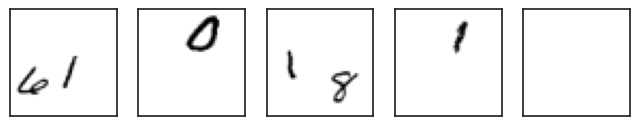

In [2]:
inpath = "./data/air/.data"
X_np, Y = multi_mnist.load(inpath)
X_np = X_np.astype(np.float32)
X_np /= 255.0
mnist = jnp.array(X_np)
true_counts = jnp.array([len(objs) for objs in Y])


def show_images(imgs):
    fig = plt.figure(figsize=(8, 2))
    for i, img in enumerate(imgs):
        ax = plt.subplot(1, len(imgs), i + 1)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.imshow(img, cmap="gray_r")


show_images(mnist[9:14])

## Defining the variational ingredients

### Utilities / learnable pieces

In [3]:
from genjax import Pytree
import equinox as eqx
from genjax.typing import Any
from genjax.typing import Tuple
from genjax.typing import FloatArray
from genjax.typing import Int
from genjax.typing import IntArray
from genjax.typing import PRNGKey
from genjax.typing import typecheck

# Utilities for defining the model and the guide.


@dataclass
class Decoder(Pytree):
    dense_1: Any
    dense_2: Any

    def flatten(self):
        return (self.dense_1, self.dense_2), ()

    @classmethod
    def new(cls, key1, key2):
        dense_1 = eqx.nn.Linear(50, 200, key=key1)
        dense_2 = eqx.nn.Linear(200, 400, key=key2)
        return Decoder(dense_1, dense_2)

    def __call__(self, z_what):
        v = self.dense_1(z_what)
        v = jax.nn.leaky_relu(v)
        v = self.dense_2(v)
        return jax.nn.sigmoid(v)


# Create our decoder.
key, sub_key1, sub_key2 = jax.random.split(key, 3)
decoder = Decoder.new(sub_key1, sub_key2)

# Create our RNN for the guide.
key, sub_key = jax.random.split(key)
rnn = eqx.nn.LSTMCell(2554, 256, key=sub_key)


@dataclass
class Encoder(Pytree):
    dense_1: Any
    dense_2: Any

    def flatten(self):
        return (self.dense_1, self.dense_2), ()

    @classmethod
    def new(cls, key1, key2):
        dense_1 = eqx.nn.Linear(400, 200, key=key1)
        dense_2 = eqx.nn.Linear(200, 100, key=key2)
        return Encoder(dense_1, dense_2)

    def __call__(self, data):
        v = self.dense_1(data)
        v = jax.nn.leaky_relu(v)
        v = self.dense_2(v)
        return v[0:50], jax.nn.softplus(v[50:])


key, sub_key1, sub_key2 = jax.random.split(key, 3)
encoder = Encoder.new(sub_key1, sub_key2)


@dataclass
class Predict(Pytree):
    dense: Any

    def flatten(self):
        return (self.dense,), ()

    @classmethod
    def new(cls, key):
        dense = eqx.nn.Linear(256, 7, key=key)
        return Predict(dense)

    def __call__(self, h):
        a = self.dense(h)
        z_pres_p = jax.nn.sigmoid(a[0:1])
        z_where_loc = a[1:4]
        z_where_scale = jax.nn.softplus(a[4:])
        return z_pres_p, z_where_loc, z_where_scale


key, sub_key = jax.random.split(key)
predict = Predict.new(key)

In [4]:
#######
# STN #
#######

# modified from https://github.com/kevinzakka/spatial-transformer-network/blob/master/stn/transformer.py


def affine_grid_generator(height, width, theta):
    """
    This function returns a sampling grid, which when
    used with the bilinear sampler on the input feature
    map, will create an output feature map that is an
    affine transformation [1] of the input feature map.

    Input
    -----
    - height: desired height of grid/output. Used
      to downsample or upsample.

    - width: desired width of grid/output. Used
      to downsample or upsample.

    - theta: affine transform matrices of shape (num_batch, 2, 3).
      For each image in the batch, we have 6 theta parameters of
      the form (2x3) that define the affine transformation T.

    Returns
    -------
    - normalized grid (-1, 1) of shape (num_batch, 2, H, W).
      The 2nd dimension has 2 components: (x, y) which are the
      sampling points of the original image for each point in the
      target image.

    Note
    ----
    [1]: the affine transformation allows cropping, translation,
         and isotropic scaling.
    """
    num_batch = theta.shape[0]

    # create normalized 2D grid
    x = jnp.linspace(-1.0, 1.0, width)
    y = jnp.linspace(-1.0, 1.0, height)
    x_t, y_t = jnp.meshgrid(x, y)

    # flatten
    x_t_flat = jnp.reshape(x_t, [-1])
    y_t_flat = jnp.reshape(y_t, [-1])

    # reshape to [x_t, y_t , 1] - (homogeneous form)
    ones = jnp.ones_like(x_t_flat)
    sampling_grid = jnp.stack([x_t_flat, y_t_flat, ones])

    # repeat grid num_batch times
    sampling_grid = jnp.expand_dims(sampling_grid, axis=0)
    sampling_grid = jnp.tile(sampling_grid, [num_batch, 1, 1])

    # transform the sampling grid - batch multiply
    batch_grids = jnp.matmul(theta, sampling_grid)
    # batch grid has shape (num_batch, 2, H*W)

    # reshape to (num_batch, 2, H, W)
    batch_grids = jnp.reshape(batch_grids, [num_batch, 2, height, width])

    return batch_grids


def bilinear_sampler(img, x, y):
    """
    Performs bilinear sampling of the input images according to the
    normalized coordinates provided by the sampling grid. Note that
    the sampling is done identically for each channel of the input.

    To test if the function works properly, output image should be
    identical to input image when theta is initialized to identity
    transform.

    Input
    -----
    - img: batch of images in (B, H, W, C) layout.
    - grid: x, y which is the output of affine_grid_generator.

    Returns
    -------
    - out: interpolated images according to grids. Same size as grid.
    """
    H = jnp.shape(img)[1]
    W = jnp.shape(img)[2]
    max_y = H - 1
    max_x = W - 1
    zero = jnp.zeros([], dtype=int)

    # rescale x and y to [0, W-1/H-1]
    x = 0.5 * ((x + 1.0) * max_x - 1)
    y = 0.5 * ((y + 1.0) * max_y - 1)

    # grab 4 nearest corner points for each (x_i, y_i)
    x0 = jnp.floor(x).astype(int)
    x1 = x0 + 1
    y0 = jnp.floor(y).astype(int)
    y1 = y0 + 1

    # clip to range [0, H-1/W-1] to not violate img boundaries
    x0 = jnp.clip(x0, zero, max_x)
    x1 = jnp.clip(x1, zero, max_x)
    y0 = jnp.clip(y0, zero, max_y)
    y1 = jnp.clip(y1, zero, max_y)

    # get pixel value at corner coords
    Ia = get_pixel_value(img, x0, y0)
    Ib = get_pixel_value(img, x0, y1)
    Ic = get_pixel_value(img, x1, y0)
    Id = get_pixel_value(img, x1, y1)

    # recast as float for delta calculation
    x0 = x0.astype(float)
    x1 = x1.astype(float)
    y0 = y0.astype(float)
    y1 = y1.astype(float)

    # calculate deltas
    wa = (x1 - x) * (y1 - y)
    wb = (x1 - x) * (y - y0)
    wc = (x - x0) * (y1 - y)
    wd = (x - x0) * (y - y0)

    # add dimension for addition
    wa = jnp.expand_dims(wa, axis=3)
    wb = jnp.expand_dims(wb, axis=3)
    wc = jnp.expand_dims(wc, axis=3)
    wd = jnp.expand_dims(wd, axis=3)

    # compute output
    out = wa * Ia + wb * Ib + wc * Ic + wd * Id
    return out


def get_pixel_value(img, x, y):
    """
    Utility function to get pixel value for coordinate
    vectors x and y from a  4D tensor image.

    Input
    -----
    - img: tensor of shape (B, H, W, C)
    - x: flattened tensor of shape (B*H*W,)
    - y: flattened tensor of shape (B*H*W,)

    Returns
    -------
    - output: tensor of shape (B, H, W, C)
    """
    batch_size, height, width = jnp.shape(x)

    batch_idx = jnp.arange(0, batch_size)
    batch_idx = jnp.reshape(batch_idx, (batch_size, 1, 1))
    b = jnp.tile(batch_idx, (1, height, width))

    indices = jnp.stack([b, y, x], 3)

    return gather_nd(img, indices)


# from: https://github.com/google/jax/discussions/6119
def gather_nd_unbatched(params, indices):
    return params[tuple(jnp.moveaxis(indices, -1, 0))]


def gather_nd(params, indices, batch=False):
    if not batch:
        return gather_nd_unbatched(params, indices)
    else:
        return vmap(gather_nd_unbatched, (0, 0), 0)(params, indices)


def expand_z_where(z_where):
    # Takes 3-dimensional vectors, and massages them into 2x3 matrices with elements like so:
    # [s,x,y] -> [[s,0,x],
    #             [0,s,y]]
    n = 1
    expansion_indices = jnp.array([1, 0, 2, 0, 1, 3])
    z_where = jnp.expand_dims(z_where, axis=0)
    out = jnp.concatenate((jnp.broadcast_to(jnp.zeros([1, 1]), (n, 1)), z_where), 1)
    return jnp.reshape(out[:, expansion_indices], (n, 2, 3))


def object_to_image(z_where, obj):
    n = 1
    theta = expand_z_where(z_where)
    grid = affine_grid_generator(50, 50, theta)
    x_s = grid[:, 0, :, :]
    y_s = grid[:, 1, :, :]
    out = bilinear_sampler(jnp.reshape(obj, (n, 20, 20, 1)), x_s, y_s)
    return jnp.reshape(out, (50, 50))


def z_where_inv(z_where):
    # Take a batch of z_where vectors, and compute their "inverse".
    # That is, for each row compute:
    # [s,x,y] -> [1/s,-x/s,-y/s]
    # These are the parameters required to perform the inverse of the
    # spatial transform performed in the generative model.
    n = 1
    out = jnp.array([1, *(-z_where[1:])])
    out = out / z_where[0]
    return out


def image_to_object(z_where, image):
    n = 1
    theta_inv = expand_z_where(z_where_inv(z_where))
    grid = affine_grid_generator(20, 20, theta_inv)
    x_s = grid[:, 0, :, :]
    y_s = grid[:, 1, :, :]
    out = bilinear_sampler(jnp.reshape(image, (n, 50, 50, 1)), x_s, y_s)
    return jnp.reshape(out, (400,))

### Model

In [5]:
#########
# Model #
#########

# Fixed constants.
z_where_prior_loc = jnp.array([3.0, 0.0, 0.0])
z_where_prior_scale = jnp.array([0.2, 1.0, 1.0])
z_what_prior_loc = jnp.zeros(50, dtype=float)
z_what_prior_scale = jnp.ones(50, dtype=float)
z_pres_prior = 0.008
eps = 1e-4


@genjax.gen
@typecheck
def step(
    t: Int,
    decoder: Decoder,
    prev_x: FloatArray,
    prev_z_pres: IntArray,
):
    z_pres = grasp.flip_mvd(z_pres_prior ** (2 * t + 1)) @ f"z_pres_{t}"
    z_pres = jnp.array([z_pres.astype(int)])
    z_where = (
        grasp.mv_normal_diag_reparam(z_where_prior_loc, z_where_prior_scale)
        @ f"z_where_{t}"
    )
    z_what = (
        grasp.mv_normal_diag_reparam(z_what_prior_loc, z_what_prior_scale)
        @ f"z_what_{t}"
    )
    y_att = decoder(z_what)
    y = object_to_image(z_where, y_att)
    x = prev_x + (y * z_pres)
    return x, z_pres


# TODO: Make sure that this works, where t is a static int.
@genjax.gen
@typecheck
def model(decoder: Decoder):
    x = jnp.zeros((50, 50), dtype=float)
    z_pres = jnp.ones(1, dtype=int)
    for t in range(3):
        x, z_pres = step.inline(t, decoder, x, z_pres)
    obs = grasp.mv_normal_diag_reparam(x, 0.3 * jnp.ones_like(x)) @ "obs"
    return x

#### Samples from the model

In [6]:
tr = jax.jit(model.simulate)(key, (decoder,))
tr.strip()

HierarchicalChoiceMap(trie=Trie(inner={'obs': ValueChoiceMap(value=Array([[-0.37018886, -0.01934493,  0.09569342, ...,  0.01104029,
         0.34886238,  0.16937473],
       [ 0.36346376, -0.49132156, -0.43574902, ...,  0.02662856,
         0.02966191, -0.14769068],
       [ 0.1374611 , -0.42084956,  0.25231507, ..., -0.50371206,
        -0.36252576, -0.70729965],
       ...,
       [ 0.19400066,  0.08035522,  0.07734819, ..., -0.00641754,
        -0.38751316,  0.43948144],
       [-0.11401426,  0.14001611, -0.02348737, ...,  0.27000728,
         0.05413937,  0.17224255],
       [-0.3983465 , -0.04375459,  0.2363752 , ...,  0.71568847,
         0.28117728,  0.25105557]], dtype=float32)), 'z_pres_2': ValueChoiceMap(value=Array(False, dtype=bool)), 'z_where_2': ValueChoiceMap(value=Array([3.3112705 , 0.38920578, 0.87010336], dtype=float32)), 'z_where_1': ValueChoiceMap(value=Array([ 3.2994215,  1.054263 , -0.5947693], dtype=float32)), 'z_pres_1': ValueChoiceMap(value=Array(False, dtype=b

### Guide

In [7]:
#########
# Guide #
#########


@genjax.gen
@typecheck
def guide_step(
    t: Int,
    rnn: eqx.nn.LSTMCell,
    encoder: Encoder,
    predict: Predict,
    data,
    prev: Tuple,
):
    (prev_z_where, prev_z_what, prev_z_pres, prev_h, prev_c) = prev
    rnn_input = jnp.concatenate([data, prev_z_where, prev_z_what, prev_z_pres])
    h, c = rnn(rnn_input, (prev_h, prev_c))
    z_pres_p, z_where_loc, z_where_scale = predict(h)
    z_pres = (
        grasp.flip_mvd((eps + (z_pres_p[0] * prev_z_pres[0])) / (1 + 2 * eps))
        @ f"z_pres_{t}"
    )
    z_pres = jnp.array([z_pres.astype(int)])
    z_where = grasp.mv_normal_diag_reparam(z_where_loc, z_where_scale) @ f"z_where_{t}"
    x_att = image_to_object(z_where, data)
    z_what_loc, z_what_scale = encoder(x_att)
    z_what = grasp.mv_normal_diag_reparam(z_what_loc, z_what_scale) @ f"z_what_{t}"
    return z_where, z_what, z_pres, h, c


@genjax.gen
@typecheck
def guide(
    data: genjax.ChoiceMap,
    rnn: eqx.nn.LSTMCell,
    encoder: Encoder,
    predict: Predict,
):
    h = jnp.zeros(256)
    c = jnp.zeros(256)
    z_pres = jnp.ones(1)
    z_where = jnp.zeros(3)
    z_what = jnp.zeros(50)
    img = data["obs"]
    img_arr = img.flatten()

    for t in range(3):
        (z_where, z_what, z_pres, h, c) = guide_step.inline(
            t, rnn, encoder, predict, img_arr, (z_where, z_what, z_pres, h, c)
        )

#### Samples from the guide

In [8]:
data_chm = genjax.choice_map({"obs": jnp.ones((50, 50))})
tr = jax.jit(guide.simulate)(key, (data_chm, rnn, encoder, predict))
tr.strip()

HierarchicalChoiceMap(trie=Trie(inner={'z_pres_2': ValueChoiceMap(value=Array(False, dtype=bool)), 'z_where_2': ValueChoiceMap(value=Array([1.44559   , 0.09122826, 0.39324838], dtype=float32)), 'z_where_1': ValueChoiceMap(value=Array([ 1.3117653,  0.5462594, -0.6296631], dtype=float32)), 'z_pres_1': ValueChoiceMap(value=Array(False, dtype=bool)), 'z_what_0': ValueChoiceMap(value=Array([ 0.47881928, -0.6001495 , -0.07596396, -0.46712643, -0.6377853 ,
        0.4880015 , -0.0026071 , -0.0648842 ,  0.68812644,  0.55307406,
        1.4098706 , -1.0631292 , -0.40985143,  1.1942633 , -0.6337316 ,
        0.90972066, -0.7271465 , -0.3805505 , -0.08980705, -0.8501938 ,
        0.43871439,  0.5818898 ,  0.29893732,  0.57461274, -0.11380556,
        0.41587007,  0.20875463,  0.9551446 ,  0.2335587 ,  0.05214904,
        0.95153826,  0.15101334,  0.06873246,  0.2672779 ,  0.7856569 ,
       -1.0018222 , -0.40071332,  0.05744316, -0.86725295, -0.23935616,
        0.37568498,  0.7159259 , -0.024959

## Training

### Make sure grads are working

#### Define ELBO objective

In [9]:
data = genjax.choice_map({"obs": jnp.ones((50, 50))})
objective = grasp.elbo(model, guide, data)
objective

Expectation(prog=ADEVProgram(source=<function elbo.<locals>.elbo_loss at 0x7ff53c180940>))

#### Go go grads

In [10]:
jitted = jax.jit(objective.value_and_grad_estimate)
loss, ((decoder_grads,), (_, rnn_grads, encoder_grads, predict_grads)) = jitted(
    key, ((decoder,), (data, rnn, encoder, predict))
)

In [11]:
loss

Array(-13631.906, dtype=float32)

### Dataloader

In [12]:
def data_loader(
    data,
    batch_size,
    shuffle=True,
):
    N = len(data)
    data_idxs = np.arange(N)
    num_batch = int(np.ceil(N // batch_size))

    def init(key):
        return (
            num_batch,
            jax.random.permutation(key, data_idxs) if shuffle else data_idxs,
        )

    def get_batch(i=0, idxs=data_idxs):
        ret_idx = jax.lax.dynamic_slice_in_dim(idxs, i * batch_size, batch_size)
        return jax.lax.index_take(data, (ret_idx,), axes=(0,))

    return init, get_batch

In [13]:
##################
# Count Accuracy #
##################


def count_accuracy(data, true_counts, guide, batch_size=1000):
    global prng_key
    assert data.shape[0] == true_counts.shape[0], "Size mismatch."
    assert data.shape[0] % batch_size == 0, "Input size must be multiple of batch_size."

    def eval_guide(key, data, params):
        data_chmp = genjax.choice_map({"obs": data})
        return guide.simulate(key, (data_chmp, *params))

    batch_eval_guide = jax.jit(jax.vmap(eval_guide, in_axes=(0, 0, None)))

    @jax.jit
    def evaluate_count_accuracy(key, params):
        def evaluate_batch(counts, batch_id):
            data_batch = jax.lax.dynamic_slice_in_dim(
                data, batch_id * batch_size, batch_size
            )
            true_counts_batch = jax.lax.dynamic_slice_in_dim(
                true_counts, batch_id * batch_size, batch_size
            )
            data_chmp = genjax.choice_map({"obs": data_batch})
            # evaluate guide
            keys = jax.random.split(jax.random.fold_in(key, batch_id), batch_size)
            tr = batch_eval_guide(keys, data_batch, params)
            z_where = [tr[f"z_where_{i}"] for i in range(3)]
            z_pres = [tr[f"z_pres_{i}"] for i in range(3)]
            # compute stats
            inferred_counts = sum(z for z in z_pres)
            true_counts_m = jax.nn.one_hot(true_counts_batch, 3)
            inferred_counts_m = jax.nn.one_hot(inferred_counts, 4)
            counts += (true_counts_m.T @ inferred_counts_m).astype(int)
            error_ind = 1 - (true_counts_batch == inferred_counts).astype(int)
            # error_ix = error_ind.nonzero()[0]
            # error_latent = jnp.take(latents_to_tensor((z_where, z_pres)), error_ix, 0)
            return counts, error_ind

        counts = jnp.zeros((3, 4), dtype=int)
        counts, error_indices = jax.lax.scan(
            evaluate_batch, counts, jnp.arange(data.shape[0] // batch_size)
        )

        acc = jnp.sum(jnp.diag(counts)).astype(float) / data.shape[0]
        error_indices = jnp.concatenate(
            error_indices
        )  # .nonzero()[0]  # <- not JIT compilable
        return acc, counts, error_indices

    return evaluate_count_accuracy


# Combine z_pres and z_where (as returned by the model and guide) into
# a single tensor, with size:
# [batch_size, num_steps, z_where_size + z_pres_size]
def latents_to_tensor(z):
    return jnp.stack(
        [
            jnp.concatenate((z_where, z_pres.reshape(-1, 1)), 1)
            for z_where, z_pres in zip(*z)
        ]
    ).transpose(1, 0, 2)

In [14]:
##################
# Visualization  #
##################


def bounding_box(z_where, x_size):
    """This doesn't take into account interpolation, but it's close
    enough to be usable."""
    w = x_size / z_where.s
    h = x_size / z_where.s
    xtrans = -z_where.x / z_where.s * x_size / 2.0
    ytrans = -z_where.y / z_where.s * x_size / 2.0
    x = (x_size - w) / 2 + xtrans  # origin is top left
    y = (x_size - h) / 2 + ytrans
    return (x, y), w, h


z_obj = namedtuple("z", ["s", "x", "y", "pres"])


# Map a tensor of latents (as produced by latents_to_tensor) to a list
# of z_obj named tuples.
def tensor_to_objs(latents):
    return [[z_obj._make(step) for step in z] for z in latents]


def visualize_model(model, guide):
    def reconstruct_digits(key, data, params):
        decoder, rnn, encoder, predict = params
        data_chmp = genjax.choice_map({"obs": data})
        key1, key2 = jax.random.split(key)
        tr = guide.simulate(key1, (data_chmp, rnn, encoder, predict))
        _, tr = model.importance(key2, tr, (decoder,))
        reconstruction = tr.get_retval()
        z_where = [tr[f"z_where_{i}"] for i in range(3)]
        z_pres = [tr[f"z_pres_{i}"] for i in range(3)]
        return reconstruction, (z_where, z_pres)

    batch_reconstruct_digits = jax.jit(
        jax.vmap(reconstruct_digits, in_axes=(0, 0, None))
    )

    def visualize(key, params, examples_to_viz):
        keys = jax.random.split(key, examples_to_viz.shape[0])
        recons, z = batch_reconstruct_digits(keys, examples_to_viz, params)
        z_wheres = tensor_to_objs(latents_to_tensor(z))
        draw_many(examples_to_viz.reshape(-1, 50, 50), z_wheres, title="Original")
        draw_many(recons, z_wheres, title="Reconstruction")

    return visualize


def colors(k):
    return ["r", "g", "b"][k % 3]


def draw_one(img, z):
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img, cmap="gray_r")
    for k, z in enumerate(z):
        if z.pres > 0:
            (x, y), w, h = bounding_box(z, img.shape[0])
            plt.gca().add_patch(
                Rectangle(
                    (x, y), w, h, linewidth=1, edgecolor=colors(k), facecolor="none"
                )
            )


def draw_many(imgs, zs, title):
    plt.figure(figsize=(8, 1.9))
    plt.title(title)
    plt.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False)
    plt.box(False)
    for i, (img, z) in enumerate(zip(imgs, zs)):
        plt.subplot(1, len(imgs), i + 1)
        draw_one(img, z)
    plt.show()

In [15]:
params = (decoder, rnn, encoder, predict)
evaluate_accuracy = count_accuracy(mnist, true_counts, guide, batch_size=1000)

visualize_examples = mnist[5:10]
visualize = visualize_model(model, guide)

In [16]:
def train(key, n=1, num_epochs=200, batch_size=64, learning_rate=1.0e-3):
    def svi_update(model, guide, optimiser):
        def batch_updater(key, params, opt_state, data_batch):
            def grads(key, params, data):
                (decoder, rnn, encoder, predict) = params
                data = genjax.choice_map({"obs": data})
                objective = grasp.iwae_elbo(model, guide, data, n)
                loss, (
                    (decoder_grads,),
                    (_, rnn_grads, encoder_grads, predict_grads),
                ) = objective.value_and_grad_estimate(
                    key, ((decoder,), (data, rnn, encoder, predict))
                )
                return loss, (decoder_grads, rnn_grads, encoder_grads, predict_grads)

            sub_keys = jax.random.split(key, len(data_batch))
            loss, (decoder_grads, rnn_grads, encoder_grads, predict_grads) = jax.vmap(
                grads, in_axes=(0, None, 0)
            )(sub_keys, params, data_batch)

            grads = jtu.tree_map(
                lambda v: -1.0 * jnp.mean(v, axis=0),
                (decoder_grads, rnn_grads, encoder_grads, predict_grads),
            )
            updates, opt_state = optimiser.update(grads, opt_state, params)
            params = optax.apply_updates(params, updates)
            loss = jnp.mean(loss)
            return params, opt_state, loss

        return batch_updater

    adam = optax.adam(learning_rate)
    svi_updater = svi_update(model, guide, adam)

    @jax.jit
    def epoch_train(opt_state, params, key, train_idx):
        def body_fn(carry, xs):
            idx, params, opt_state, loss = carry
            updater_key = jax.random.fold_in(key, idx)
            batch = train_fetch(idx, train_idx)
            params, opt_state, loss = svi_updater(updater_key, params, opt_state, batch)
            idx += 1
            return (idx, params, opt_state, loss), loss

        idx = 0
        (_, params, opt_state, _), losses = jax.lax.scan(
            body_fn, (idx, params, opt_state, 0.0), None, length=num_batch
        )
        return params, opt_state, losses

    # Train.
    params = (decoder, rnn, encoder, predict)
    opt_state = adam.init(params)
    losses = []
    accuracy = []
    acc_time = 0.0
    wall_clock_times = []
    train_init, train_fetch = data_loader(jnp.array(mnist), batch_size)
    key, sub_key = jax.random.split(key)
    num_batch, train_idx = train_init(sub_key)

    # Warm up.
    _ = epoch_train(opt_state, params, key, train_idx)

    t0 = time.perf_counter()
    acc_time = 0.0
    for i in range(0, num_epochs + 1):
        key, sub_key = jax.random.split(key)
        num_batch, train_idx = train_init(sub_key)
        key, sub_key = jax.random.split(key)
        start = time.perf_counter() - t0
        params, opt_state, loss = epoch_train(opt_state, params, sub_key, train_idx)
        stop = time.perf_counter() - t0
        acc_time += stop - start
        losses.append(jnp.mean(loss))
        wall_clock_times.append(acc_time)
        acc, counts, error_ix = evaluate_accuracy(sub_key, params[1:])
        accuracy.append(acc)
        print(
            f"Epoch={i}, total_epoch_step_time={acc_time:.2f}, loss={jnp.mean(loss):.2f}"
        )
        print("accuracy={}, counts={}".format(acc, counts))
        visualize(sub_key, params, visualize_examples)

    return losses, accuracy, wall_clock_times, params

Epoch=0, total_epoch_step_time=1.69, loss=401.88
accuracy=0.2603333294391632, counts=[[15275  4553   120     0]
 [19675   345     0     0]
 [19970    62     0     0]]


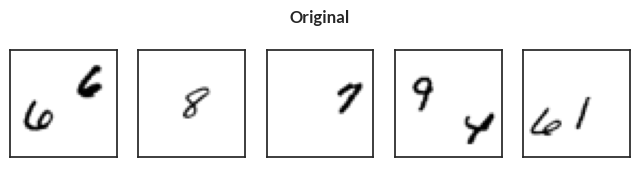

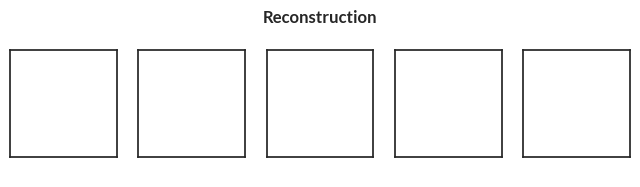

Epoch=1, total_epoch_step_time=3.42, loss=459.10
accuracy=0.2926666736602783, counts=[[17287  2624    36     1]
 [19747   273     0     0]
 [19989    43     0     0]]


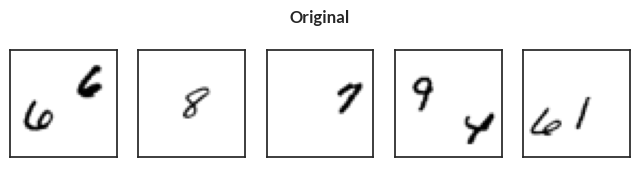

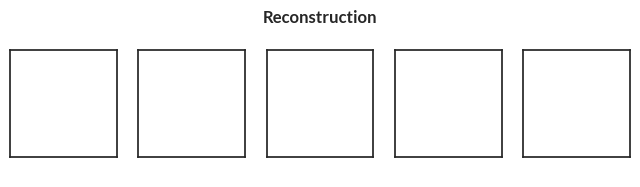

Epoch=2, total_epoch_step_time=5.12, loss=459.74
accuracy=0.30674999952316284, counts=[[18222  1716    10     0]
 [19837   183     0     0]
 [19989    43     0     0]]


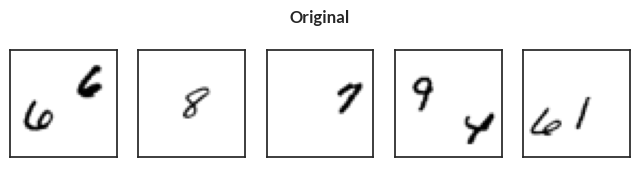

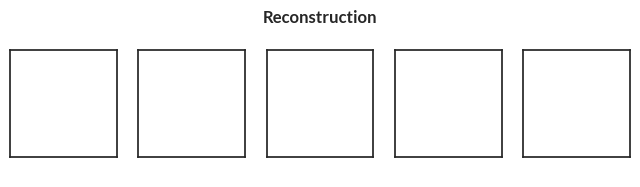

Epoch=3, total_epoch_step_time=6.87, loss=459.90
accuracy=0.3168833255767822, counts=[[18852  1092     4     0]
 [19859   161     0     0]
 [19984    48     0     0]]


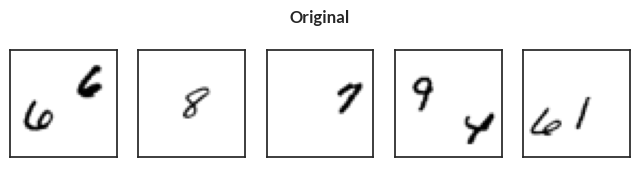

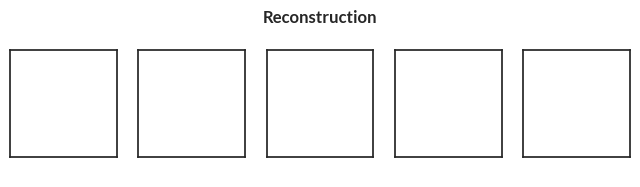

Epoch=4, total_epoch_step_time=8.56, loss=459.97
accuracy=0.32304999232292175, counts=[[19174   771     3     0]
 [19811   209     0     0]
 [19965    67     0     0]]


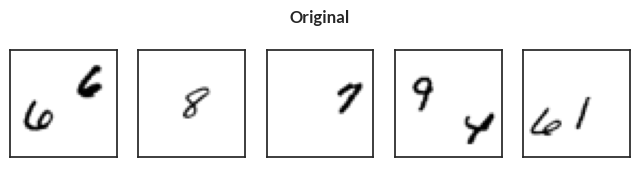

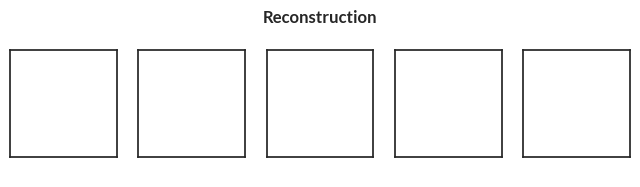

Epoch=5, total_epoch_step_time=10.24, loss=460.02
accuracy=0.34166666865348816, counts=[[19410   534     4     0]
 [18927  1083    10     0]
 [18948  1077     7     0]]


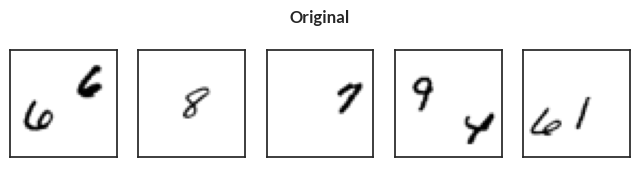

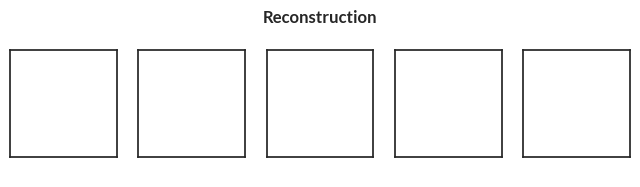

Epoch=6, total_epoch_step_time=12.02, loss=523.51
accuracy=0.8978999853134155, counts=[[19923    25     0     0]
 [   31 19629   359     1]
 [    4  5561 14322   145]]


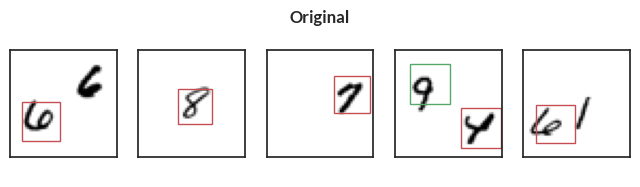

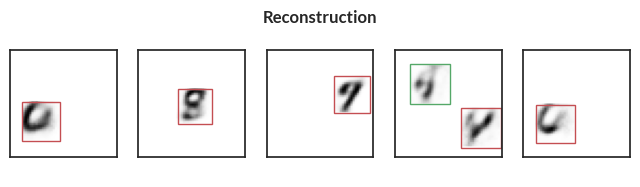

Epoch=7, total_epoch_step_time=13.81, loss=594.61
accuracy=0.9614333510398865, counts=[[19937    11     0     0]
 [   10 19710   300     0]
 [    3  1949 18039    41]]


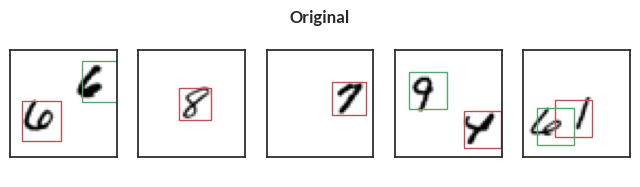

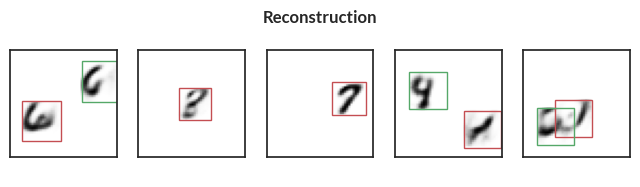

Epoch=8, total_epoch_step_time=15.59, loss=610.80
accuracy=0.9735333323478699, counts=[[19941     7     0     0]
 [    8 19739   271     2]
 [    2  1264 18732    34]]


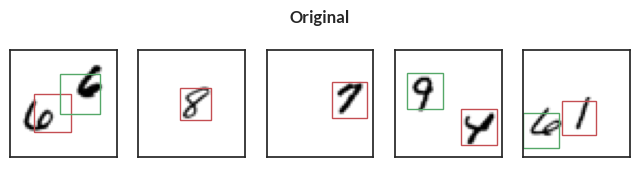

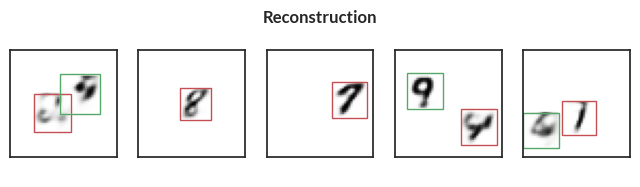

Epoch=9, total_epoch_step_time=17.29, loss=617.14
accuracy=0.9752833247184753, counts=[[19942     6     0     0]
 [    2 19665   352     1]
 [    3  1093 18910    26]]


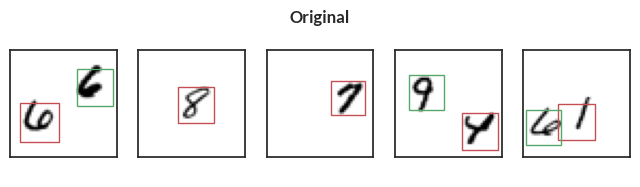

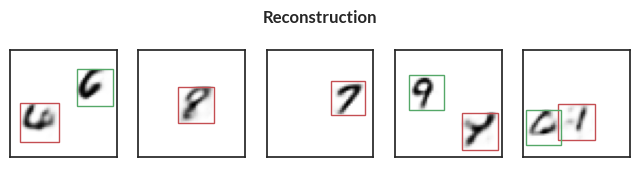

Epoch=10, total_epoch_step_time=19.01, loss=620.53
accuracy=0.9785667061805725, counts=[[19941     7     0     0]
 [    2 19677   340     1]
 [    2   900 19096    34]]


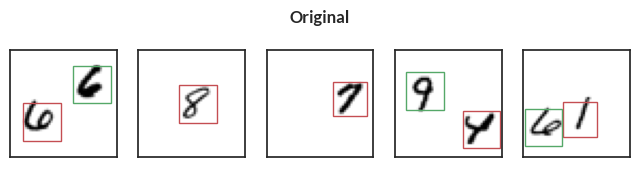

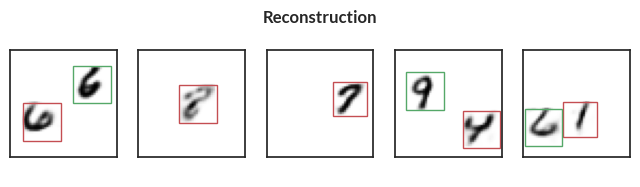

Epoch=11, total_epoch_step_time=20.73, loss=622.85
accuracy=0.9788333177566528, counts=[[19942     6     0     0]
 [    5 19781   233     1]
 [    4   991 19007    30]]


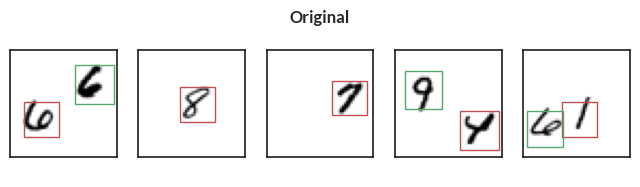

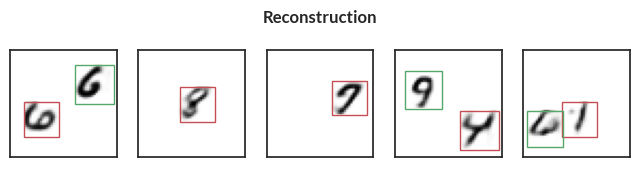

Epoch=12, total_epoch_step_time=22.54, loss=624.50
accuracy=0.9804500341415405, counts=[[19940     8     0     0]
 [    2 19674   343     1]
 [    2   785 19213    32]]


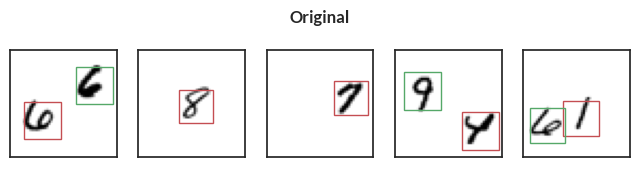

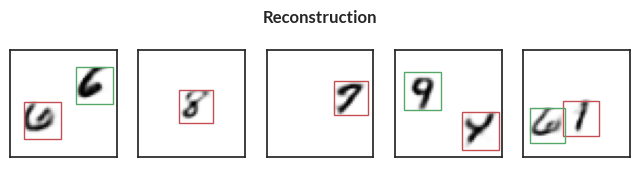

Epoch=13, total_epoch_step_time=24.24, loss=625.56
accuracy=0.9797500371932983, counts=[[19941     7     0     0]
 [    4 19697   318     1]
 [    3   856 19147    26]]


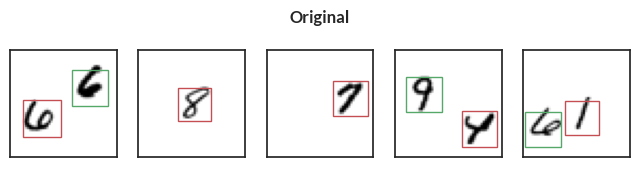

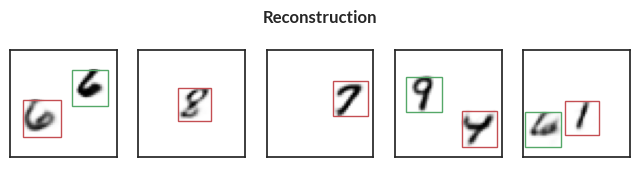

Epoch=14, total_epoch_step_time=26.00, loss=626.60
accuracy=0.9792166948318481, counts=[[19937    11     0     0]
 [    4 19713   302     1]
 [    0   910 19103    19]]


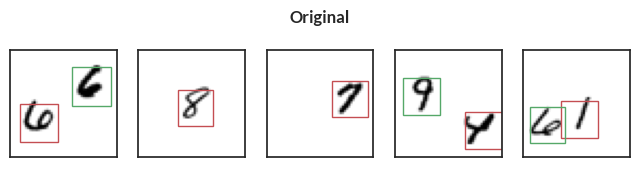

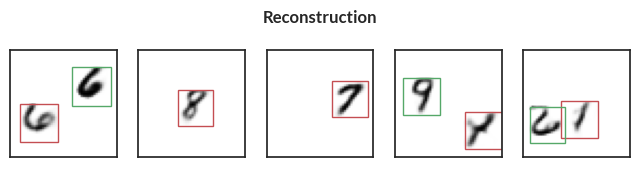

Epoch=15, total_epoch_step_time=27.78, loss=627.21
accuracy=0.9797666668891907, counts=[[19939     9     0     0]
 [    1 19717   301     1]
 [    1   881 19130    20]]


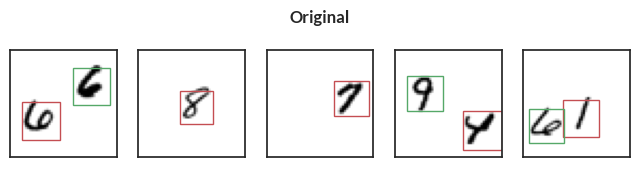

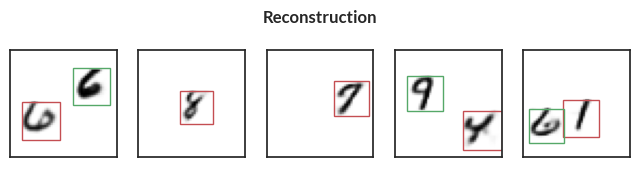

Epoch=16, total_epoch_step_time=29.51, loss=627.88
accuracy=0.9814833402633667, counts=[[19935    13     0     0]
 [    3 19757   258     2]
 [    3   816 19197    16]]


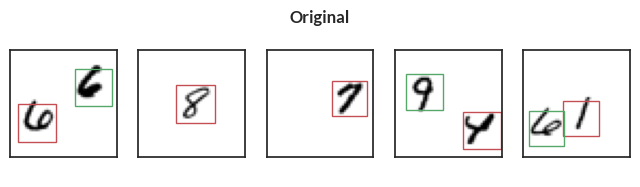

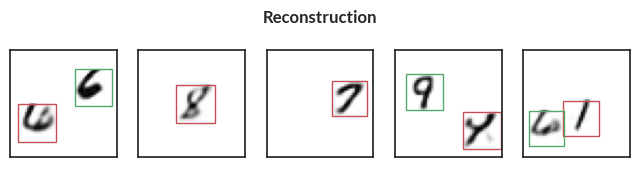

Epoch=17, total_epoch_step_time=31.31, loss=628.64
accuracy=0.9808333516120911, counts=[[19941     7     0     0]
 [    3 19763   253     1]
 [    2   863 19146    21]]


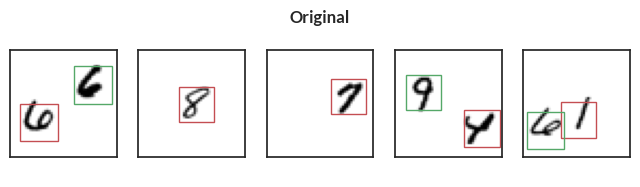

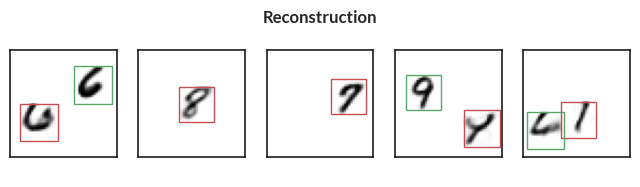

Epoch=18, total_epoch_step_time=33.12, loss=628.92
accuracy=0.9805333614349365, counts=[[19942     6     0     0]
 [    2 19817   200     1]
 [    2   936 19073    21]]


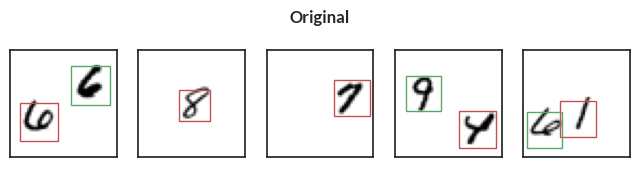

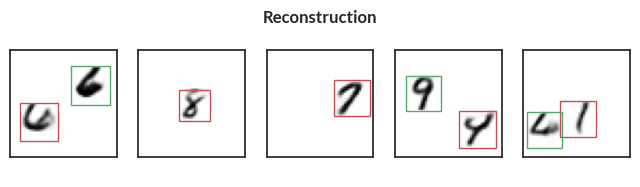

Epoch=19, total_epoch_step_time=34.99, loss=629.38
accuracy=0.9801166653633118, counts=[[19943     5     0     0]
 [    3 19786   230     1]
 [    2   938 19078    14]]


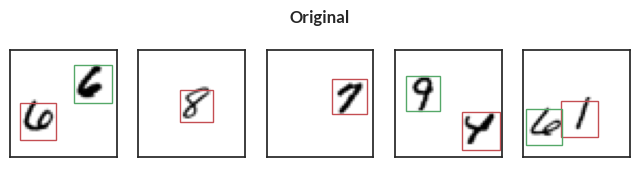

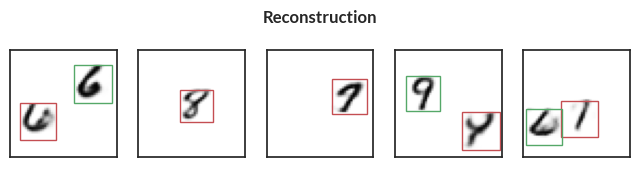

Epoch=20, total_epoch_step_time=36.78, loss=629.68
accuracy=0.9807167053222656, counts=[[19942     6     0     0]
 [    1 19774   244     1]
 [    2   890 19127    13]]


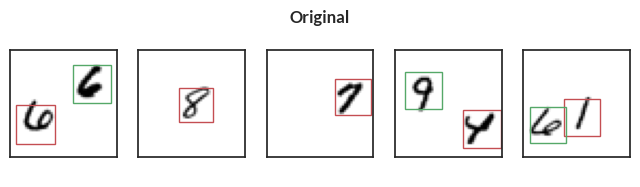

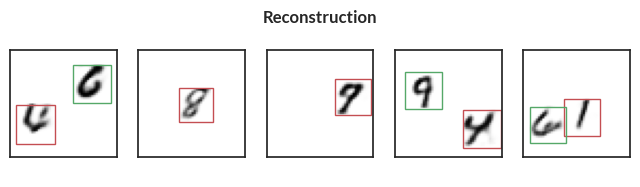

Epoch=21, total_epoch_step_time=38.49, loss=630.14
accuracy=0.9809166789054871, counts=[[19938    10     0     0]
 [    1 19784   234     1]
 [    1   884 19133    14]]


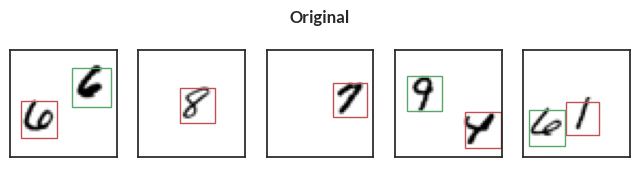

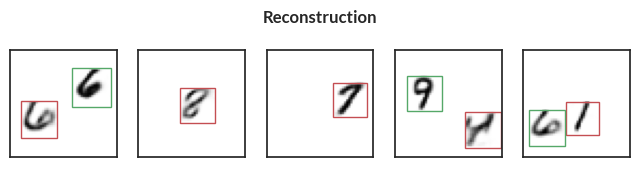

Epoch=22, total_epoch_step_time=40.27, loss=630.41
accuracy=0.9812833666801453, counts=[[19940     8     0     0]
 [    1 19713   305     1]
 [    0   793 19224    15]]


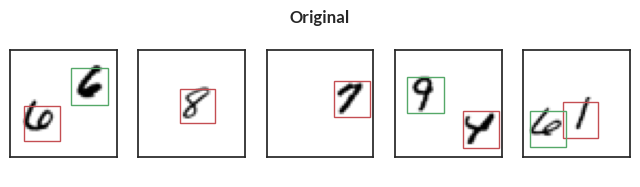

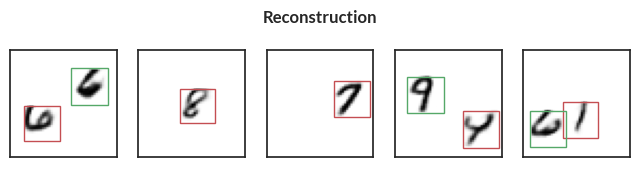

Epoch=23, total_epoch_step_time=42.02, loss=630.53
accuracy=0.9814000129699707, counts=[[19940     8     0     0]
 [    0 19803   216     1]
 [    2   875 19141    14]]


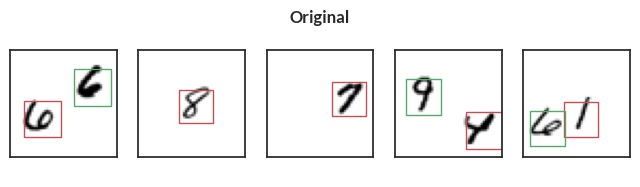

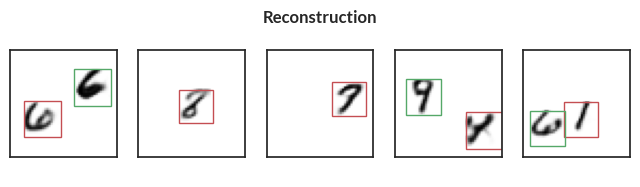

Epoch=24, total_epoch_step_time=43.74, loss=630.89
accuracy=0.9811333417892456, counts=[[19939     9     0     0]
 [    6 19819   194     1]
 [    1   909 19110    12]]


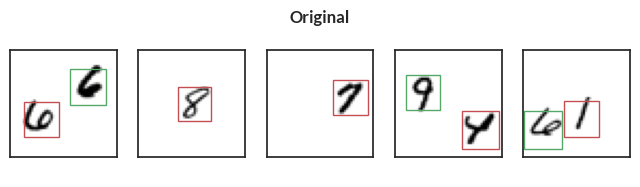

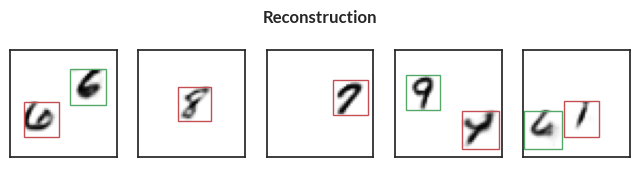

Epoch=25, total_epoch_step_time=45.44, loss=631.19
accuracy=0.9819499850273132, counts=[[19944     4     0     0]
 [    2 19793   224     1]
 [    1   837 19180    14]]


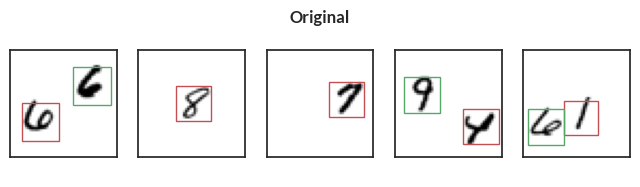

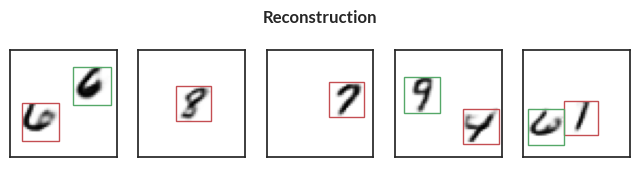

Epoch=26, total_epoch_step_time=47.19, loss=631.54
accuracy=0.9817667007446289, counts=[[19937    11     0     0]
 [    0 19788   231     1]
 [    2   836 19181    13]]


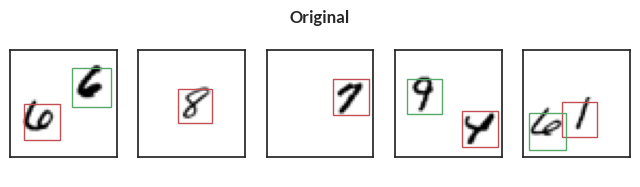

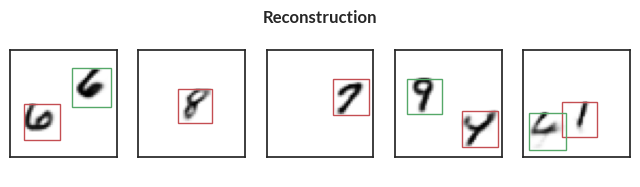

Epoch=27, total_epoch_step_time=48.95, loss=631.68
accuracy=0.9820166826248169, counts=[[19945     3     0     0]
 [    2 19790   227     1]
 [    4   830 19186    12]]


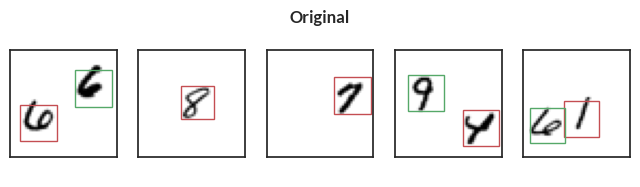

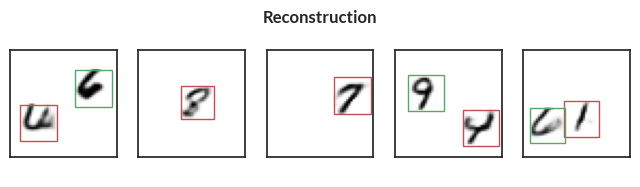

Epoch=28, total_epoch_step_time=50.66, loss=631.98
accuracy=0.9818833470344543, counts=[[19943     5     0     0]
 [    0 19798   221     1]
 [    3   845 19172    12]]


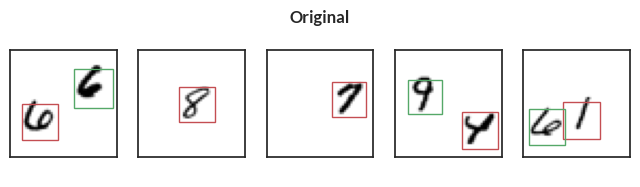

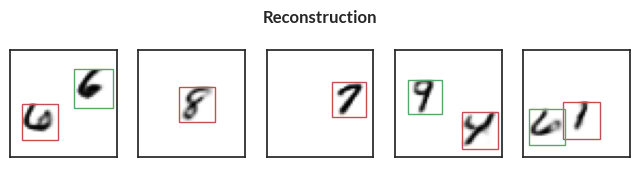

Epoch=29, total_epoch_step_time=52.37, loss=631.96
accuracy=0.9819666743278503, counts=[[19939     9     0     0]
 [    1 19815   203     1]
 [    1   856 19164    11]]


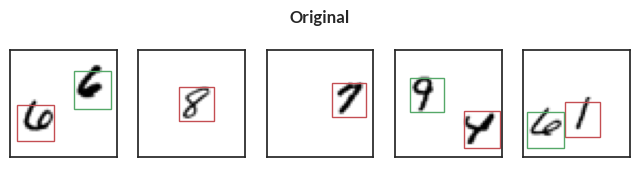

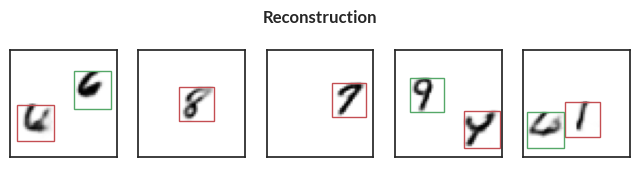

Epoch=30, total_epoch_step_time=54.15, loss=632.06
accuracy=0.9819666743278503, counts=[[19944     4     0     0]
 [    4 19802   213     1]
 [    3   848 19172     9]]


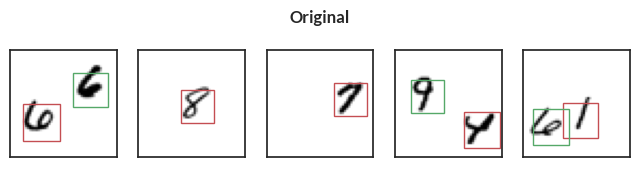

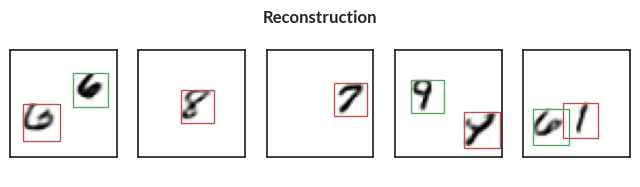

Epoch=31, total_epoch_step_time=55.88, loss=632.34
accuracy=0.9818333387374878, counts=[[19942     6     0     0]
 [    1 19748   270     1]
 [    1   801 19220    10]]


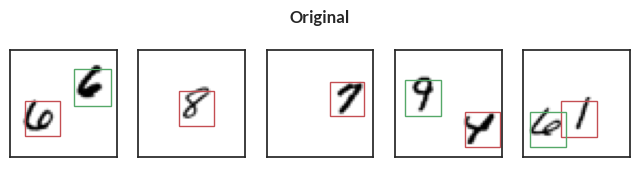

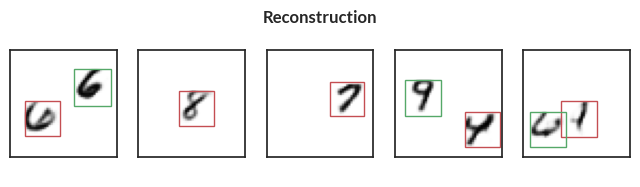

Epoch=32, total_epoch_step_time=57.62, loss=632.48
accuracy=0.9822666645050049, counts=[[19939     9     0     0]
 [    2 19799   218     1]
 [    2   824 19198     8]]


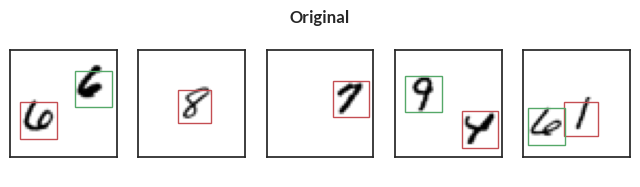

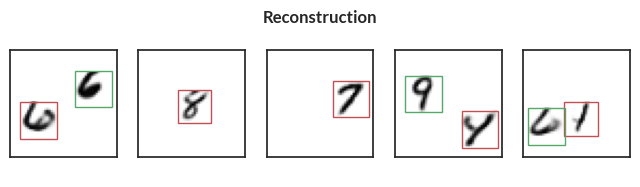

Epoch=33, total_epoch_step_time=59.41, loss=632.93
accuracy=0.9823333621025085, counts=[[19942     6     0     0]
 [    3 19804   212     1]
 [    2   829 19194     7]]


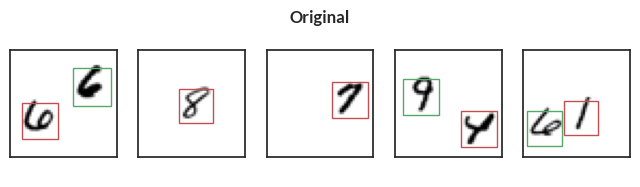

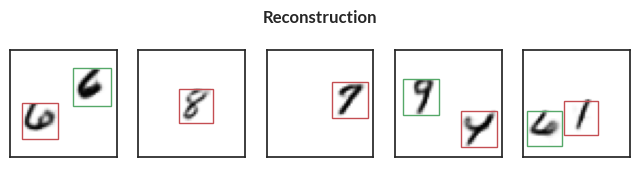

Epoch=34, total_epoch_step_time=61.27, loss=632.92
accuracy=0.9821500182151794, counts=[[19943     5     0     0]
 [    0 19795   224     1]
 [    4   829 19191     8]]


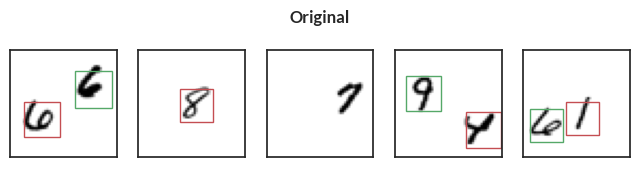

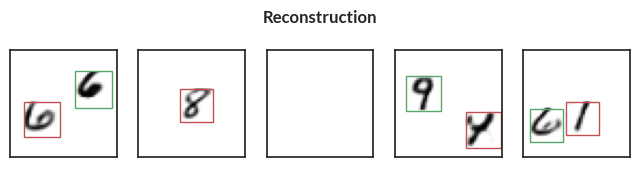

Epoch=35, total_epoch_step_time=63.06, loss=632.80
accuracy=0.9817333221435547, counts=[[19940     8     0     0]
 [    1 19747   271     1]
 [    2   804 19217     9]]


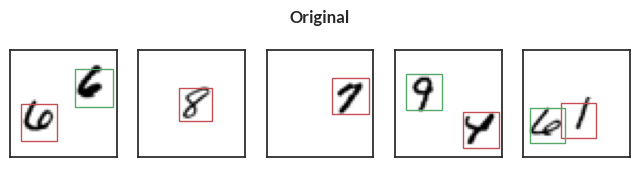

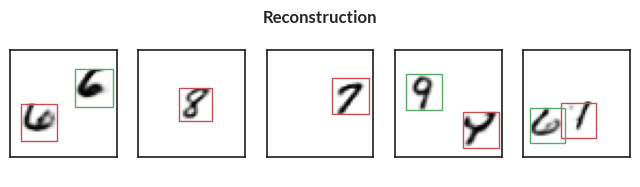

Epoch=36, total_epoch_step_time=64.88, loss=633.28
accuracy=0.9815999865531921, counts=[[19946     2     0     0]
 [    2 19819   198     1]
 [    2   893 19131     6]]


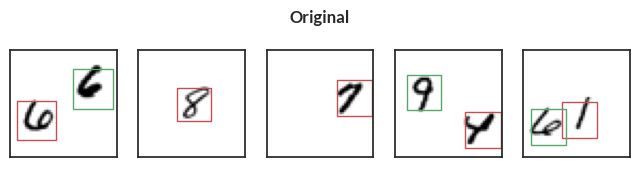

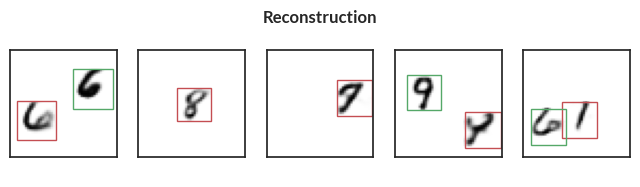

Epoch=37, total_epoch_step_time=66.62, loss=633.51
accuracy=0.9824666976928711, counts=[[19944     4     0     0]
 [    2 19805   212     1]
 [    3   820 19199    10]]


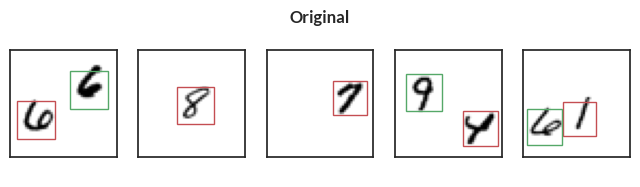

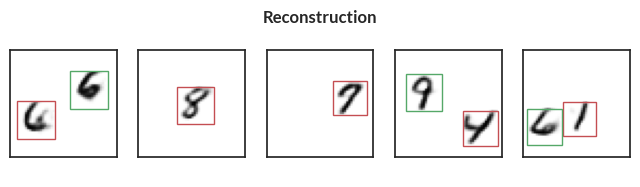

Epoch=38, total_epoch_step_time=68.35, loss=633.33
accuracy=0.9822999835014343, counts=[[19941     7     0     0]
 [    1 19806   212     1]
 [    0   832 19191     9]]


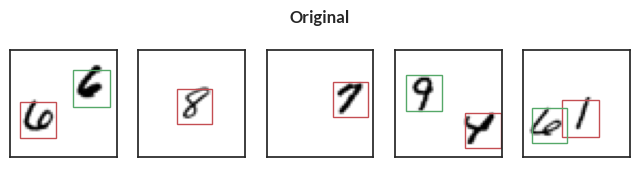

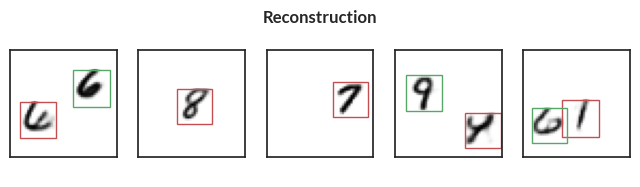

Epoch=39, total_epoch_step_time=70.07, loss=633.34
accuracy=0.98211669921875, counts=[[19943     5     0     0]
 [    1 19818   200     1]
 [    3   854 19166     9]]


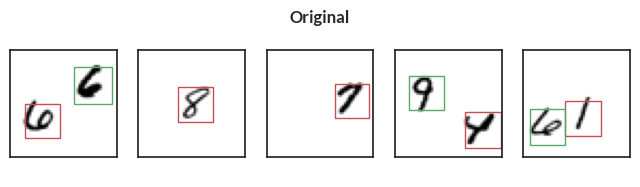

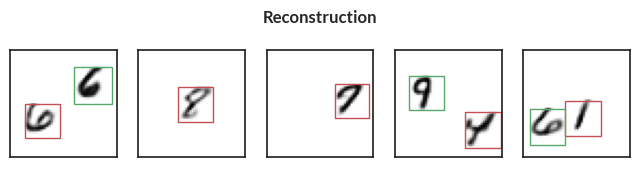

Epoch=40, total_epoch_step_time=71.84, loss=633.77
accuracy=0.9824666976928711, counts=[[19946     2     0     0]
 [    2 19818   199     1]
 [    2   838 19184     8]]


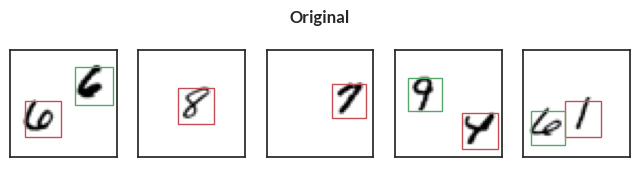

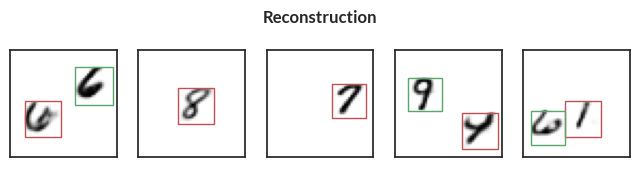

Epoch=41, total_epoch_step_time=73.58, loss=633.78
accuracy=0.9822999835014343, counts=[[19938    10     0     0]
 [    2 19831   186     1]
 [    4   853 19169     6]]


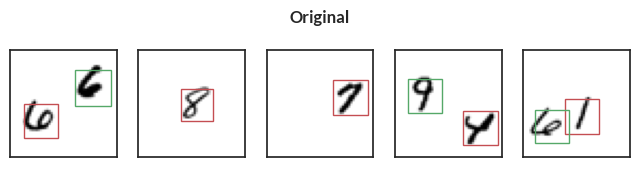

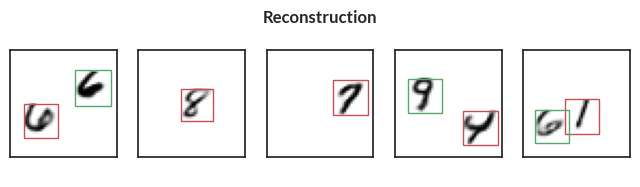

Epoch=42, total_epoch_step_time=75.27, loss=634.11
accuracy=0.982616662979126, counts=[[19944     4     0     0]
 [    3 19828   188     1]
 [    1   839 19185     7]]


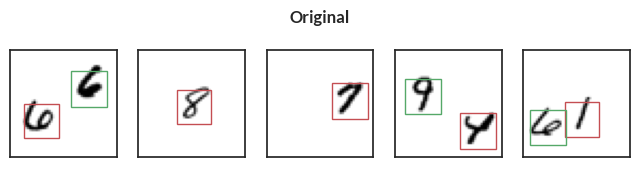

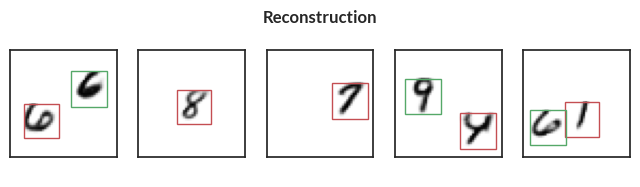

Epoch=43, total_epoch_step_time=76.99, loss=634.07
accuracy=0.9825000166893005, counts=[[19944     4     0     0]
 [    2 19806   211     1]
 [    2   820 19200    10]]


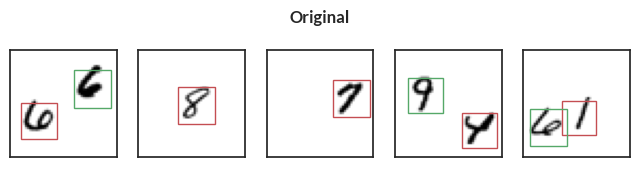

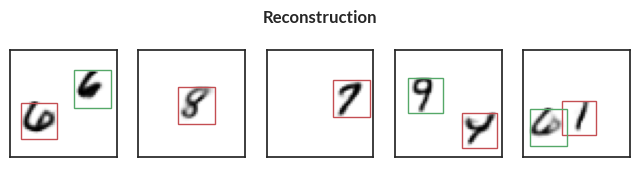

Epoch=44, total_epoch_step_time=78.74, loss=634.25
accuracy=0.9823333621025085, counts=[[19944     4     0     0]
 [    1 19822   196     1]
 [    1   850 19174     7]]


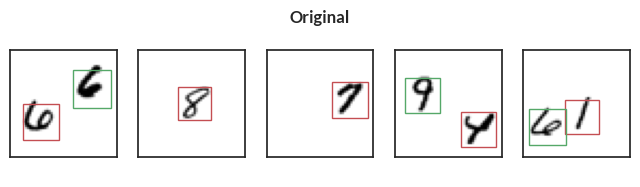

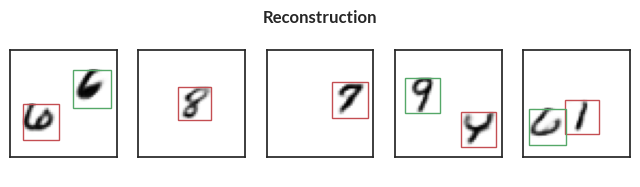

Epoch=45, total_epoch_step_time=80.54, loss=634.51
accuracy=0.982616662979126, counts=[[19942     6     0     0]
 [    1 19822   196     1]
 [    2   826 19193    11]]


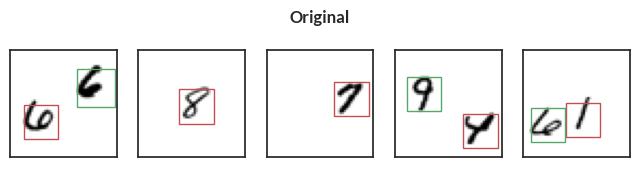

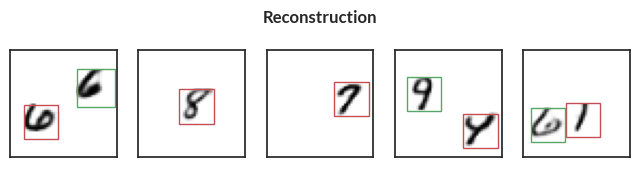

Epoch=46, total_epoch_step_time=82.33, loss=634.34
accuracy=0.98211669921875, counts=[[19939     9     0     0]
 [    2 19833   184     1]
 [    2   867 19155     8]]


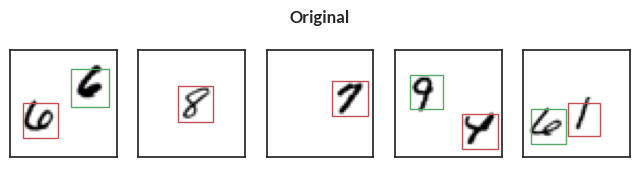

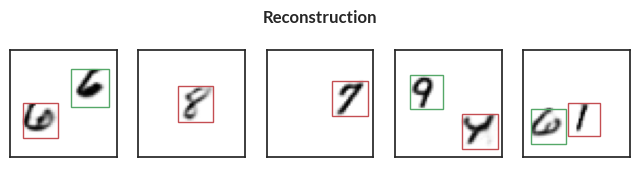

Epoch=47, total_epoch_step_time=84.18, loss=634.37
accuracy=0.9817333221435547, counts=[[19943     5     0     0]
 [    3 19841   176     0]
 [    3   903 19120     6]]


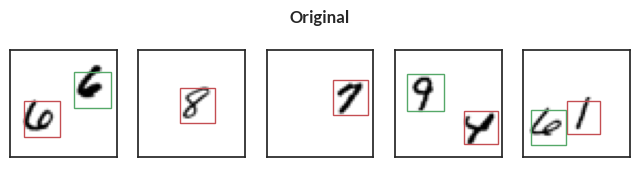

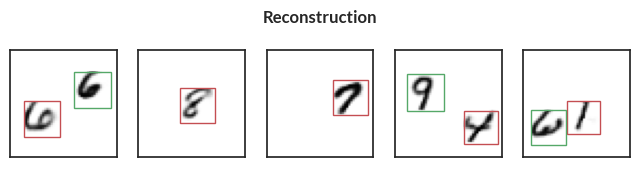

Epoch=48, total_epoch_step_time=85.99, loss=634.41
accuracy=0.9825000166893005, counts=[[19940     8     0     0]
 [    1 19829   189     1]
 [    1   843 19181     7]]


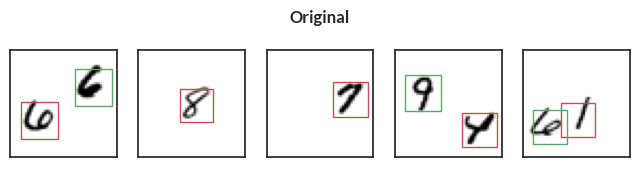

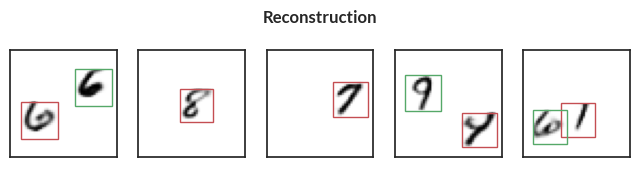

Epoch=49, total_epoch_step_time=87.77, loss=634.77
accuracy=0.9825500249862671, counts=[[19939     9     0     0]
 [    2 19840   177     1]
 [    1   851 19174     6]]


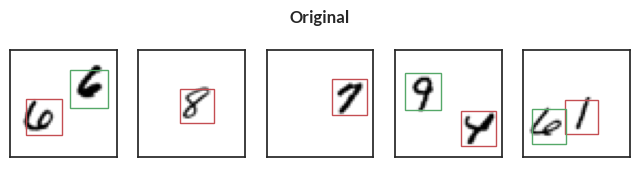

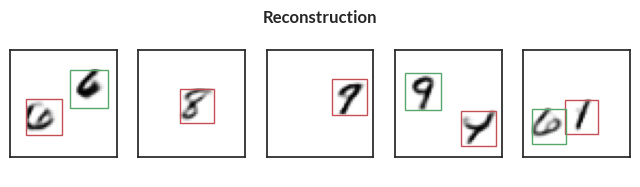

Epoch=50, total_epoch_step_time=89.47, loss=634.59
accuracy=0.9828833341598511, counts=[[19942     6     0     0]
 [    0 19828   191     1]
 [    5   817 19203     7]]


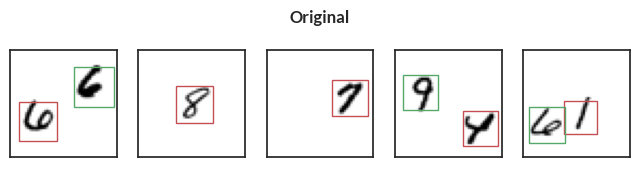

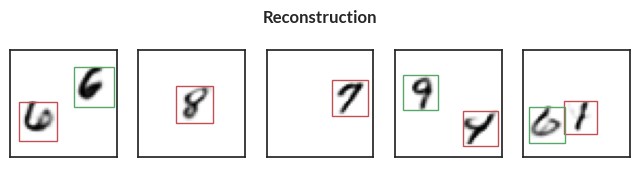

Epoch=51, total_epoch_step_time=91.16, loss=634.74
accuracy=0.9820666909217834, counts=[[19945     3     0     0]
 [    1 19843   175     1]
 [    2   887 19136     7]]


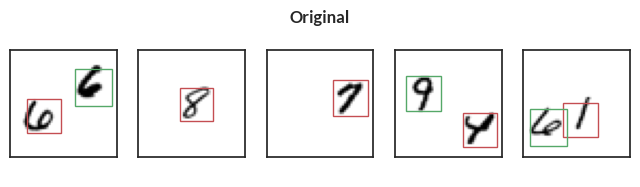

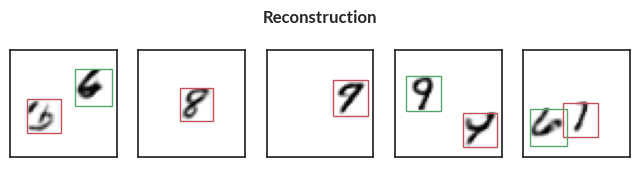

Epoch=52, total_epoch_step_time=92.84, loss=634.94
accuracy=0.9822333455085754, counts=[[19944     4     0     0]
 [    1 19834   184     1]
 [    2   868 19156     6]]


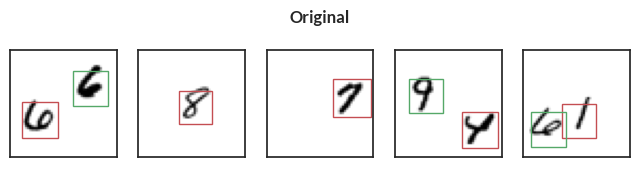

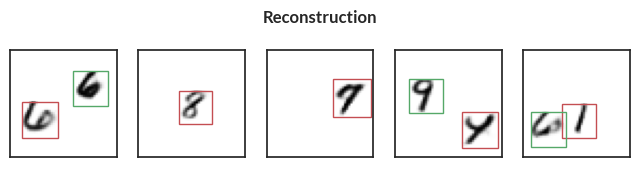

Epoch=53, total_epoch_step_time=94.54, loss=634.91
accuracy=0.9825666546821594, counts=[[19941     7     0     0]
 [    1 19829   189     1]
 [    1   841 19184     6]]


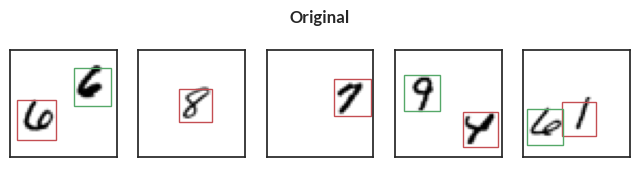

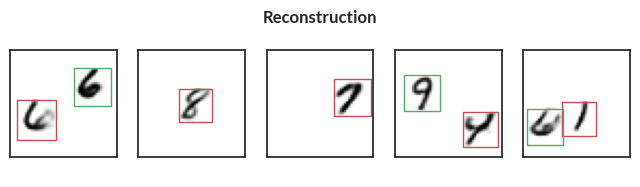

Epoch=54, total_epoch_step_time=96.30, loss=635.22
accuracy=0.9828000068664551, counts=[[19944     4     0     0]
 [    2 19817   200     1]
 [    2   814 19207     9]]


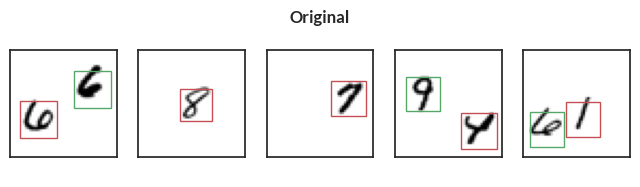

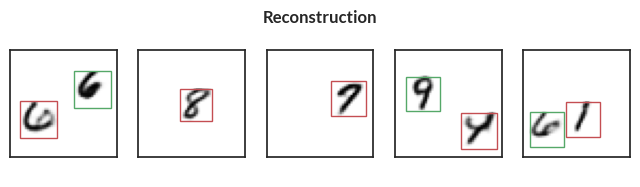

Epoch=55, total_epoch_step_time=98.01, loss=635.10
accuracy=0.9829833507537842, counts=[[19945     3     0     0]
 [    4 19827   188     1]
 [    2   817 19207     6]]


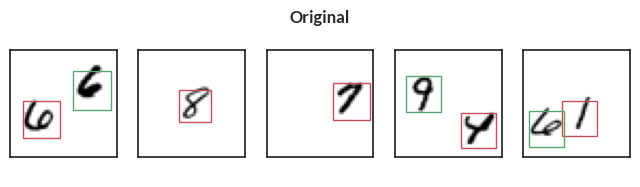

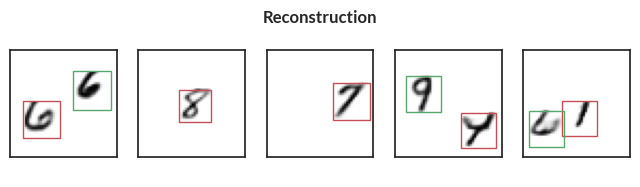

Epoch=56, total_epoch_step_time=99.79, loss=635.23
accuracy=0.9830499887466431, counts=[[19945     3     0     0]
 [    0 19825   194     1]
 [    2   809 19213     8]]


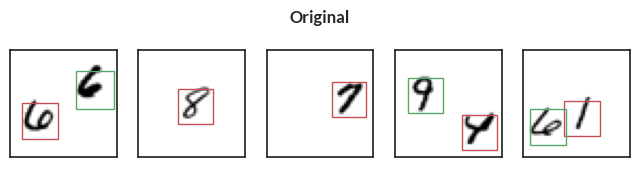

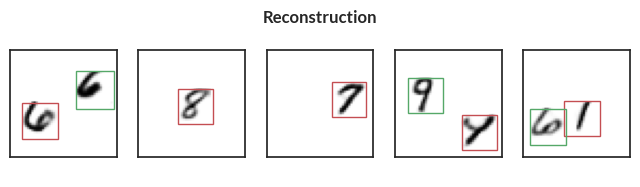

Epoch=57, total_epoch_step_time=101.51, loss=635.32
accuracy=0.9819666743278503, counts=[[19943     5     0     0]
 [    4 19826   189     1]
 [    3   872 19149     8]]


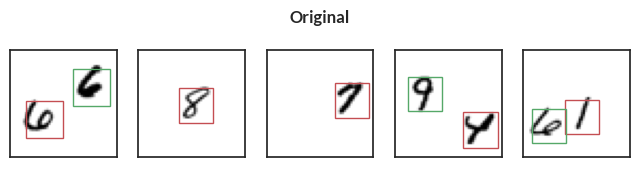

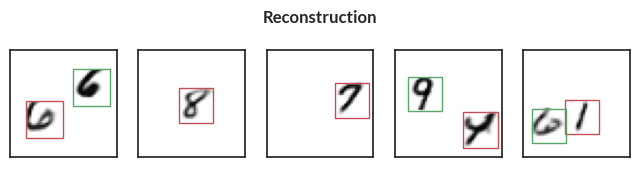

Epoch=58, total_epoch_step_time=103.35, loss=635.18
accuracy=0.9827499985694885, counts=[[19945     3     0     0]
 [    2 19829   188     1]
 [    3   830 19191     8]]


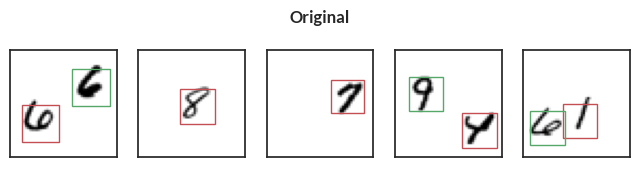

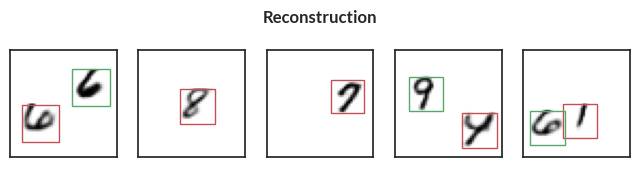

Epoch=59, total_epoch_step_time=105.21, loss=635.45
accuracy=0.9827499985694885, counts=[[19946     2     0     0]
 [    1 19832   186     1]
 [    3   834 19187     8]]


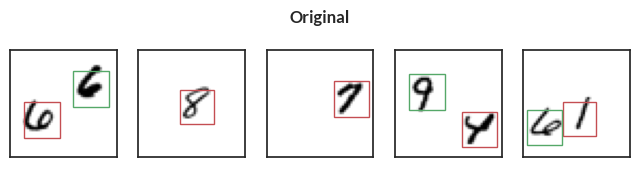

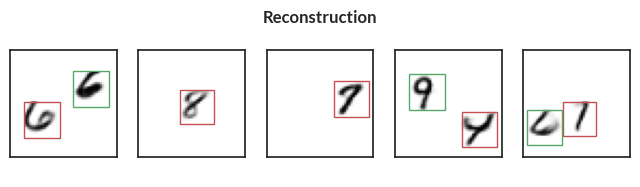

Epoch=60, total_epoch_step_time=107.00, loss=635.54
accuracy=0.9827166795730591, counts=[[19940     8     0     0]
 [    1 19840   178     1]
 [    3   836 19183    10]]


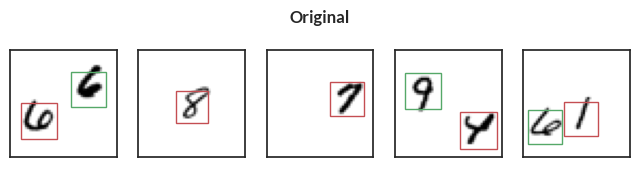

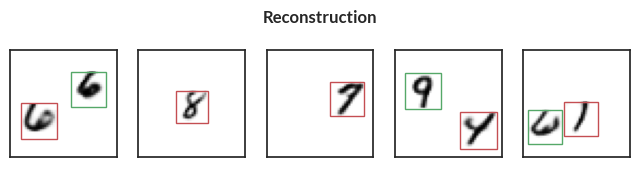

Epoch=61, total_epoch_step_time=108.74, loss=635.54
accuracy=0.9828000068664551, counts=[[19944     4     0     0]
 [    1 19839   179     1]
 [    3   835 19185     9]]


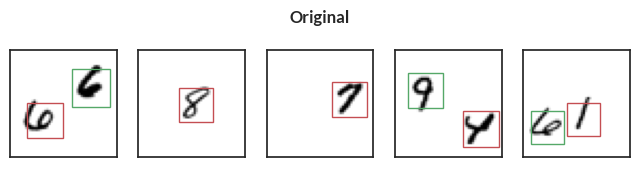

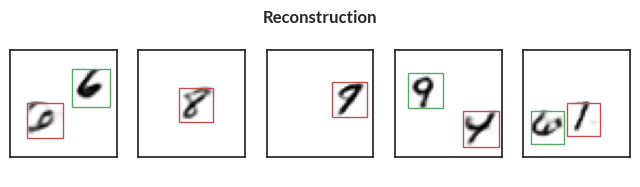

Epoch=62, total_epoch_step_time=110.58, loss=635.71
accuracy=0.9821666479110718, counts=[[19943     5     0     0]
 [    4 19834   181     1]
 [    3   870 19153     6]]


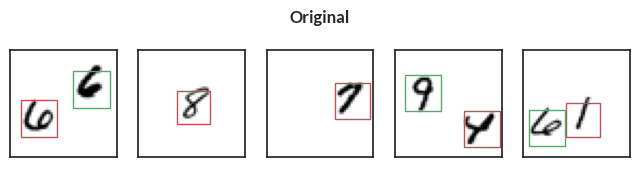

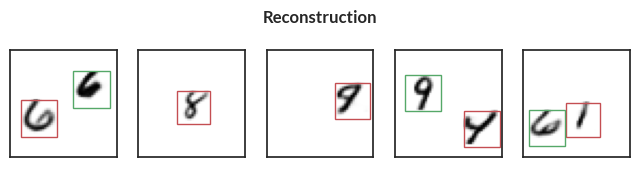

Epoch=63, total_epoch_step_time=112.51, loss=635.81
accuracy=0.9828166961669922, counts=[[19940     8     0     0]
 [    0 19827   192     1]
 [    2   820 19202     8]]


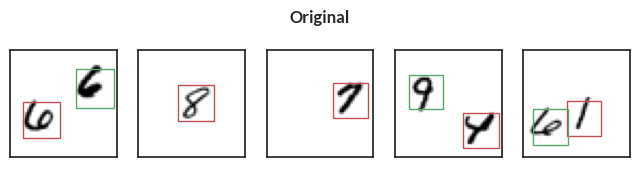

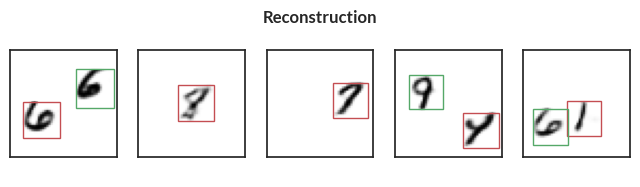

Epoch=64, total_epoch_step_time=114.31, loss=635.76
accuracy=0.9829833507537842, counts=[[19941     7     0     0]
 [    3 19830   186     1]
 [    1   815 19208     8]]


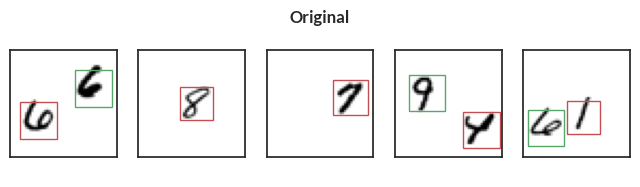

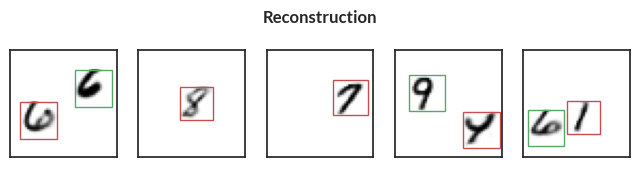

Epoch=65, total_epoch_step_time=116.06, loss=635.78
accuracy=0.9828833341598511, counts=[[19946     2     0     0]
 [    2 19838   179     1]
 [    0   833 19189    10]]


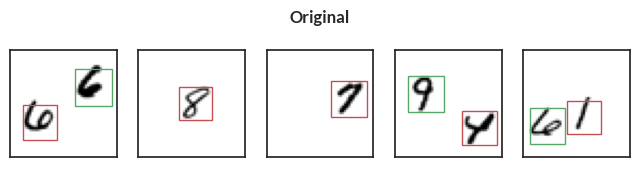

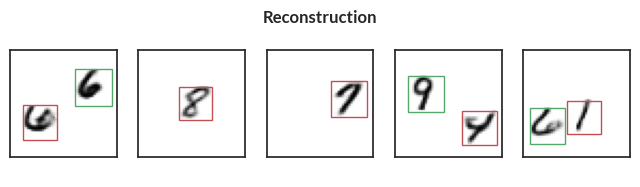

Epoch=66, total_epoch_step_time=117.87, loss=635.87
accuracy=0.9830333590507507, counts=[[19947     1     0     0]
 [    1 19827   191     1]
 [    0   818 19208     6]]


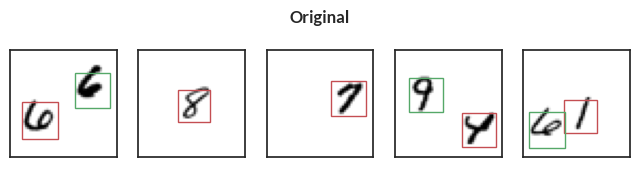

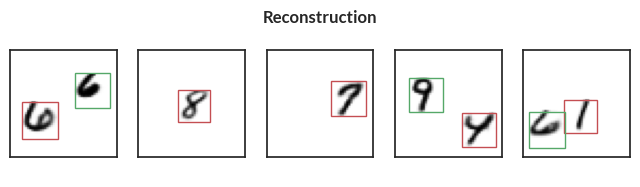

Epoch=67, total_epoch_step_time=119.69, loss=635.85
accuracy=0.9828500151634216, counts=[[19943     5     0     0]
 [    3 19834   182     1]
 [    1   828 19194     9]]


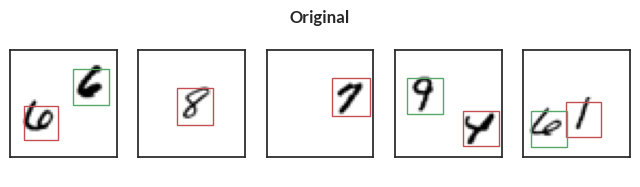

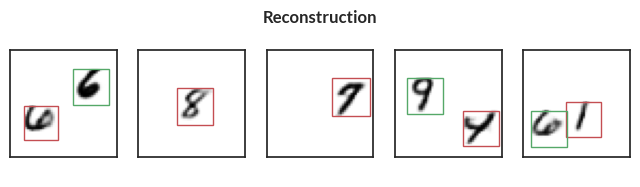

Epoch=68, total_epoch_step_time=121.43, loss=636.06
accuracy=0.9825666546821594, counts=[[19940     8     0     0]
 [    5 19836   178     1]
 [    3   846 19178     5]]


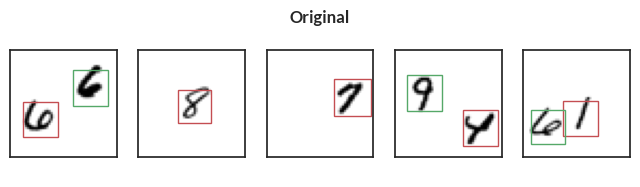

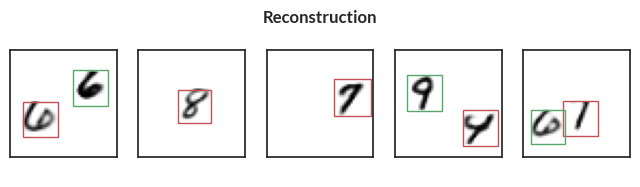

Epoch=69, total_epoch_step_time=123.21, loss=635.87
accuracy=0.982783317565918, counts=[[19944     4     0     0]
 [    3 19822   194     1]
 [    1   822 19201     8]]


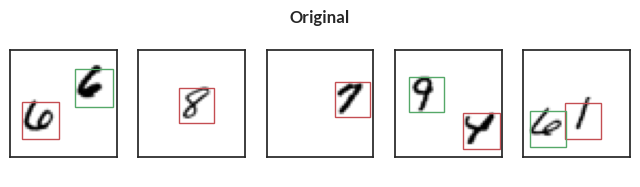

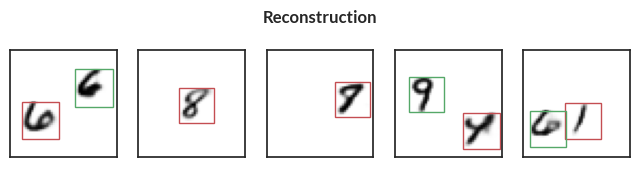

Epoch=70, total_epoch_step_time=124.96, loss=636.08
accuracy=0.9830166697502136, counts=[[19940     8     0     0]
 [    1 19834   184     1]
 [    0   816 19207     9]]


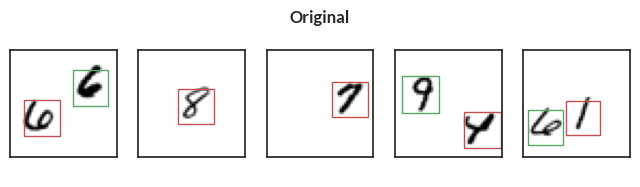

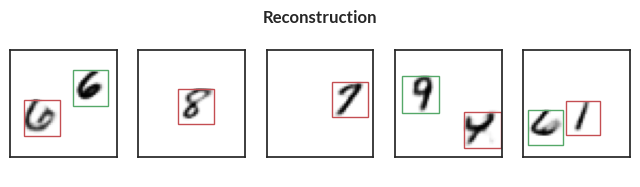

Epoch=71, total_epoch_step_time=126.68, loss=636.05
accuracy=0.9828500151634216, counts=[[19938    10     0     0]
 [    3 19825   191     1]
 [    1   813 19208    10]]


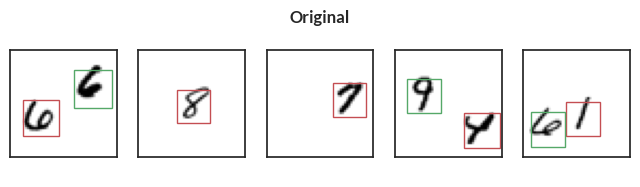

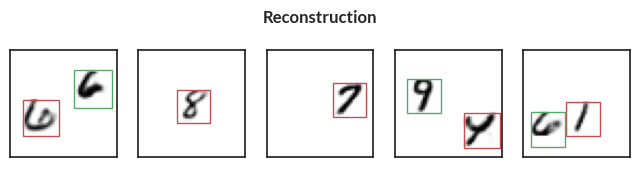

Epoch=72, total_epoch_step_time=128.51, loss=636.17
accuracy=0.9830166697502136, counts=[[19943     5     0     0]
 [    0 19836   183     1]
 [    4   815 19202    11]]


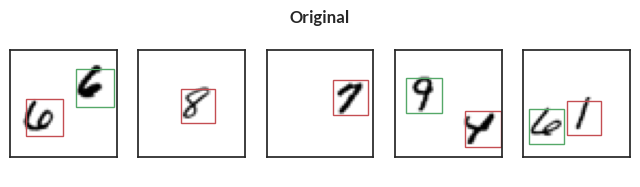

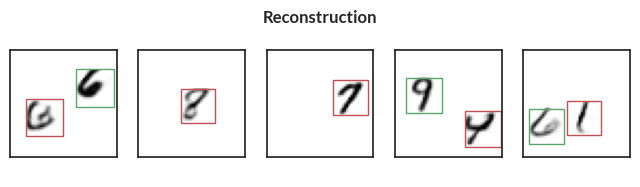

Epoch=73, total_epoch_step_time=130.28, loss=636.10
accuracy=0.9828166961669922, counts=[[19941     7     0     0]
 [    3 19836   180     1]
 [    2   832 19192     6]]


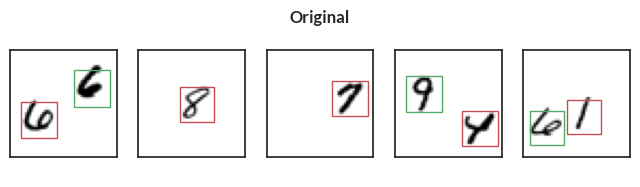

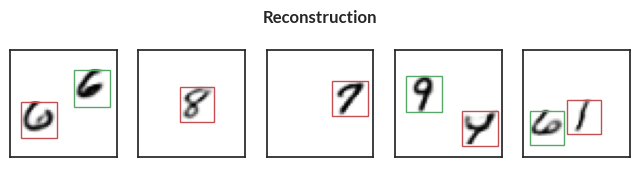

Epoch=74, total_epoch_step_time=132.14, loss=636.24
accuracy=0.9828333258628845, counts=[[19945     3     0     0]
 [    1 19832   186     1]
 [    2   825 19193    12]]


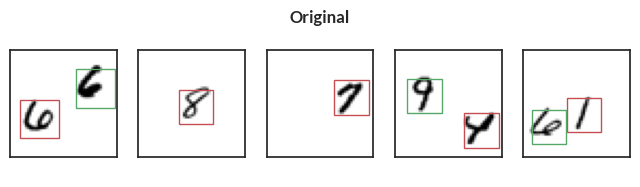

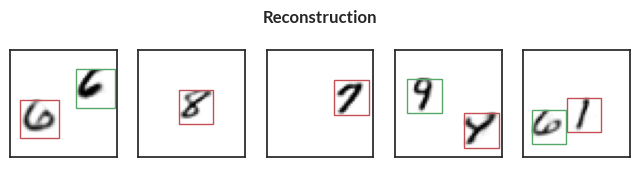

Epoch=75, total_epoch_step_time=133.90, loss=636.39
accuracy=0.9827333688735962, counts=[[19945     3     0     0]
 [    2 19821   196     1]
 [    2   821 19198    11]]


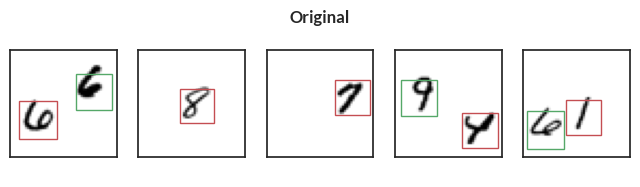

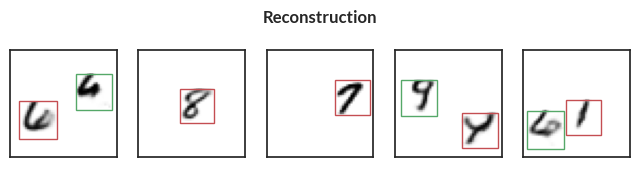

Epoch=76, total_epoch_step_time=135.73, loss=636.37
accuracy=0.9824000000953674, counts=[[19942     6     0     0]
 [    2 19837   180     1]
 [    4   854 19165     9]]


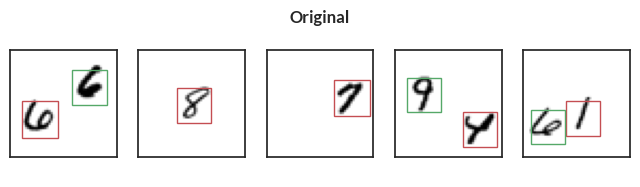

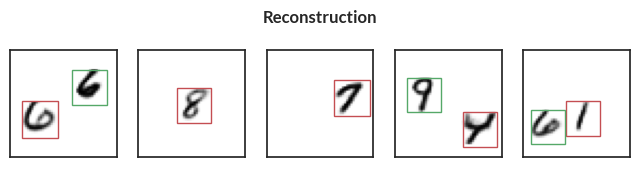

Epoch=77, total_epoch_step_time=137.55, loss=636.35
accuracy=0.9826833605766296, counts=[[19939     9     0     0]
 [    3 19832   184     1]
 [    2   832 19190     8]]


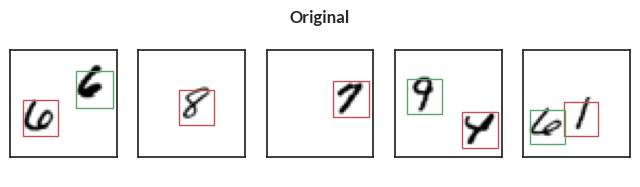

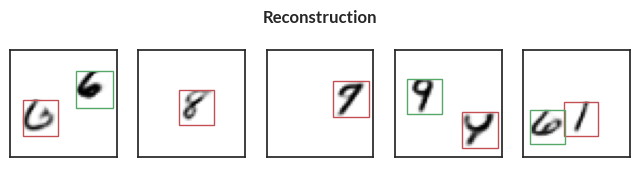

Epoch=78, total_epoch_step_time=139.24, loss=636.51
accuracy=0.9826833605766296, counts=[[19940     8     0     0]
 [    2 19828   189     1]
 [    2   830 19193     7]]


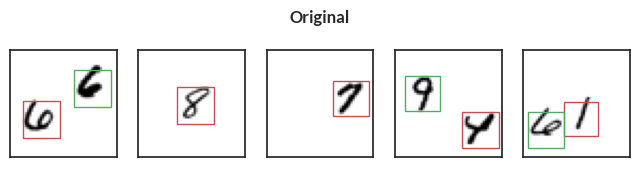

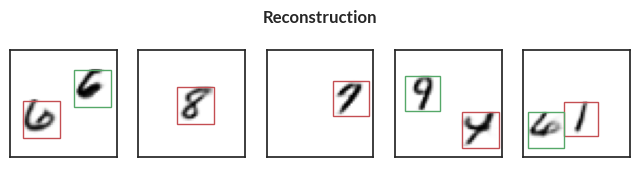

Epoch=79, total_epoch_step_time=140.97, loss=636.77
accuracy=0.9826833605766296, counts=[[19942     6     0     0]
 [    2 19834   183     1]
 [    4   834 19185     9]]


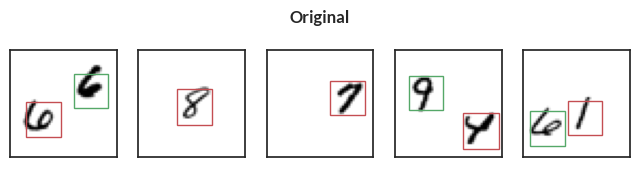

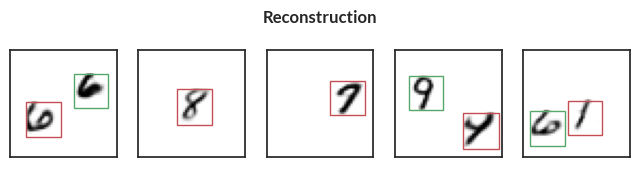

Epoch=80, total_epoch_step_time=142.67, loss=636.66
accuracy=0.9826333522796631, counts=[[19943     5     0     0]
 [    0 19842   177     1]
 [    0   852 19173     7]]


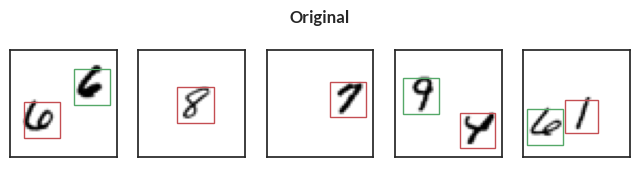

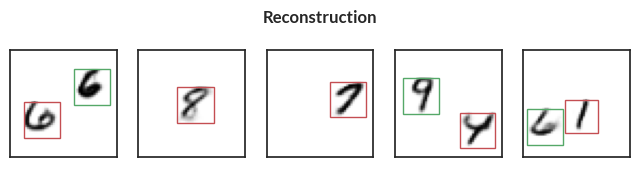

Epoch=81, total_epoch_step_time=144.39, loss=636.63
accuracy=0.9828166961669922, counts=[[19939     9     0     0]
 [    1 19836   182     1]
 [    2   827 19194     9]]


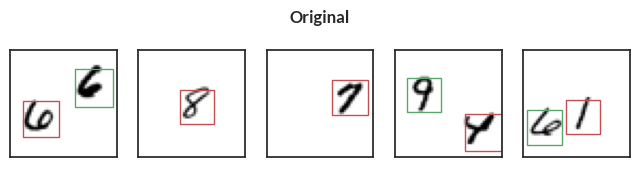

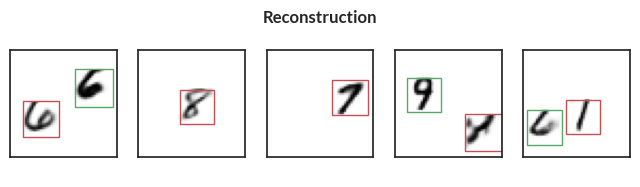

Epoch=82, total_epoch_step_time=146.11, loss=636.64
accuracy=0.9828000068664551, counts=[[19945     3     0     0]
 [    0 19833   186     1]
 [    0   833 19190     9]]


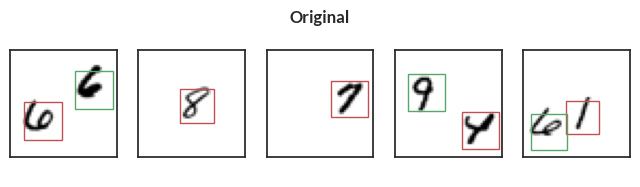

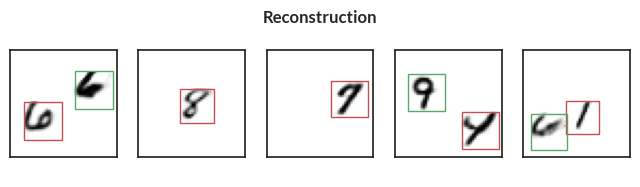

Epoch=83, total_epoch_step_time=147.84, loss=636.72
accuracy=0.982616662979126, counts=[[19936    12     0     0]
 [    1 19833   185     1]
 [    0   837 19188     7]]


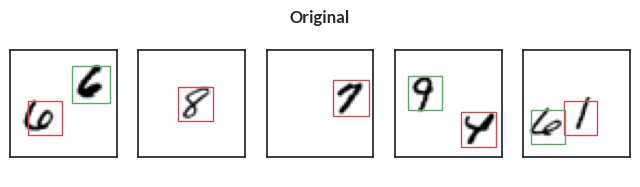

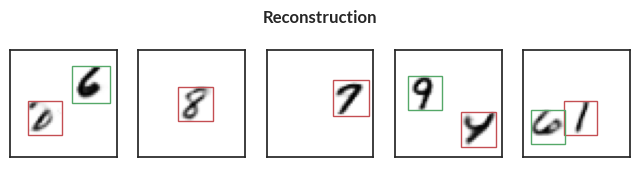

Epoch=84, total_epoch_step_time=149.57, loss=636.73
accuracy=0.982783317565918, counts=[[19941     7     0     0]
 [    1 19833   185     1]
 [    2   829 19193     8]]


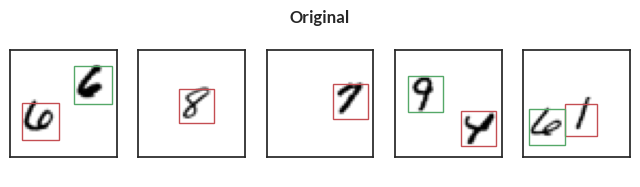

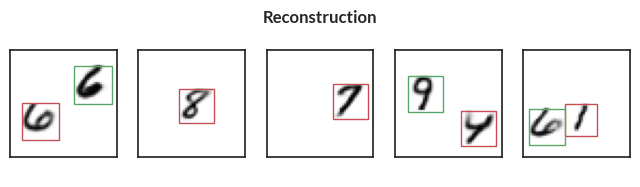

Epoch=85, total_epoch_step_time=151.28, loss=636.93
accuracy=0.982783317565918, counts=[[19943     5     0     0]
 [    2 19832   185     1]
 [    2   829 19192     9]]


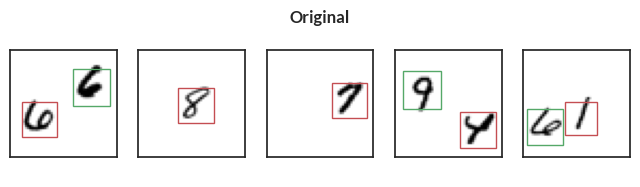

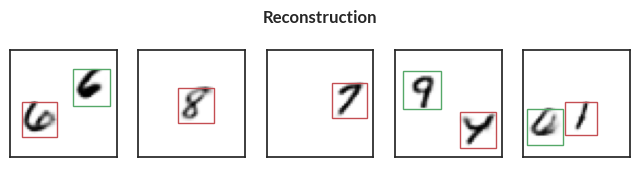

Epoch=86, total_epoch_step_time=153.00, loss=636.86
accuracy=0.9825500249862671, counts=[[19936    12     0     0]
 [    1 19842   176     1]
 [    3   848 19175     6]]


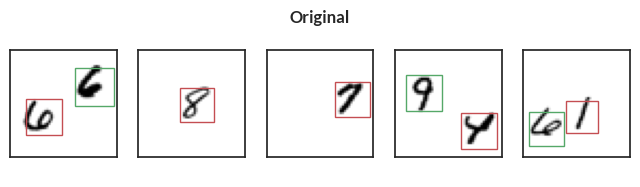

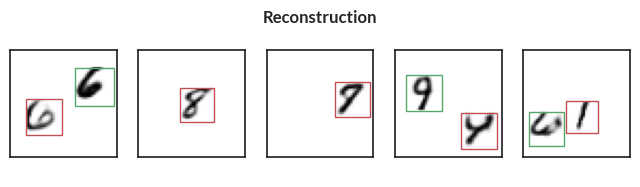

Epoch=87, total_epoch_step_time=154.73, loss=636.82
accuracy=0.9827166795730591, counts=[[19942     6     0     0]
 [    1 19833   185     1]
 [    4   831 19188     9]]


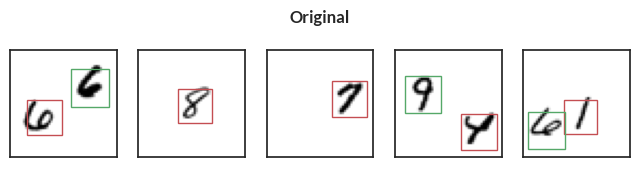

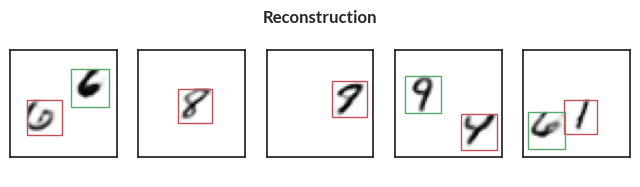

Epoch=88, total_epoch_step_time=156.46, loss=637.07
accuracy=0.9827666878700256, counts=[[19942     6     0     0]
 [    0 19833   186     1]
 [    1   832 19191     8]]


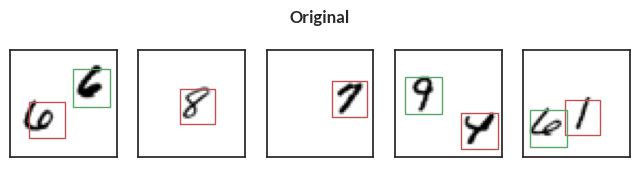

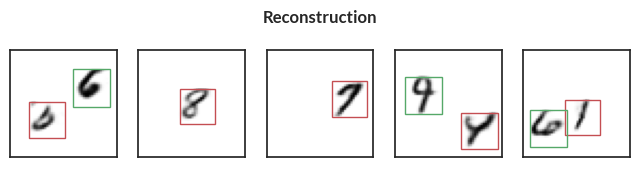

Epoch=89, total_epoch_step_time=158.23, loss=637.14
accuracy=0.9828000068664551, counts=[[19941     7     0     0]
 [    0 19834   185     1]
 [    0   831 19193     8]]


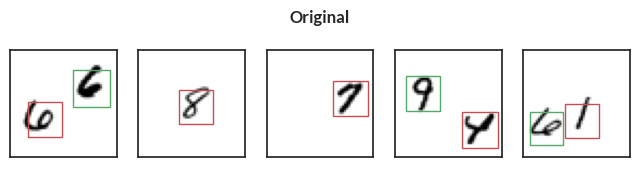

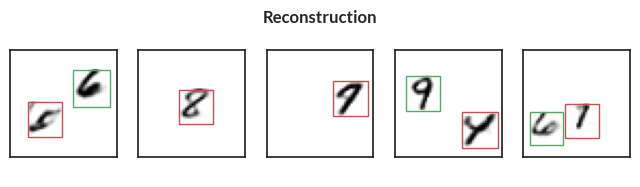

Epoch=90, total_epoch_step_time=159.96, loss=637.00
accuracy=0.9826833605766296, counts=[[19942     6     0     0]
 [    1 19831   187     1]
 [    3   832 19188     9]]


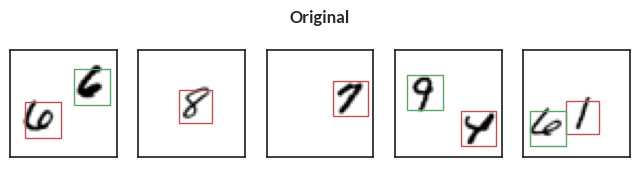

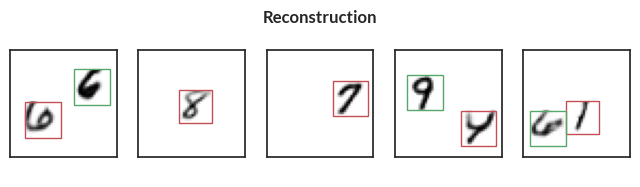

Epoch=91, total_epoch_step_time=161.73, loss=637.03
accuracy=0.9828333258628845, counts=[[19945     3     0     0]
 [    2 19839   178     1]
 [    1   836 19186     9]]


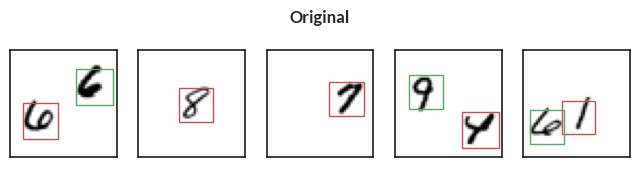

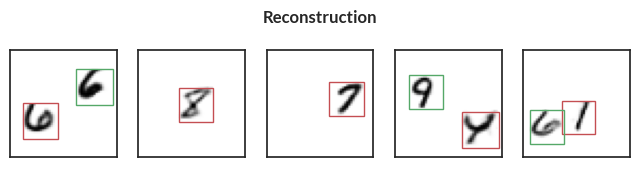

Epoch=92, total_epoch_step_time=163.48, loss=637.04
accuracy=0.9827333688735962, counts=[[19945     3     0     0]
 [    4 19833   182     1]
 [    4   833 19186     9]]


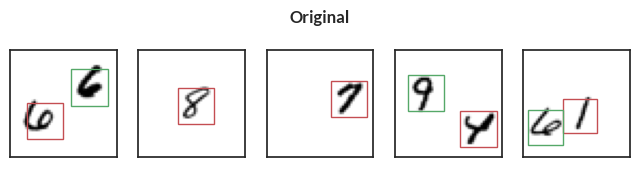

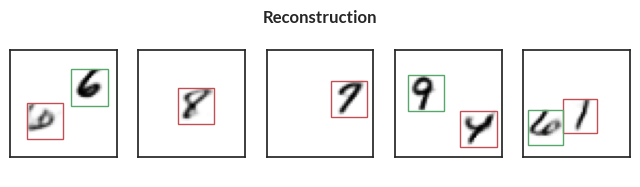

Epoch=93, total_epoch_step_time=165.23, loss=637.20
accuracy=0.9828000068664551, counts=[[19940     8     0     0]
 [    0 19834   184     2]
 [    2   828 19194     8]]


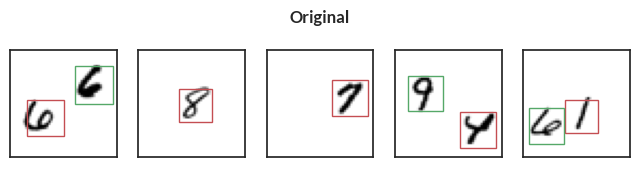

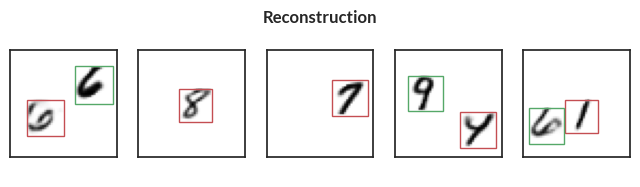

Epoch=94, total_epoch_step_time=167.01, loss=637.12
accuracy=0.9830499887466431, counts=[[19945     3     0     0]
 [    4 19830   185     1]
 [    2   816 19208     6]]


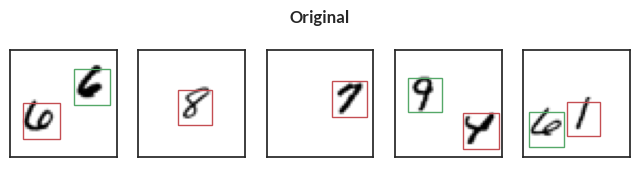

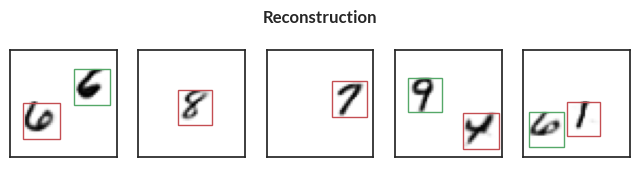

Epoch=95, total_epoch_step_time=168.80, loss=637.13
accuracy=0.9829333424568176, counts=[[19942     6     0     0]
 [    1 19839   179     1]
 [    2   828 19195     7]]


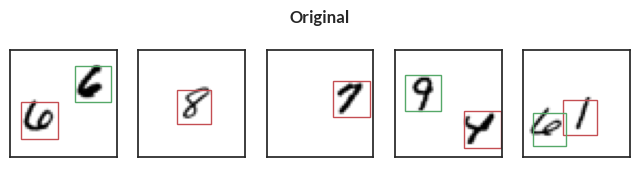

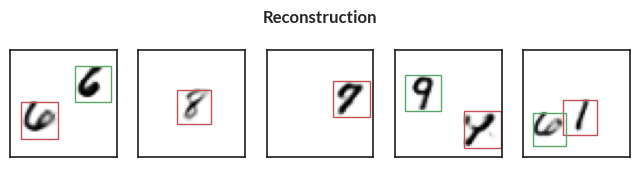

Epoch=96, total_epoch_step_time=170.52, loss=637.36
accuracy=0.9828333258628845, counts=[[19939     9     0     0]
 [    3 19836   180     1]
 [    1   829 19195     7]]


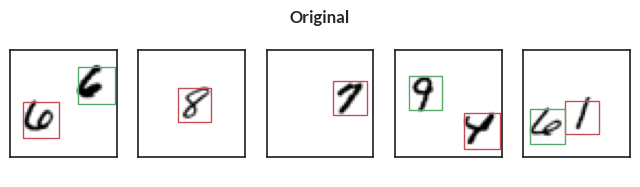

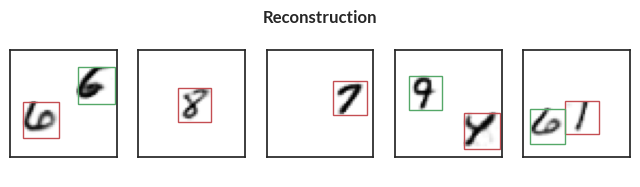

Epoch=97, total_epoch_step_time=172.25, loss=637.19
accuracy=0.9829333424568176, counts=[[19945     3     0     0]
 [    3 19834   182     1]
 [    3   823 19197     9]]


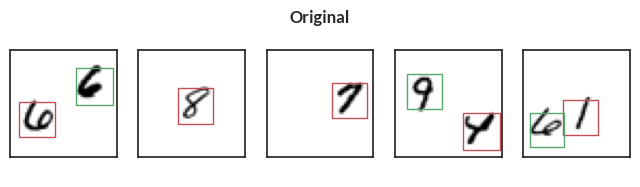

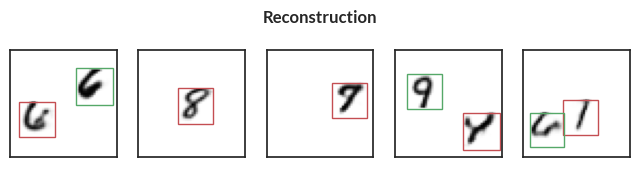

Epoch=98, total_epoch_step_time=173.98, loss=637.47
accuracy=0.9829166531562805, counts=[[19941     7     0     0]
 [    2 19835   182     1]
 [    4   821 19199     8]]


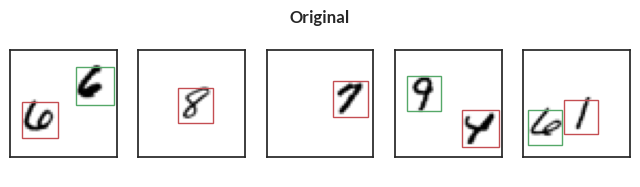

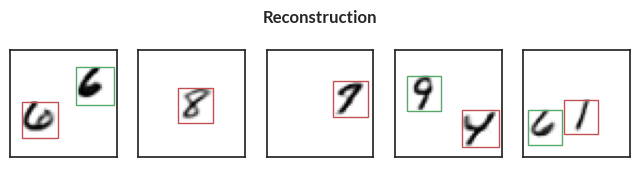

Epoch=99, total_epoch_step_time=175.71, loss=637.46
accuracy=0.9828500151634216, counts=[[19940     8     0     0]
 [    3 19833   183     1]
 [    1   825 19198     8]]


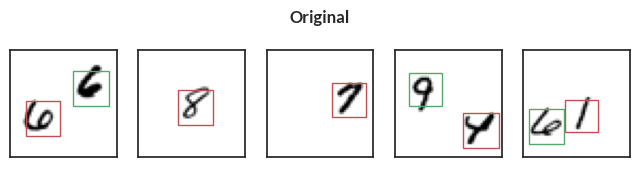

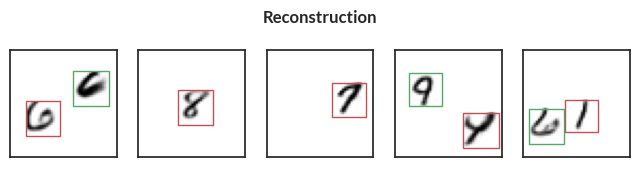

Epoch=100, total_epoch_step_time=177.44, loss=637.18
accuracy=0.9828000068664551, counts=[[19941     7     0     0]
 [    0 19836   183     1]
 [    0   832 19191     9]]


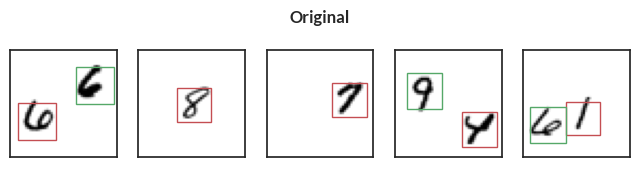

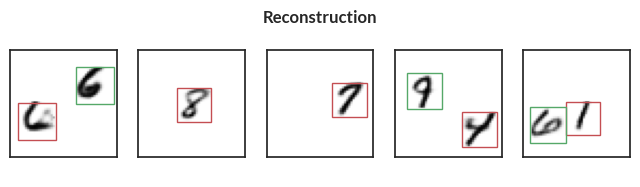

Epoch=101, total_epoch_step_time=179.17, loss=637.34
accuracy=0.9829833507537842, counts=[[19945     3     0     0]
 [    1 19835   183     1]
 [    0   824 19199     9]]


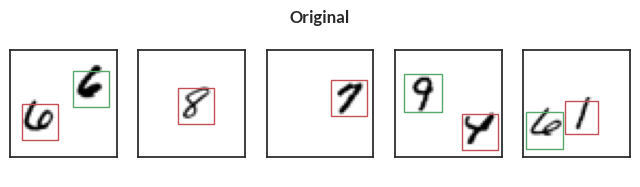

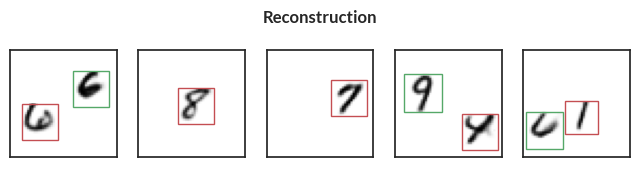

Epoch=102, total_epoch_step_time=180.89, loss=637.50
accuracy=0.9828000068664551, counts=[[19939     9     0     0]
 [    3 19834   182     1]
 [    1   827 19195     9]]


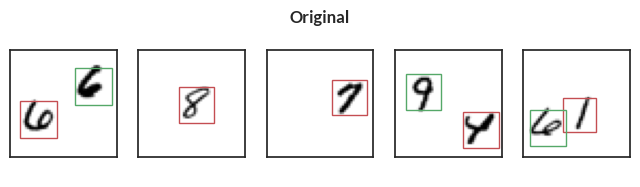

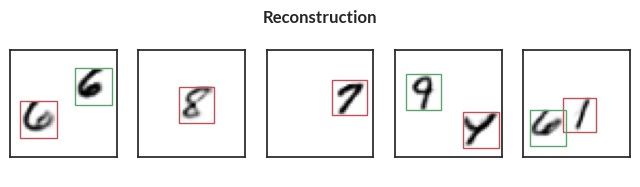

Epoch=103, total_epoch_step_time=182.60, loss=637.43
accuracy=0.9828667044639587, counts=[[19943     5     0     0]
 [    1 19837   181     1]
 [    3   827 19192    10]]


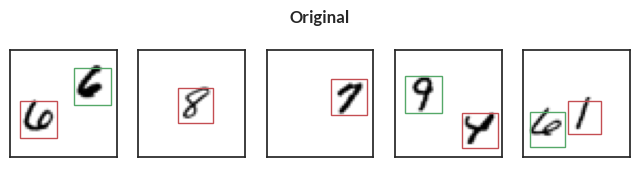

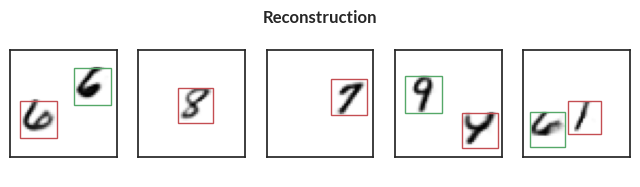

Epoch=104, total_epoch_step_time=184.30, loss=637.59
accuracy=0.9829666614532471, counts=[[19945     3     0     0]
 [    2 19840   177     1]
 [    1   830 19193     8]]


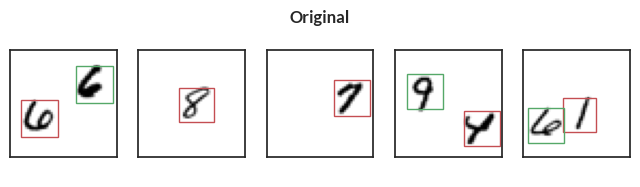

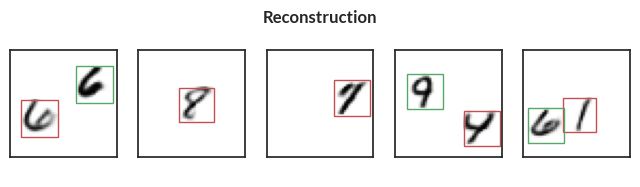

Epoch=105, total_epoch_step_time=186.00, loss=637.36
accuracy=0.9829166531562805, counts=[[19942     6     0     0]
 [    2 19837   180     1]
 [    0   829 19196     7]]


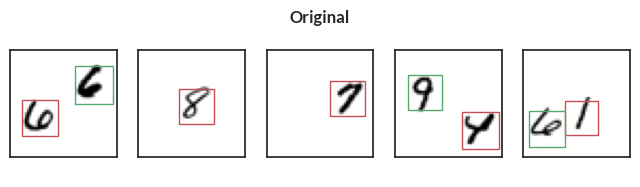

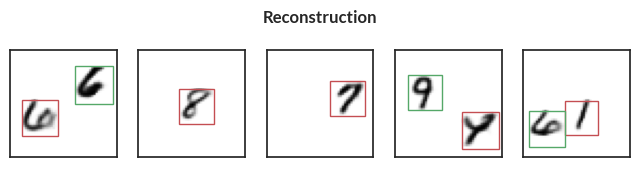

Epoch=106, total_epoch_step_time=187.71, loss=637.72
accuracy=0.9830166697502136, counts=[[19942     6     0     0]
 [    2 19833   184     1]
 [    0   819 19206     7]]


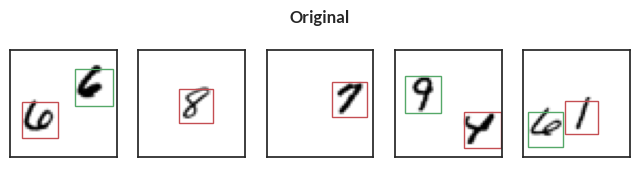

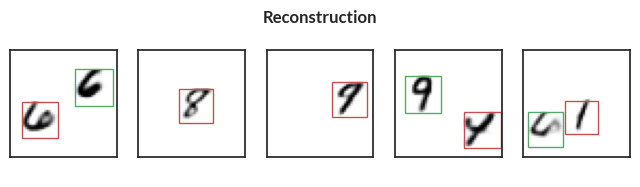

Epoch=107, total_epoch_step_time=189.40, loss=637.55
accuracy=0.9828333258628845, counts=[[19942     6     0     0]
 [    2 19832   185     1]
 [    1   826 19196     9]]


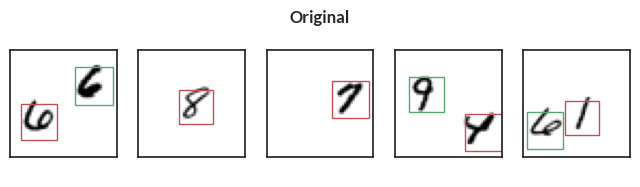

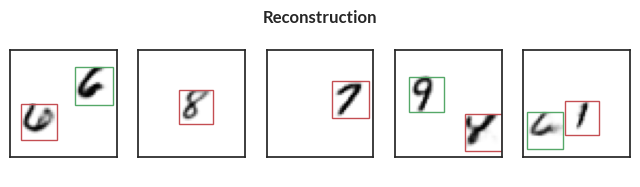

Epoch=108, total_epoch_step_time=191.15, loss=637.62
accuracy=0.9826833605766296, counts=[[19943     5     0     0]
 [    2 19825   192     1]
 [    4   830 19193     5]]


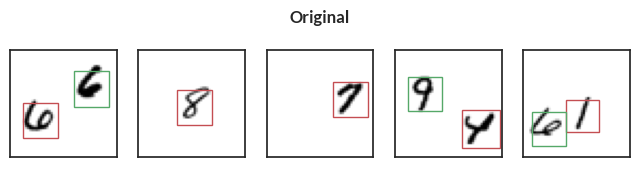

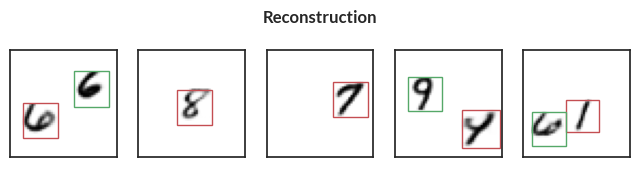

Epoch=109, total_epoch_step_time=192.84, loss=637.70
accuracy=0.9828667044639587, counts=[[19943     5     0     0]
 [    2 19836   181     1]
 [    2   830 19193     7]]


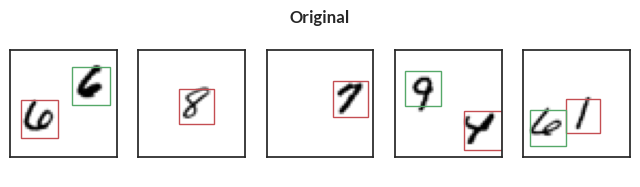

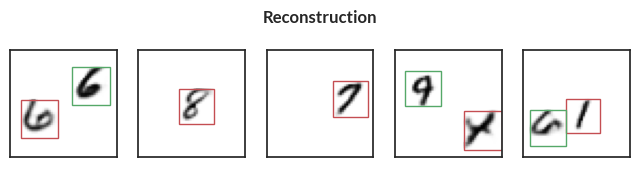

Epoch=110, total_epoch_step_time=194.56, loss=637.81
accuracy=0.9828166961669922, counts=[[19943     5     0     0]
 [    3 19832   184     1]
 [    3   824 19194    11]]


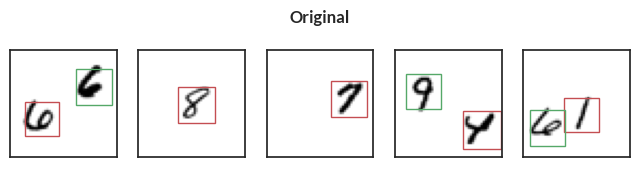

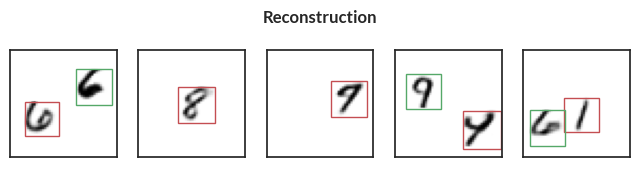

Epoch=111, total_epoch_step_time=196.27, loss=637.82
accuracy=0.9828333258628845, counts=[[19942     6     0     0]
 [    1 19837   181     1]
 [    2   830 19191     9]]


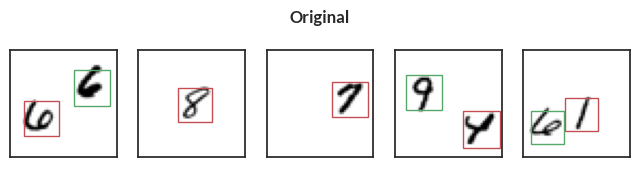

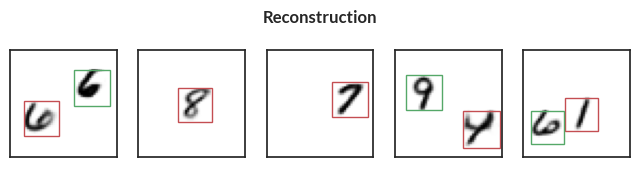

Epoch=112, total_epoch_step_time=198.09, loss=637.83
accuracy=0.9827499985694885, counts=[[19944     4     0     0]
 [    3 19832   184     1]
 [    1   833 19189     9]]


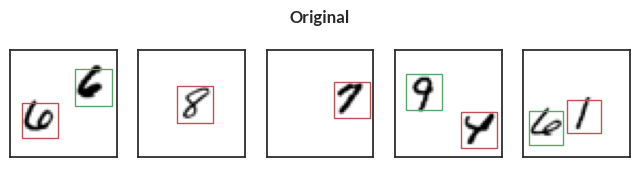

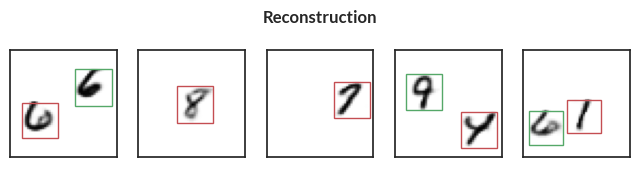

Epoch=113, total_epoch_step_time=199.95, loss=637.78
accuracy=0.9828500151634216, counts=[[19946     2     0     0]
 [    2 19838   179     1]
 [    1   835 19187     9]]


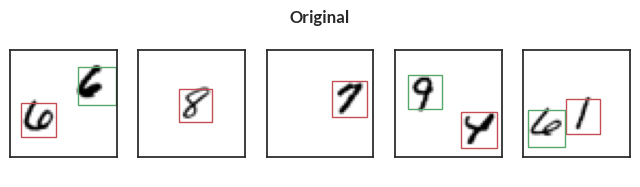

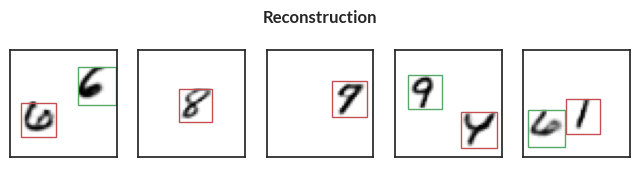

Epoch=114, total_epoch_step_time=201.72, loss=637.93
accuracy=0.9825833439826965, counts=[[19941     7     0     0]
 [    2 19830   187     1]
 [    3   837 19184     8]]


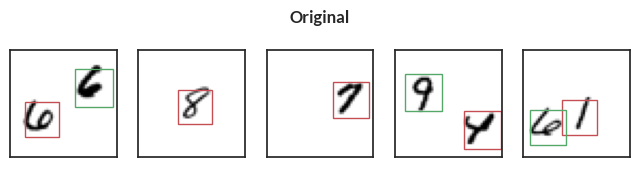

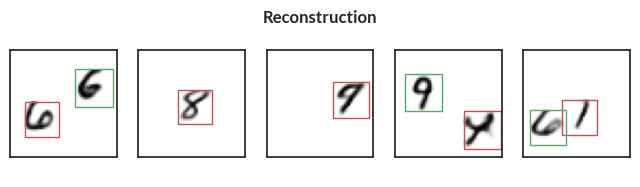

Epoch=115, total_epoch_step_time=203.42, loss=637.77
accuracy=0.9827499985694885, counts=[[19944     4     0     0]
 [    1 19835   183     1]
 [    5   834 19186     7]]


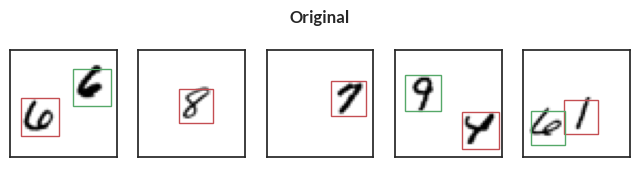

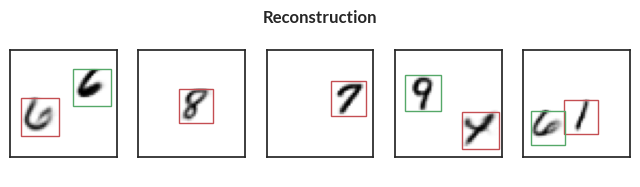

Epoch=116, total_epoch_step_time=205.14, loss=637.84
accuracy=0.982783317565918, counts=[[19943     5     0     0]
 [    2 19836   181     1]
 [    2   835 19188     7]]


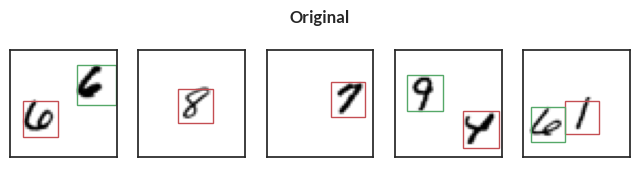

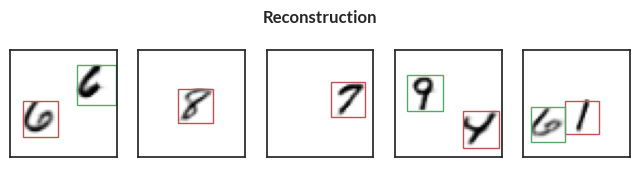

Epoch=117, total_epoch_step_time=206.86, loss=637.79
accuracy=0.9828667044639587, counts=[[19942     6     0     0]
 [    0 19839   180     1]
 [    0   831 19191    10]]


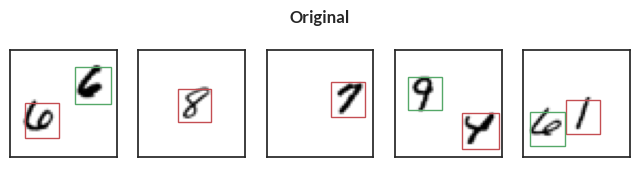

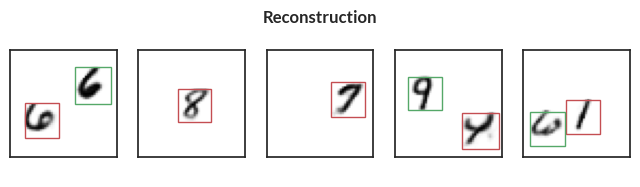

Epoch=118, total_epoch_step_time=208.59, loss=638.06
accuracy=0.9828333258628845, counts=[[19947     1     0     0]
 [    6 19832   181     1]
 [    0   833 19191     8]]


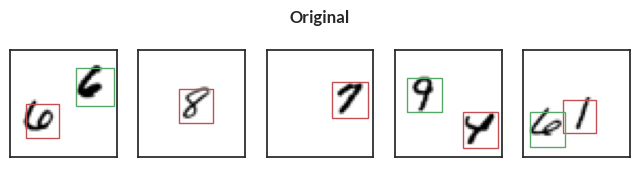

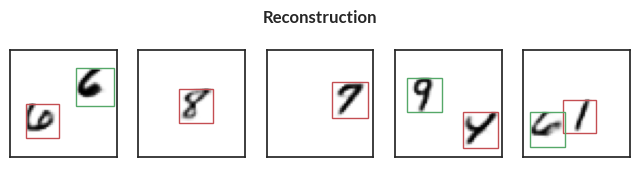

Epoch=119, total_epoch_step_time=210.31, loss=638.00
accuracy=0.9828333258628845, counts=[[19941     7     0     0]
 [    1 19832   186     1]
 [    1   827 19197     7]]


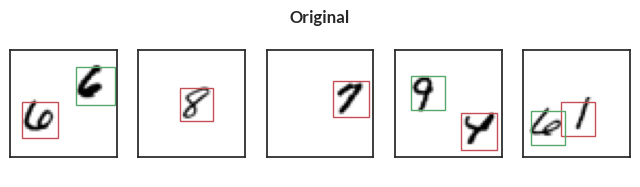

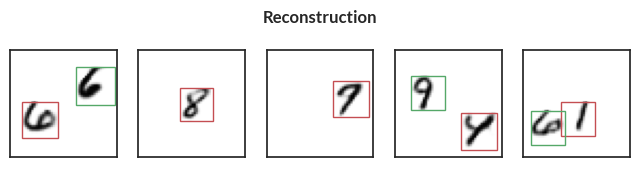

Epoch=120, total_epoch_step_time=212.05, loss=638.15
accuracy=0.9827333688735962, counts=[[19939     9     0     0]
 [    2 19830   187     1]
 [    2   827 19195     8]]


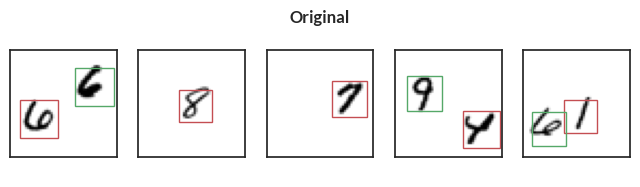

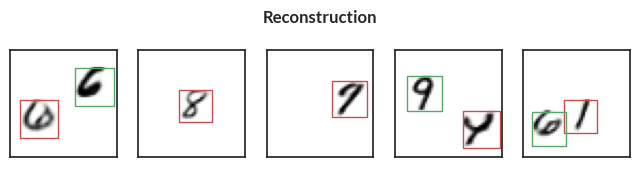

Epoch=121, total_epoch_step_time=213.78, loss=638.12
accuracy=0.9827666878700256, counts=[[19940     8     0     0]
 [    1 19832   186     1]
 [    1   828 19194     9]]


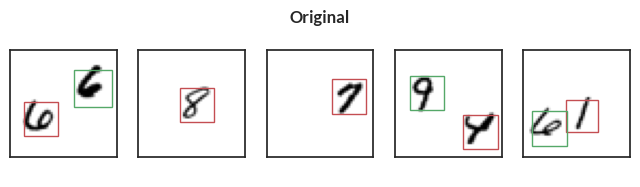

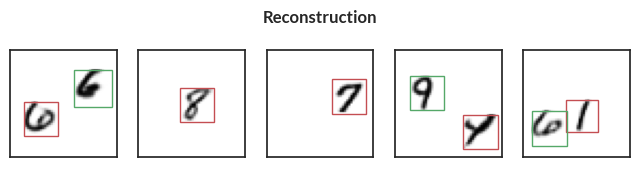

Epoch=122, total_epoch_step_time=215.48, loss=638.11
accuracy=0.982783317565918, counts=[[19943     5     0     0]
 [    0 19834   185     1]
 [    1   832 19190     9]]


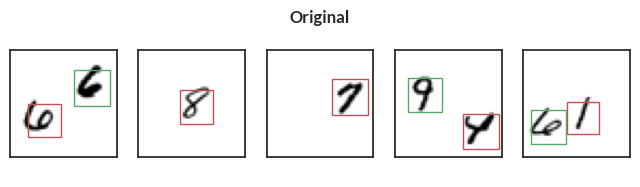

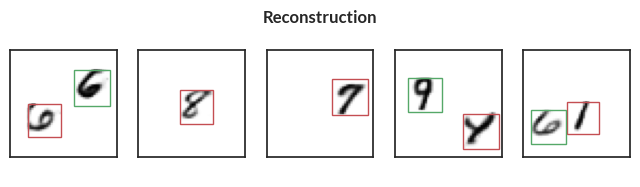

Epoch=123, total_epoch_step_time=217.19, loss=638.23
accuracy=0.9829166531562805, counts=[[19943     5     0     0]
 [    0 19834   185     1]
 [    1   825 19198     8]]


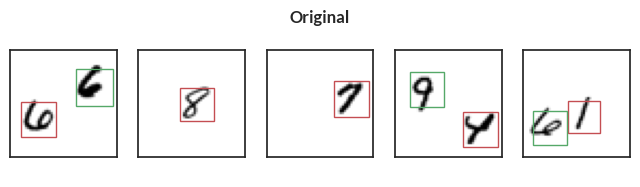

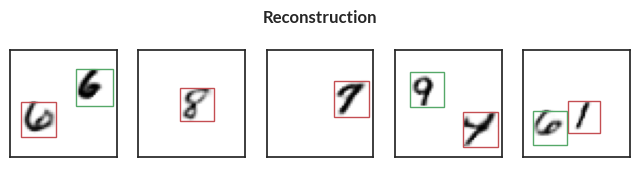

Epoch=124, total_epoch_step_time=218.92, loss=638.32
accuracy=0.9829000234603882, counts=[[19941     7     0     0]
 [    2 19841   176     1]
 [    1   833 19192     6]]


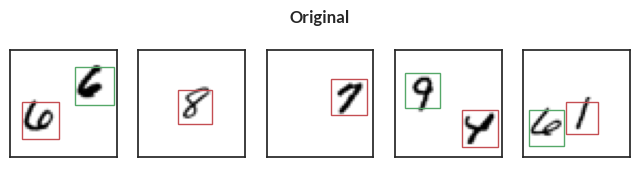

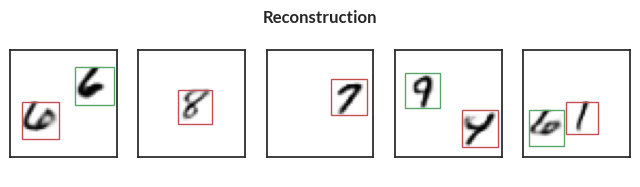

Epoch=125, total_epoch_step_time=220.65, loss=638.27
accuracy=0.9829000234603882, counts=[[19942     6     0     0]
 [    2 19837   180     1]
 [    1   829 19195     7]]


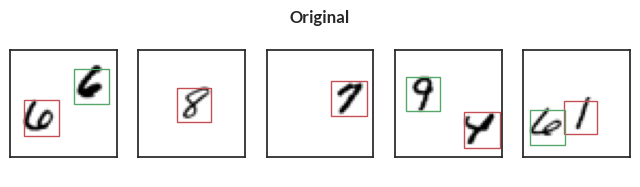

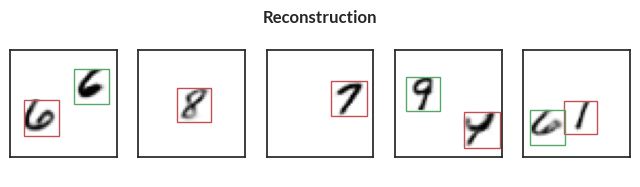

Epoch=126, total_epoch_step_time=222.39, loss=638.31
accuracy=0.9830166697502136, counts=[[19944     4     0     0]
 [    2 19837   180     1]
 [    1   822 19200     9]]


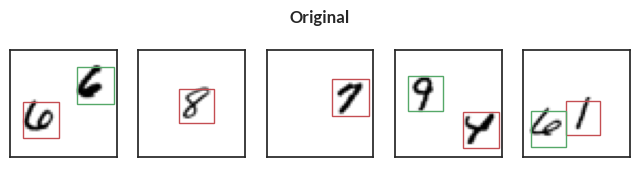

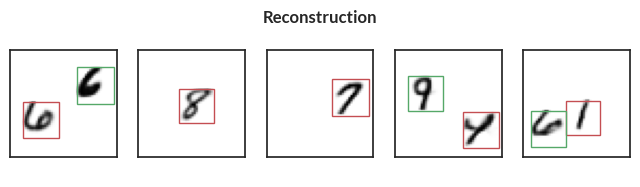

Epoch=127, total_epoch_step_time=224.10, loss=638.26
accuracy=0.9827499985694885, counts=[[19937    11     0     0]
 [    1 19837   181     1]
 [    1   831 19191     9]]


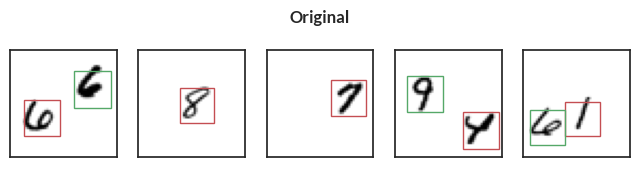

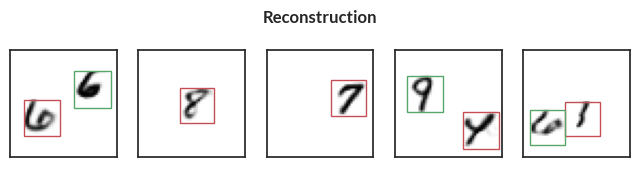

Epoch=128, total_epoch_step_time=225.83, loss=638.25
accuracy=0.9828667044639587, counts=[[19943     5     0     0]
 [    3 19833   183     1]
 [    1   826 19196     9]]


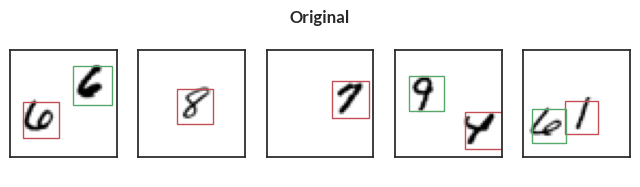

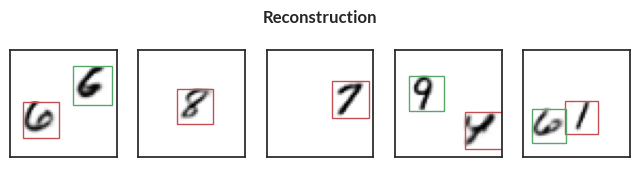

Epoch=129, total_epoch_step_time=227.56, loss=638.50
accuracy=0.9830000400543213, counts=[[19942     6     0     0]
 [    2 19841   176     1]
 [    2   823 19197    10]]


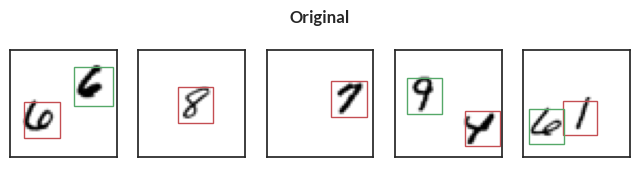

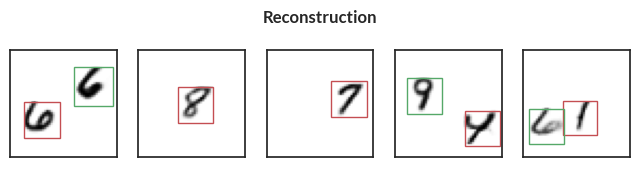

Epoch=130, total_epoch_step_time=229.26, loss=638.45
accuracy=0.9830000400543213, counts=[[19943     5     0     0]
 [    0 19833   186     1]
 [    1   819 19204     8]]


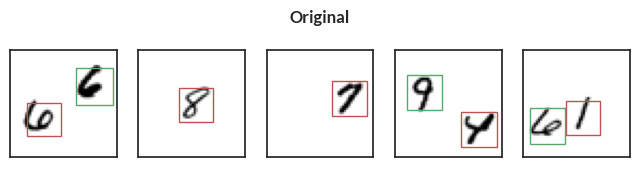

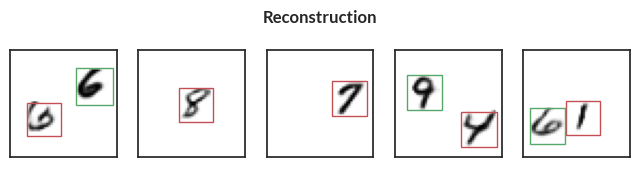

Epoch=131, total_epoch_step_time=230.96, loss=638.31
accuracy=0.9829166531562805, counts=[[19940     8     0     0]
 [    3 19835   181     1]
 [    0   824 19200     8]]


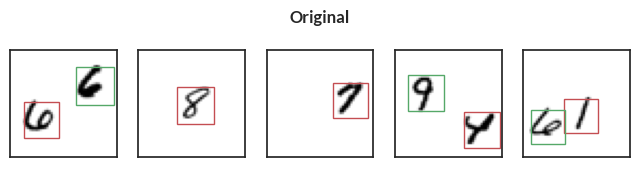

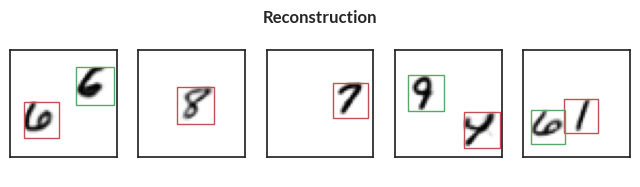

Epoch=132, total_epoch_step_time=232.66, loss=638.32
accuracy=0.9830499887466431, counts=[[19945     3     0     0]
 [    1 19834   184     1]
 [    3   815 19204    10]]


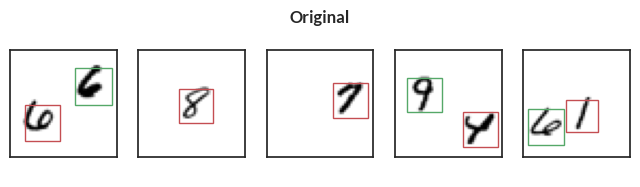

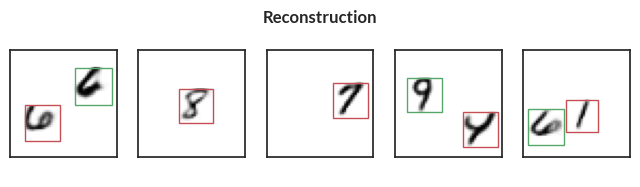

Epoch=133, total_epoch_step_time=234.36, loss=638.50
accuracy=0.9829666614532471, counts=[[19941     7     0     0]
 [    1 19834   184     1]
 [    0   821 19203     8]]


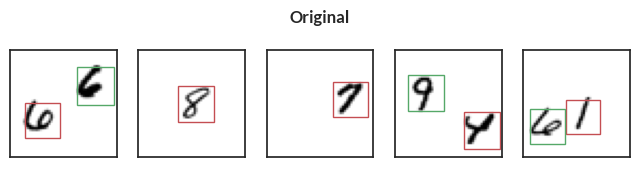

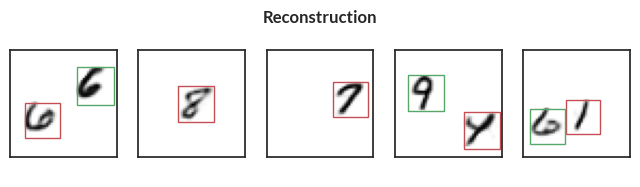

Epoch=134, total_epoch_step_time=236.09, loss=638.38
accuracy=0.9830166697502136, counts=[[19944     4     0     0]
 [    1 19839   179     1]
 [    2   823 19198     9]]


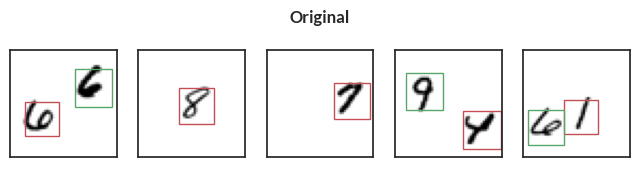

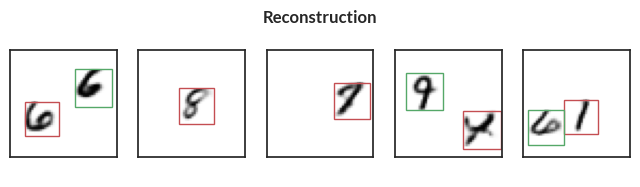

Epoch=135, total_epoch_step_time=237.79, loss=638.41
accuracy=0.9829500317573547, counts=[[19941     7     0     0]
 [    5 19837   177     1]
 [    2   822 19199     9]]


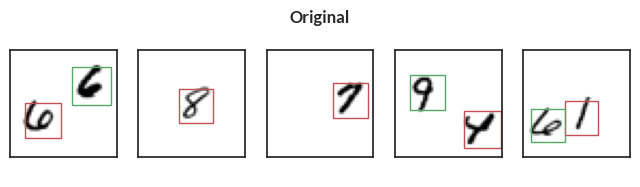

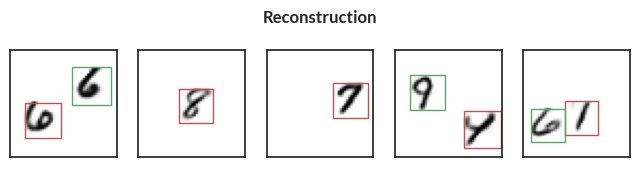

Epoch=136, total_epoch_step_time=239.49, loss=638.41
accuracy=0.9830499887466431, counts=[[19941     7     0     0]
 [    3 19837   179     1]
 [    0   818 19205     9]]


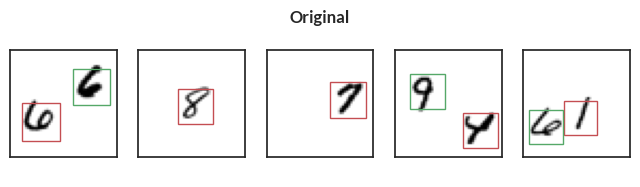

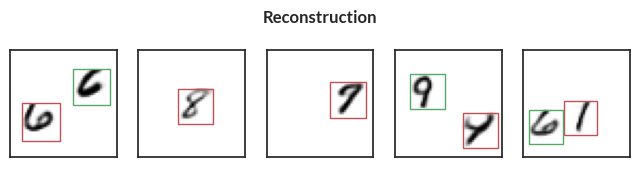

Epoch=137, total_epoch_step_time=241.19, loss=638.69
accuracy=0.9829500317573547, counts=[[19941     7     0     0]
 [    3 19838   178     1]
 [    4   822 19198     8]]


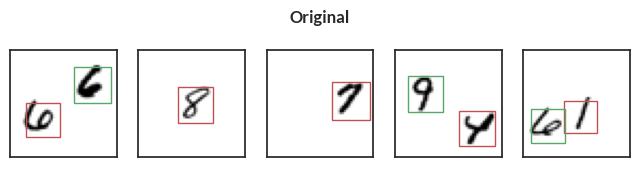

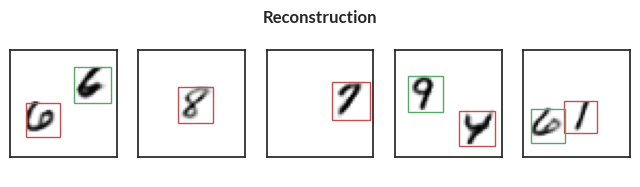

Epoch=138, total_epoch_step_time=242.91, loss=638.70
accuracy=0.9829000234603882, counts=[[19941     7     0     0]
 [    2 19838   179     1]
 [    2   827 19195     8]]


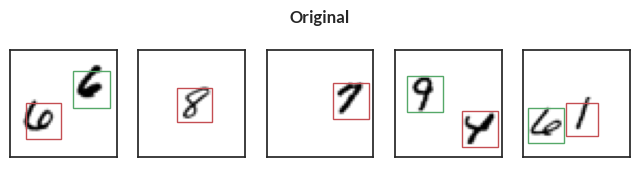

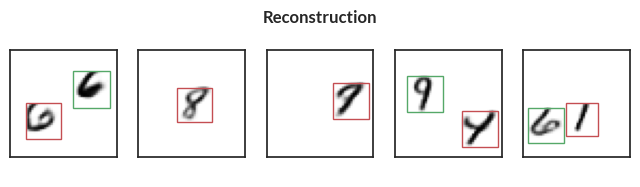

Epoch=139, total_epoch_step_time=244.63, loss=638.52
accuracy=0.9829333424568176, counts=[[19943     5     0     0]
 [    3 19837   179     1]
 [    1   827 19196     8]]


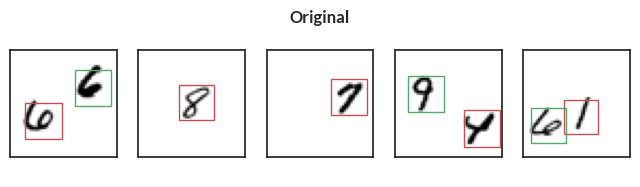

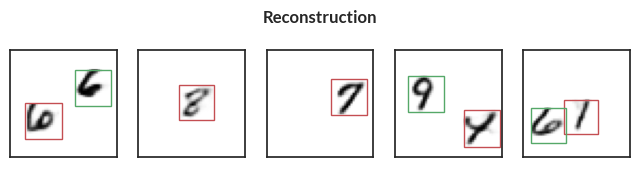

Epoch=140, total_epoch_step_time=246.35, loss=638.76
accuracy=0.9829833507537842, counts=[[19938    10     0     0]
 [    2 19837   180     1]
 [    0   820 19204     8]]


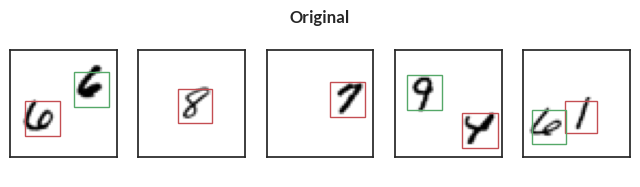

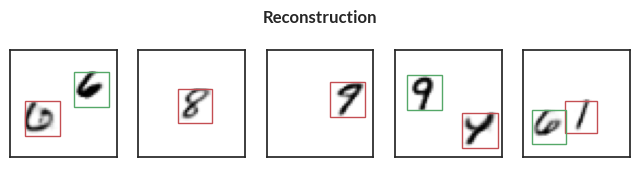

Epoch=141, total_epoch_step_time=248.07, loss=638.65
accuracy=0.9829666614532471, counts=[[19942     6     0     0]
 [    1 19837   181     1]
 [    1   824 19199     8]]


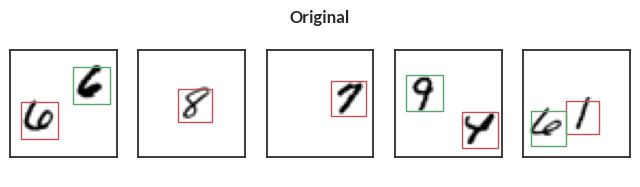

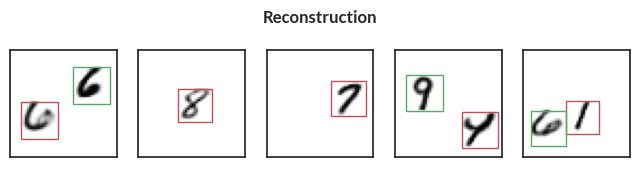

Epoch=142, total_epoch_step_time=249.79, loss=638.69
accuracy=0.9828667044639587, counts=[[19941     7     0     0]
 [    3 19835   181     1]
 [    5   823 19196     8]]


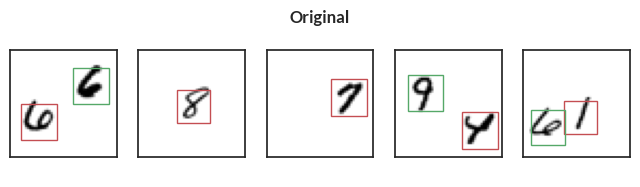

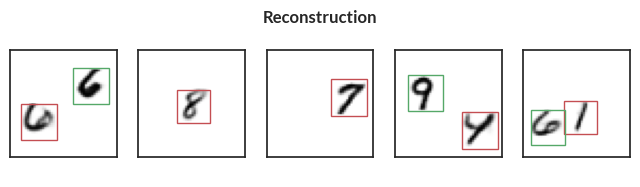

Epoch=143, total_epoch_step_time=251.53, loss=638.61
accuracy=0.9830333590507507, counts=[[19946     2     0     0]
 [    2 19836   181     1]
 [    2   822 19200     8]]


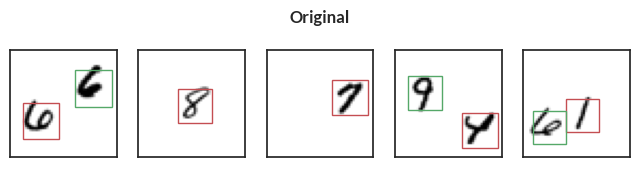

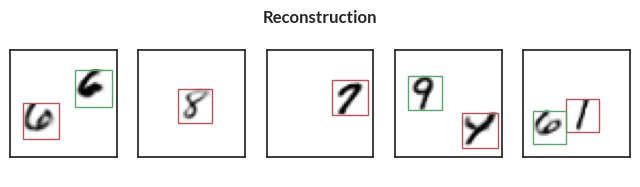

Epoch=144, total_epoch_step_time=253.33, loss=638.60
accuracy=0.9830000400543213, counts=[[19944     4     0     0]
 [    2 19840   177     1]
 [    1   825 19196    10]]


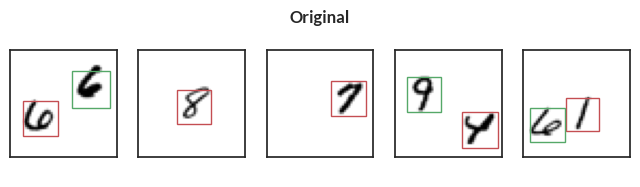

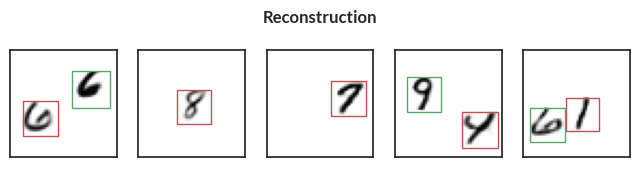

Epoch=145, total_epoch_step_time=255.07, loss=638.86
accuracy=0.9827499985694885, counts=[[19942     6     0     0]
 [    0 19834   185     1]
 [    4   829 19189    10]]


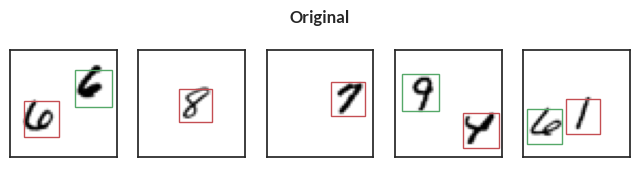

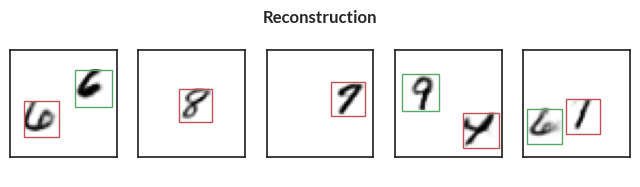

Epoch=146, total_epoch_step_time=256.78, loss=638.72
accuracy=0.9829333424568176, counts=[[19942     6     0     0]
 [    1 19837   181     1]
 [    2   824 19197     9]]


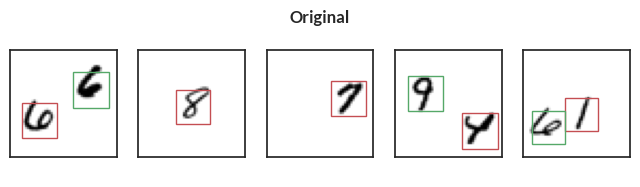

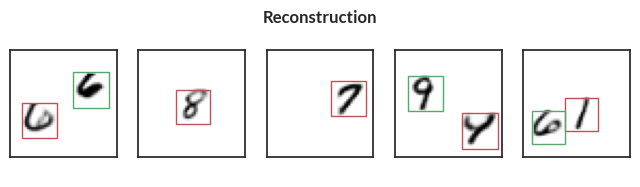

Epoch=147, total_epoch_step_time=258.46, loss=638.96
accuracy=0.9828333258628845, counts=[[19941     7     0     0]
 [    2 19837   180     1]
 [    1   829 19192    10]]


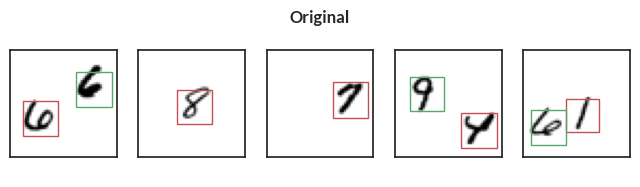

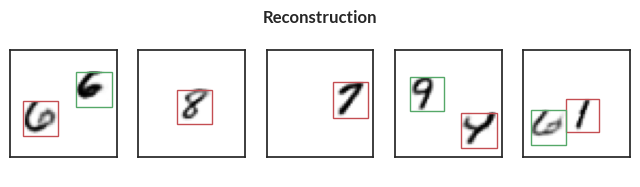

Epoch=148, total_epoch_step_time=260.17, loss=638.91
accuracy=0.9829166531562805, counts=[[19942     6     0     0]
 [    2 19837   180     1]
 [    3   824 19196     9]]


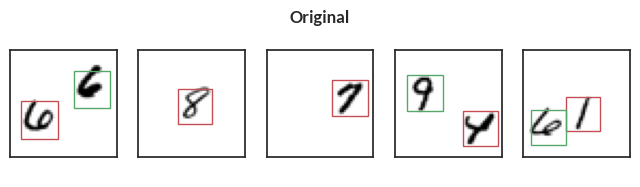

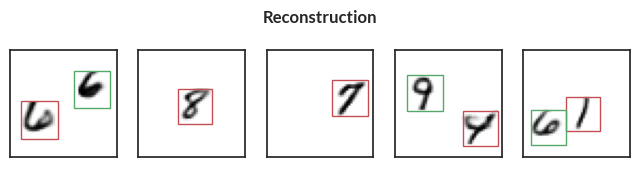

Epoch=149, total_epoch_step_time=261.89, loss=638.93
accuracy=0.9830333590507507, counts=[[19945     2     1     0]
 [    3 19839   177     1]
 [    0   824 19198    10]]


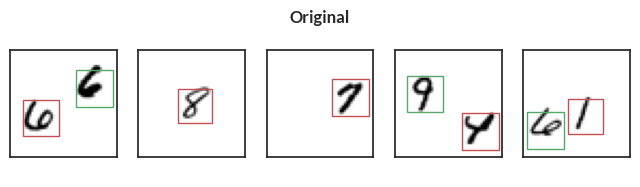

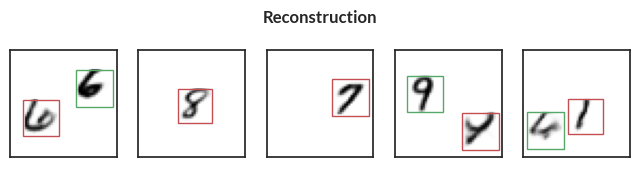

Epoch=150, total_epoch_step_time=263.58, loss=638.98
accuracy=0.9828000068664551, counts=[[19940     8     0     0]
 [    2 19839   178     1]
 [    4   830 19189     9]]


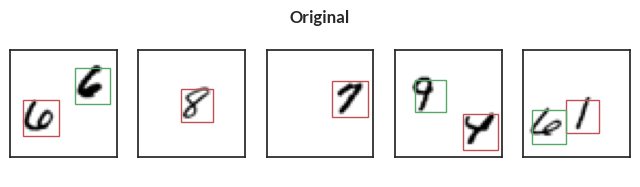

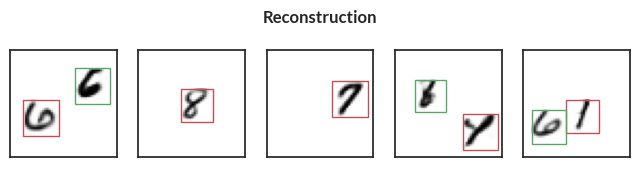

Epoch=151, total_epoch_step_time=265.26, loss=639.08
accuracy=0.9829166531562805, counts=[[19944     4     0     0]
 [    7 19837   175     1]
 [    2   827 19194     9]]


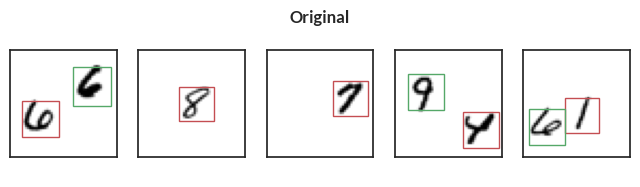

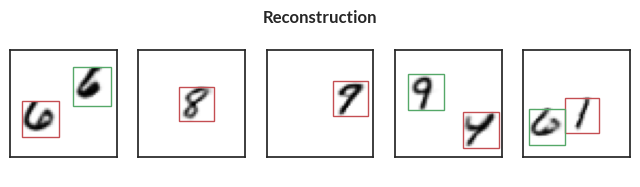

Epoch=152, total_epoch_step_time=266.96, loss=638.97
accuracy=0.9830333590507507, counts=[[19944     4     0     0]
 [    3 19840   176     1]
 [    2   823 19198     9]]


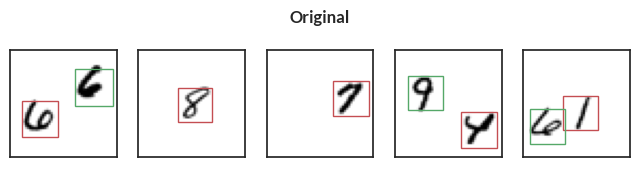

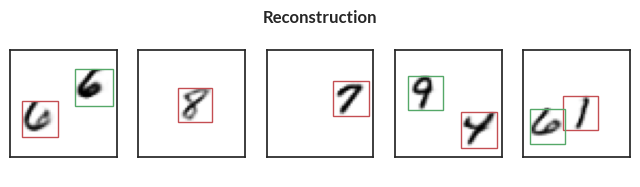

Epoch=153, total_epoch_step_time=268.65, loss=638.99
accuracy=0.9829833507537842, counts=[[19945     3     0     0]
 [    4 19838   176     2]
 [    2   826 19196     8]]


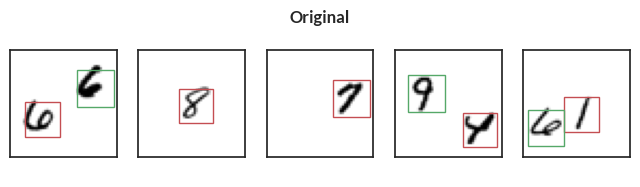

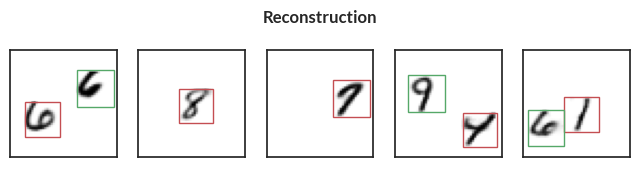

Epoch=154, total_epoch_step_time=270.36, loss=638.91
accuracy=0.9828833341598511, counts=[[19944     4     0     0]
 [    3 19836   180     1]
 [    0   829 19193    10]]


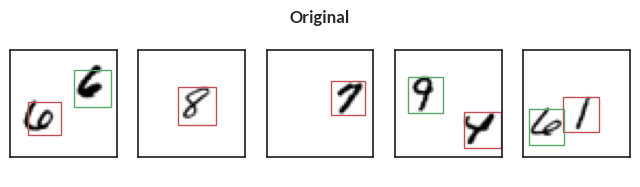

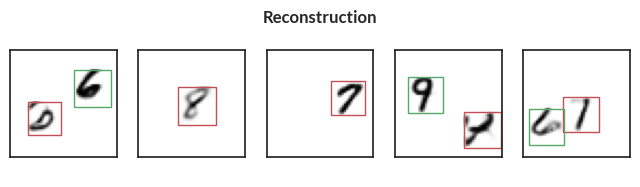

Epoch=155, total_epoch_step_time=272.06, loss=639.12
accuracy=0.9831166863441467, counts=[[19945     3     0     0]
 [    0 19843   176     1]
 [    1   824 19199     8]]


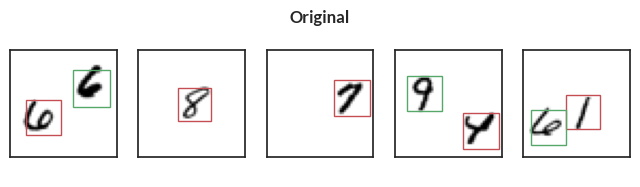

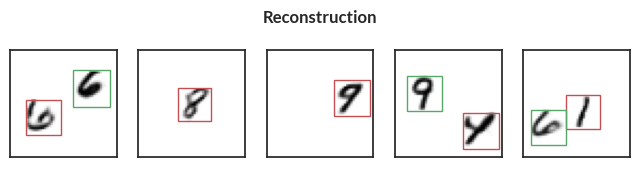

Epoch=156, total_epoch_step_time=273.77, loss=639.18
accuracy=0.9829333424568176, counts=[[19942     6     0     0]
 [    3 19838   178     1]
 [    1   827 19196     8]]


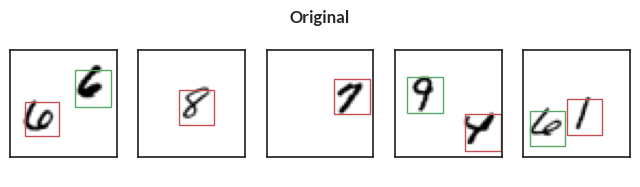

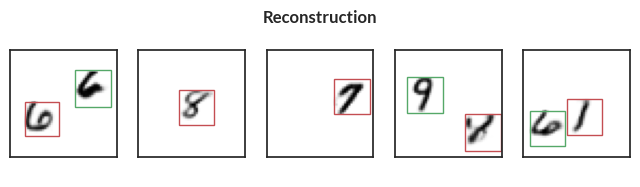

Epoch=157, total_epoch_step_time=275.48, loss=639.12
accuracy=0.9829500317573547, counts=[[19941     7     0     0]
 [    1 19842   176     1]
 [    1   826 19194    11]]


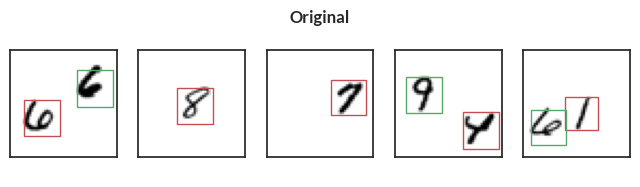

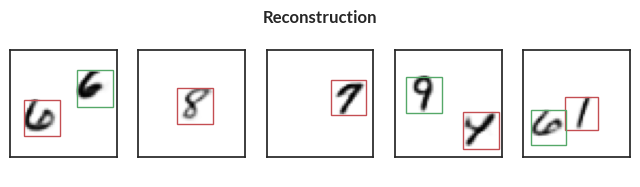

Epoch=158, total_epoch_step_time=277.17, loss=639.16
accuracy=0.9830999970436096, counts=[[19946     2     0     0]
 [    2 19845   172     1]
 [    0   830 19195     7]]


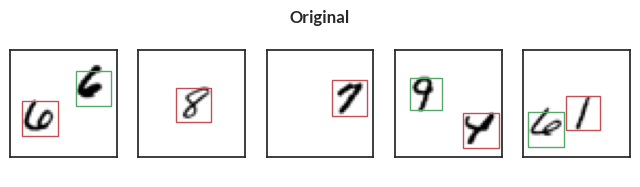

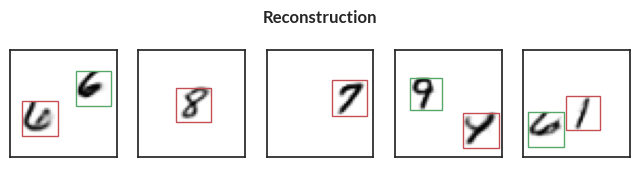

Epoch=159, total_epoch_step_time=278.85, loss=639.15
accuracy=0.9828500151634216, counts=[[19942     6     0     0]
 [    3 19838   178     1]
 [    2   831 19191     8]]


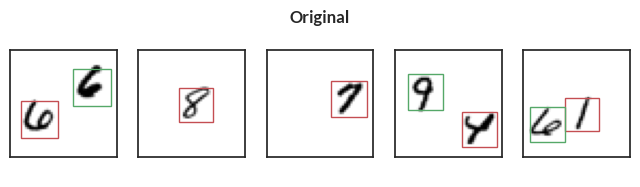

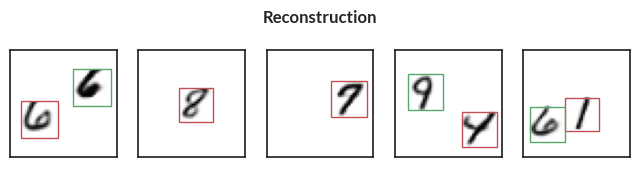

Epoch=160, total_epoch_step_time=280.54, loss=639.21
accuracy=0.9829500317573547, counts=[[19942     6     0     0]
 [    4 19839   176     1]
 [    2   825 19196     9]]


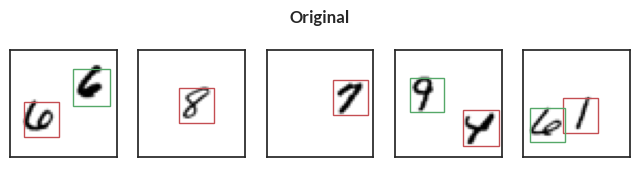

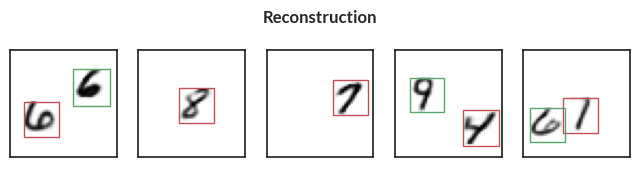

Epoch=161, total_epoch_step_time=282.23, loss=639.19
accuracy=0.9831666946411133, counts=[[19943     5     0     0]
 [    1 19844   174     1]
 [    2   819 19203     8]]


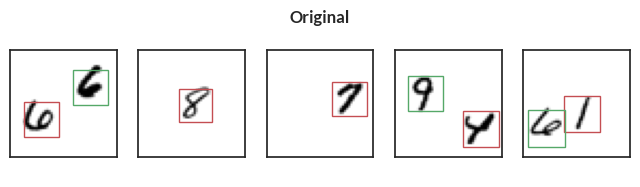

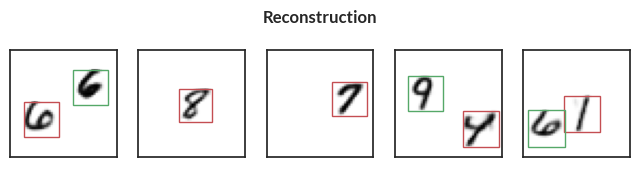

Epoch=162, total_epoch_step_time=283.92, loss=639.18
accuracy=0.9830999970436096, counts=[[19946     2     0     0]
 [    2 19844   173     1]
 [    1   828 19196     7]]


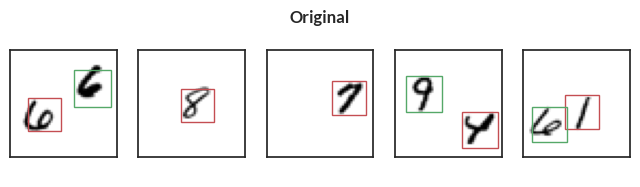

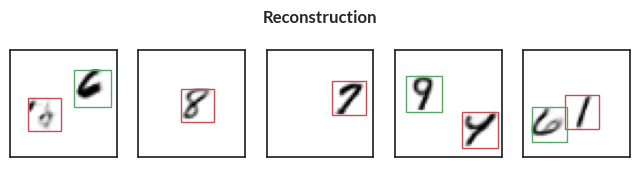

Epoch=163, total_epoch_step_time=285.62, loss=639.27
accuracy=0.9829333424568176, counts=[[19936    12     0     0]
 [    0 19840   179     1]
 [    1   822 19200     9]]


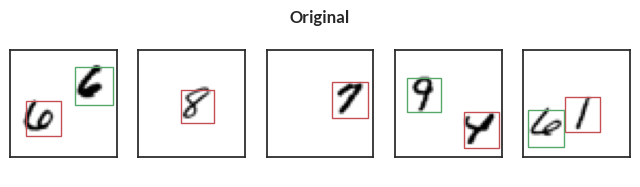

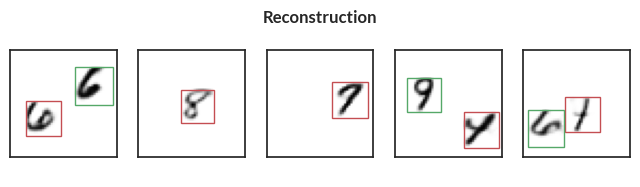

Epoch=164, total_epoch_step_time=287.31, loss=639.35
accuracy=0.9829500317573547, counts=[[19943     5     0     0]
 [    1 19837   181     1]
 [    1   826 19197     8]]


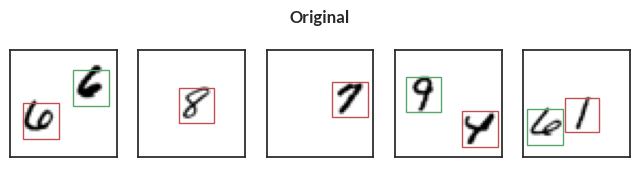

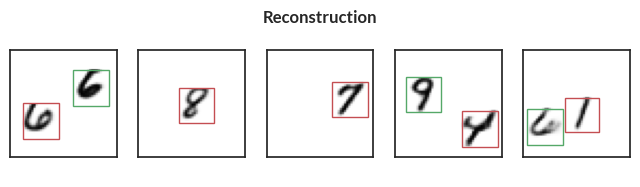

Epoch=165, total_epoch_step_time=289.03, loss=639.21
accuracy=0.9828833341598511, counts=[[19943     5     0     0]
 [    2 19837   180     1]
 [    1   827 19193    11]]


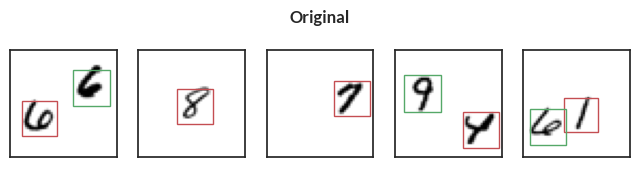

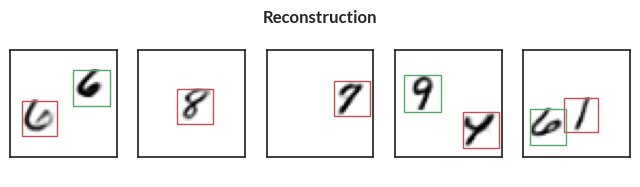

Epoch=166, total_epoch_step_time=290.77, loss=639.32
accuracy=0.9830166697502136, counts=[[19944     4     0     0]
 [    2 19842   175     1]
 [    1   827 19195     9]]


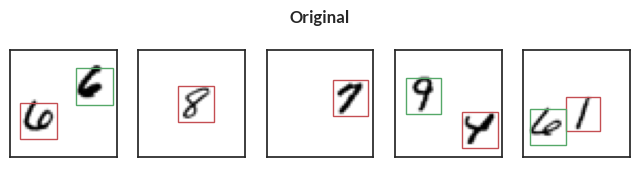

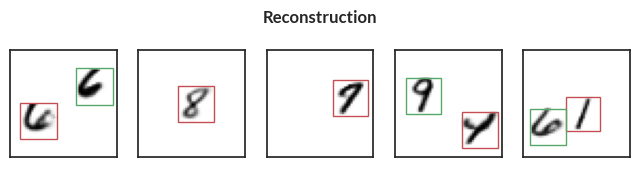

Epoch=167, total_epoch_step_time=292.49, loss=639.22
accuracy=0.9828833341598511, counts=[[19940     8     0     0]
 [    1 19840   178     1]
 [    1   831 19193     7]]


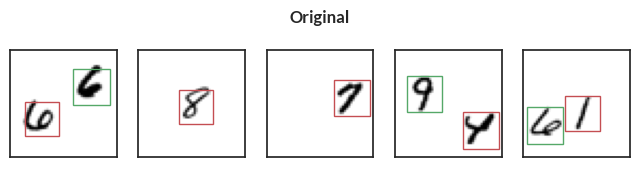

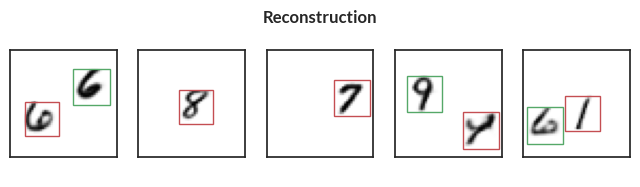

Epoch=168, total_epoch_step_time=294.22, loss=639.05
accuracy=0.9829666614532471, counts=[[19943     5     0     0]
 [    2 19840   177     1]
 [    2   828 19195     7]]


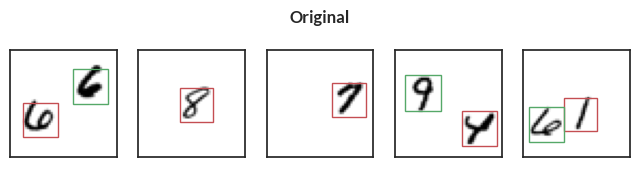

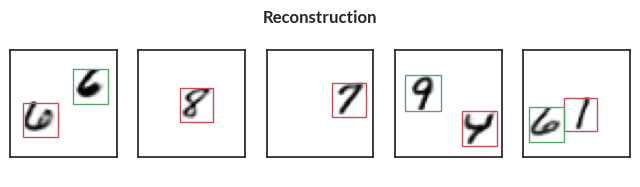

Epoch=169, total_epoch_step_time=295.95, loss=639.21
accuracy=0.9829333424568176, counts=[[19941     7     0     0]
 [    2 19839   178     1]
 [    2   824 19196    10]]


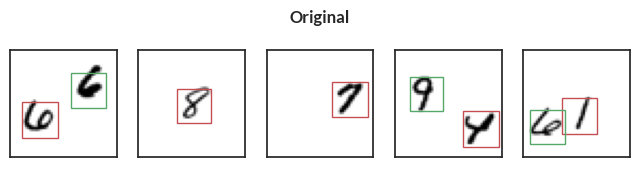

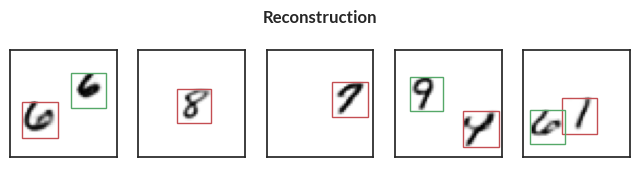

Epoch=170, total_epoch_step_time=297.70, loss=639.29
accuracy=0.9829500317573547, counts=[[19945     3     0     0]
 [    1 19842   176     1]
 [    4   830 19190     8]]


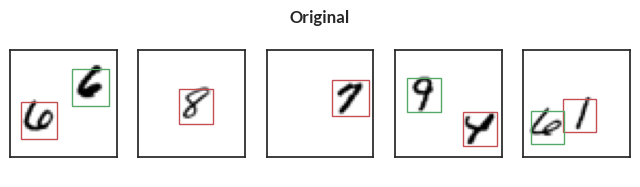

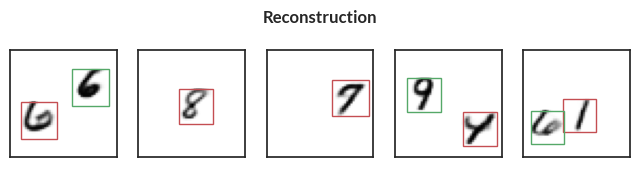

Epoch=171, total_epoch_step_time=299.52, loss=639.52
accuracy=0.9829166531562805, counts=[[19938    10     0     0]
 [    2 19837   180     1]
 [    2   822 19200     8]]


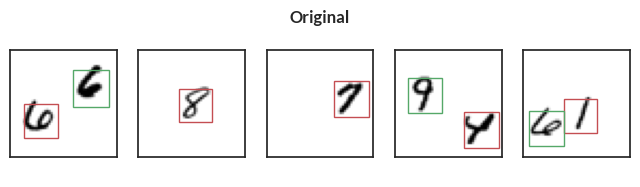

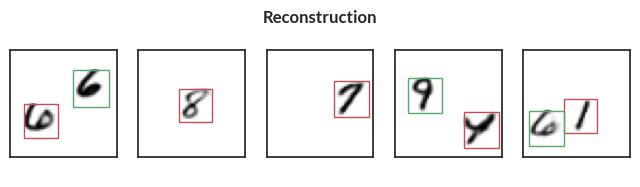

Epoch=172, total_epoch_step_time=301.33, loss=639.58
accuracy=0.9831333160400391, counts=[[19945     3     0     0]
 [    2 19842   175     1]
 [    1   822 19201     8]]


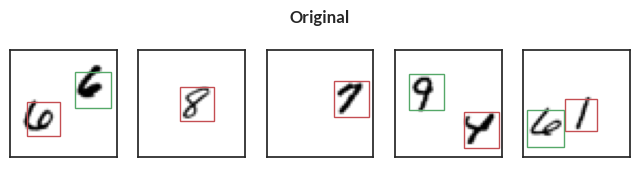

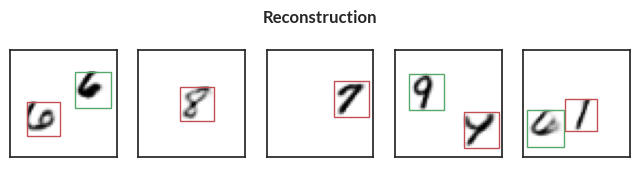

Epoch=173, total_epoch_step_time=303.08, loss=639.49
accuracy=0.9832167029380798, counts=[[19945     3     0     0]
 [    2 19843   174     1]
 [    0   818 19205     9]]


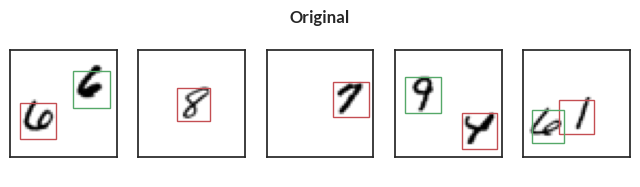

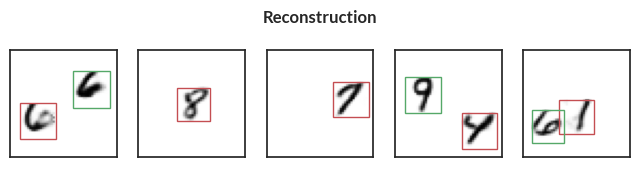

Epoch=174, total_epoch_step_time=304.84, loss=639.43
accuracy=0.9830833673477173, counts=[[19943     5     0     0]
 [    3 19842   174     1]
 [    0   825 19200     7]]


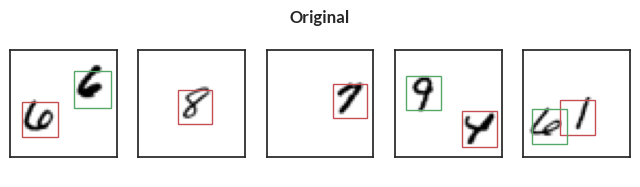

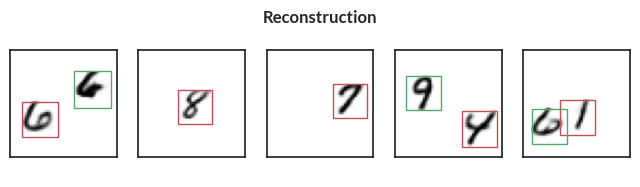

Epoch=175, total_epoch_step_time=306.70, loss=639.51
accuracy=0.9829833507537842, counts=[[19941     7     0     0]
 [    4 19841   174     1]
 [    3   824 19197     8]]


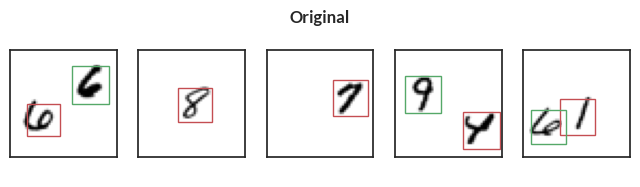

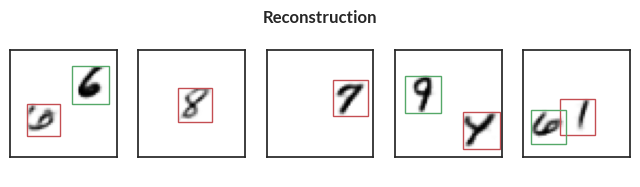

Epoch=176, total_epoch_step_time=308.48, loss=639.54
accuracy=0.9829833507537842, counts=[[19940     8     0     0]
 [    2 19842   175     1]
 [    1   826 19197     8]]


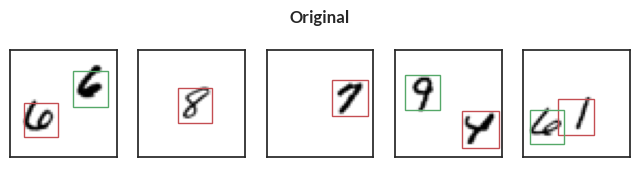

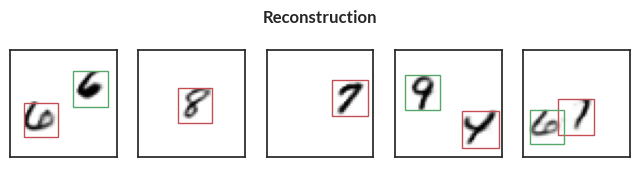

Epoch=177, total_epoch_step_time=310.36, loss=639.36
accuracy=0.9830000400543213, counts=[[19941     7     0     0]
 [    3 19840   176     1]
 [    1   826 19199     6]]


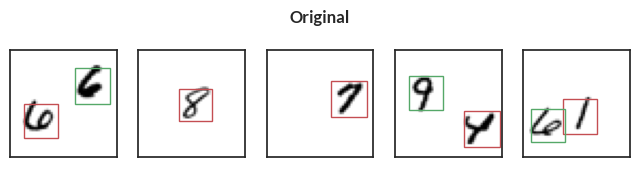

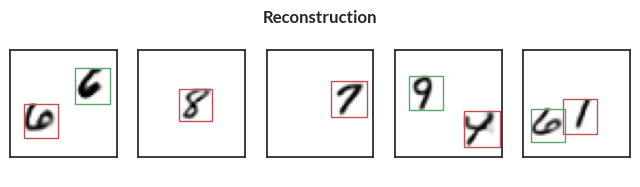

Epoch=178, total_epoch_step_time=312.10, loss=639.54
accuracy=0.9829000234603882, counts=[[19939     9     0     0]
 [    3 19841   175     1]
 [    0   830 19194     8]]


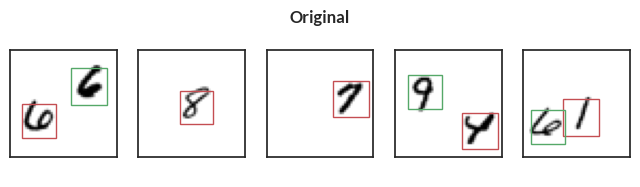

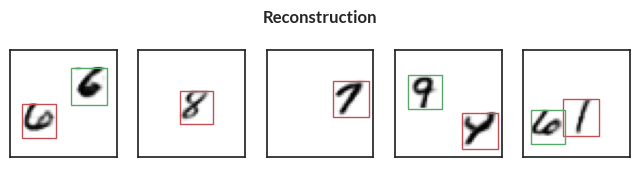

Epoch=179, total_epoch_step_time=313.87, loss=639.53
accuracy=0.9829000234603882, counts=[[19938    10     0     0]
 [    3 19838   178     1]
 [    0   824 19198    10]]


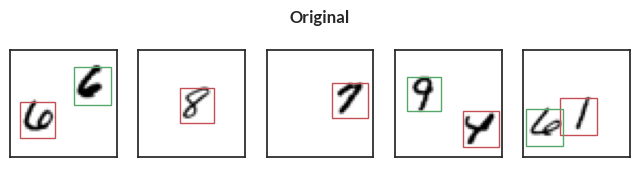

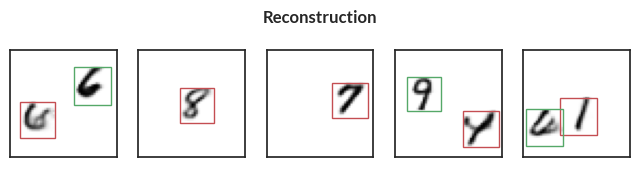

Epoch=180, total_epoch_step_time=315.65, loss=639.50
accuracy=0.9831333160400391, counts=[[19944     4     0     0]
 [    1 19848   170     1]
 [    1   828 19196     7]]


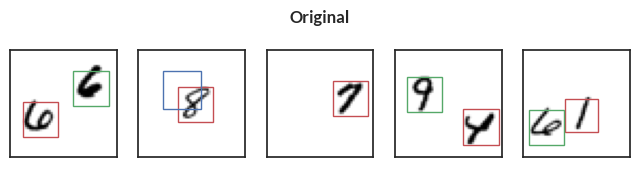

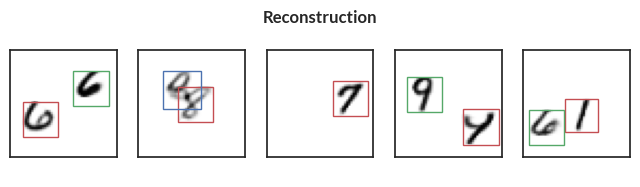

Epoch=181, total_epoch_step_time=317.37, loss=639.65
accuracy=0.9829666614532471, counts=[[19942     6     0     0]
 [    3 19839   177     1]
 [    1   826 19197     8]]


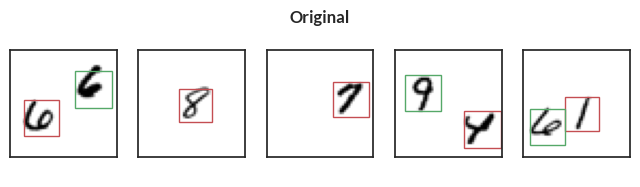

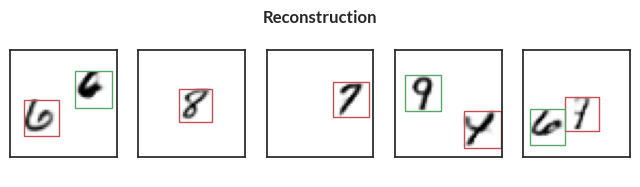

Epoch=182, total_epoch_step_time=319.06, loss=639.64
accuracy=0.9829666614532471, counts=[[19941     7     0     0]
 [    2 19842   175     1]
 [    1   826 19195    10]]


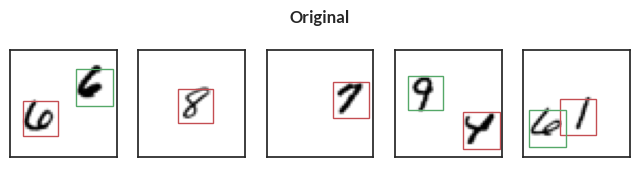

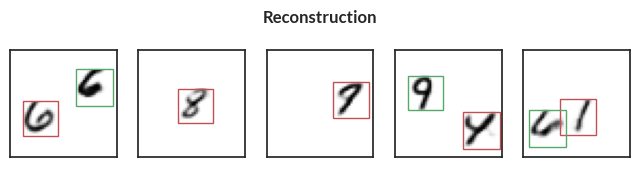

Epoch=183, total_epoch_step_time=320.75, loss=639.57
accuracy=0.9829333424568176, counts=[[19942     6     0     0]
 [    4 19840   175     1]
 [    3   824 19194    11]]


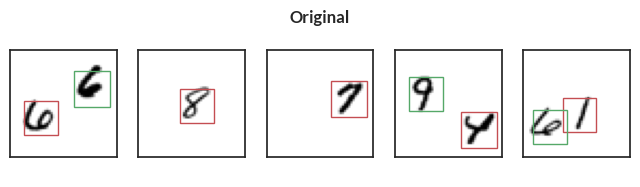

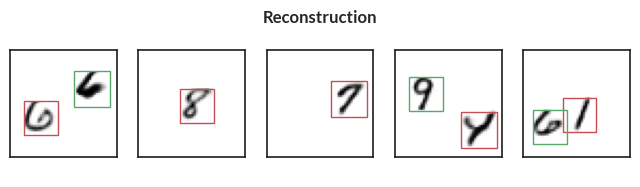

Epoch=184, total_epoch_step_time=322.44, loss=639.67
accuracy=0.9829500317573547, counts=[[19943     5     0     0]
 [    2 19838   179     1]
 [    3   825 19196     8]]


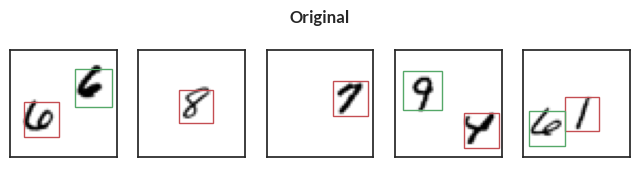

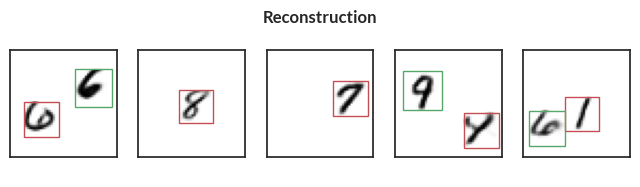

Epoch=185, total_epoch_step_time=324.15, loss=639.75
accuracy=0.9829833507537842, counts=[[19942     6     0     0]
 [    2 19840   177     1]
 [    1   825 19197     9]]


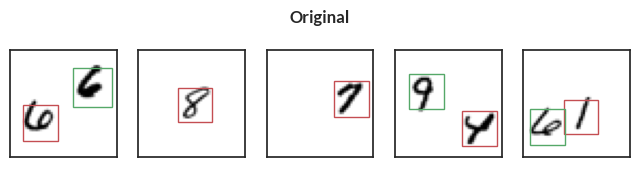

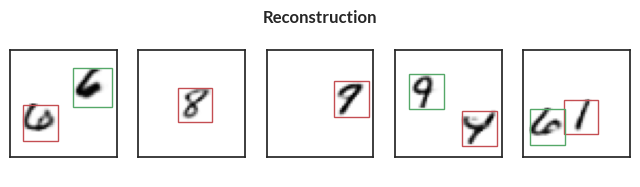

Epoch=186, total_epoch_step_time=325.85, loss=639.70
accuracy=0.9830333590507507, counts=[[19943     5     0     0]
 [    2 19843   174     1]
 [    3   824 19196     9]]


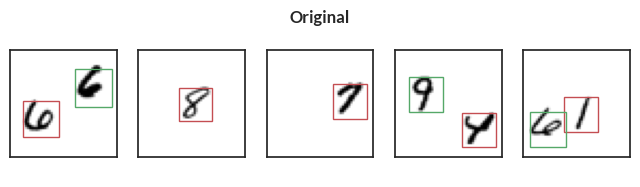

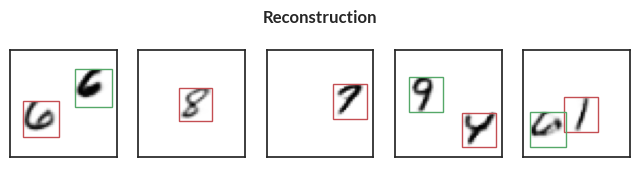

Epoch=187, total_epoch_step_time=327.55, loss=639.74
accuracy=0.9829666614532471, counts=[[19943     5     0     0]
 [    4 19839   176     1]
 [    3   824 19196     9]]


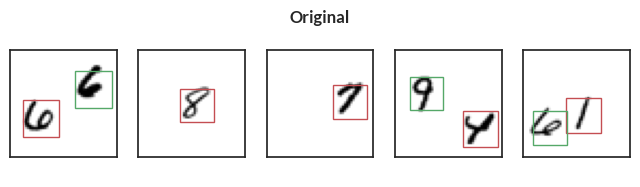

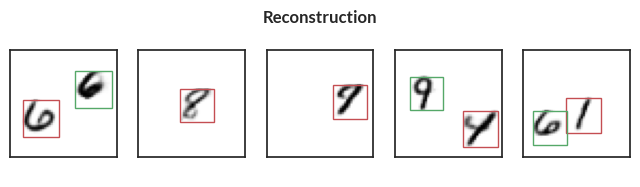

Epoch=188, total_epoch_step_time=329.25, loss=639.80
accuracy=0.9831166863441467, counts=[[19944     4     0     0]
 [    1 19839   179     1]
 [    1   818 19204     9]]


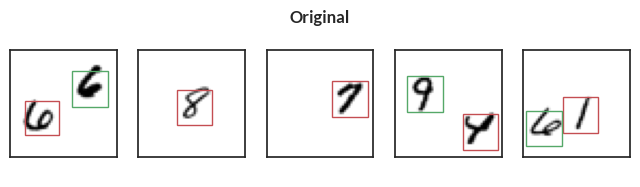

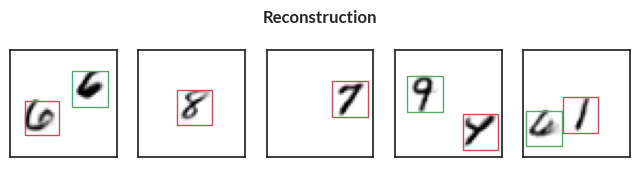

Epoch=189, total_epoch_step_time=331.00, loss=639.63
accuracy=0.9829666614532471, counts=[[19942     6     0     0]
 [    2 19840   177     1]
 [    3   823 19196    10]]


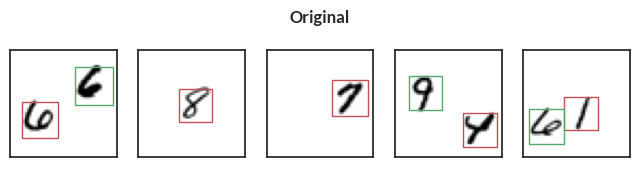

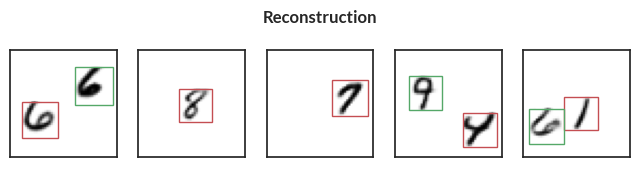

Epoch=190, total_epoch_step_time=332.76, loss=639.80
accuracy=0.9829333424568176, counts=[[19941     7     0     0]
 [    2 19837   180     1]
 [    1   825 19198     8]]


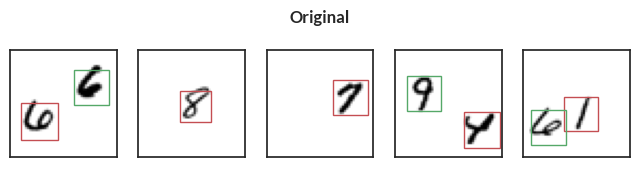

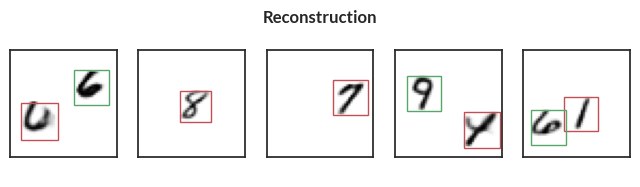

Epoch=191, total_epoch_step_time=334.53, loss=639.71
accuracy=0.9829666614532471, counts=[[19939     9     0     0]
 [    2 19844   173     1]
 [    3   828 19195     6]]


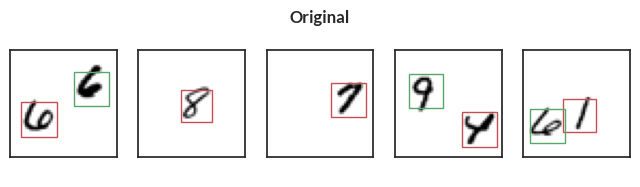

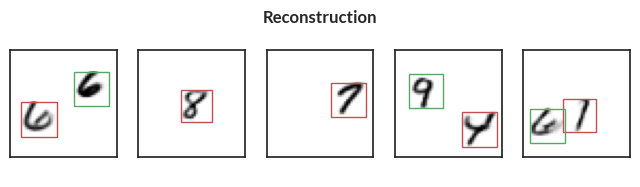

Epoch=192, total_epoch_step_time=336.30, loss=639.79
accuracy=0.9831166863441467, counts=[[19945     3     0     0]
 [    2 19843   174     1]
 [    1   825 19199     7]]


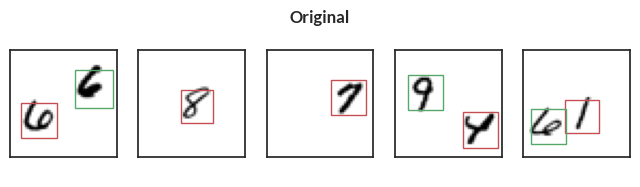

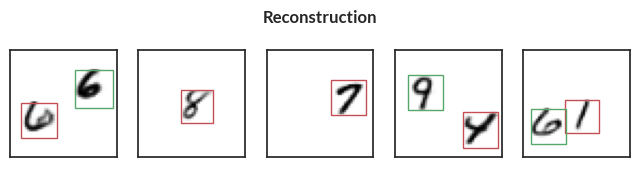

Epoch=193, total_epoch_step_time=338.01, loss=639.65
accuracy=0.9829666614532471, counts=[[19942     6     0     0]
 [    2 19847   170     1]
 [    0   834 19189     9]]


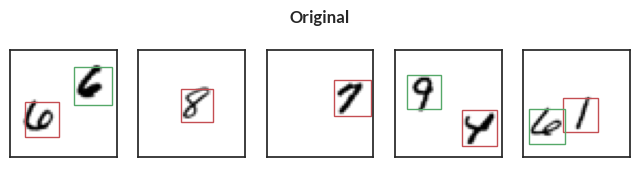

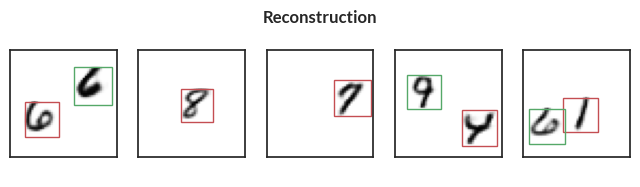

Epoch=194, total_epoch_step_time=339.78, loss=639.84
accuracy=0.9830333590507507, counts=[[19944     4     0     0]
 [    2 19844   173     1]
 [    3   828 19194     7]]


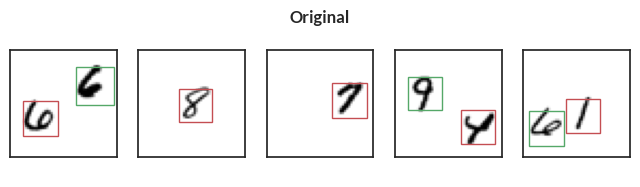

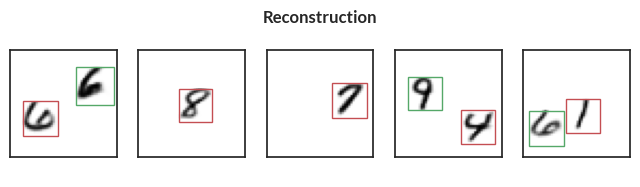

Epoch=195, total_epoch_step_time=341.47, loss=639.68
accuracy=0.9829166531562805, counts=[[19937    11     0     0]
 [    0 19842   177     1]
 [    1   826 19196     9]]


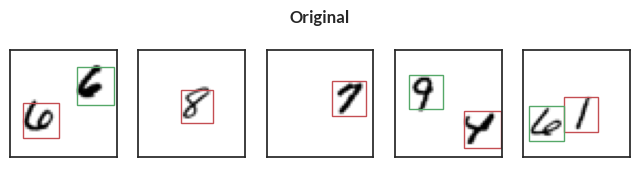

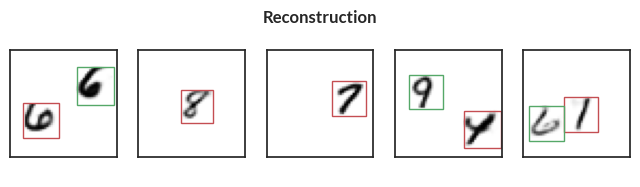

Epoch=196, total_epoch_step_time=343.21, loss=639.85
accuracy=0.9830000400543213, counts=[[19946     2     0     0]
 [    1 19841   177     1]
 [    1   829 19193     9]]


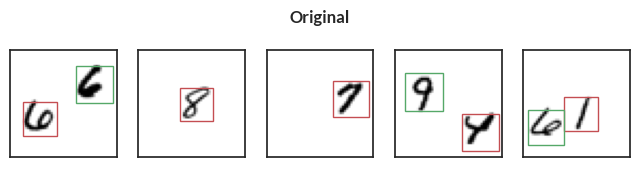

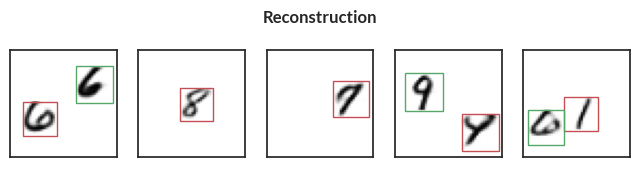

Epoch=197, total_epoch_step_time=344.93, loss=639.82
accuracy=0.9830499887466431, counts=[[19941     7     0     0]
 [    4 19845   170     1]
 [    2   826 19197     7]]


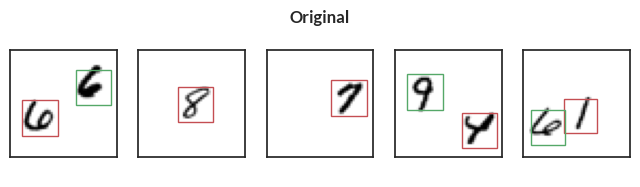

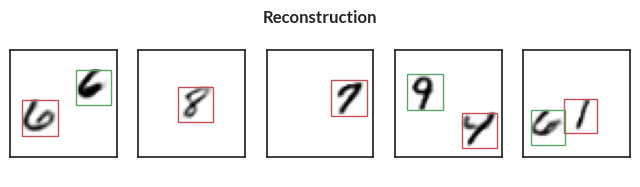

Epoch=198, total_epoch_step_time=346.65, loss=639.91
accuracy=0.9829333424568176, counts=[[19943     5     0     0]
 [    2 19841   176     1]
 [    3   827 19192    10]]


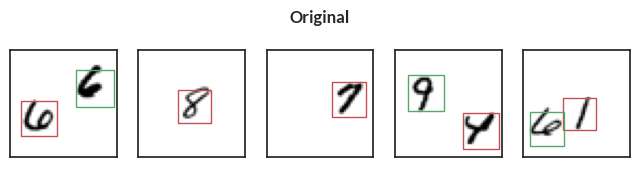

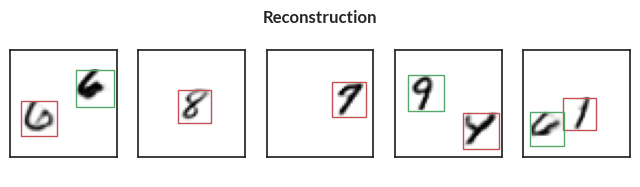

Epoch=199, total_epoch_step_time=348.36, loss=639.96
accuracy=0.9828166961669922, counts=[[19939     9     0     0]
 [    4 19838   177     1]
 [    2   830 19192     8]]


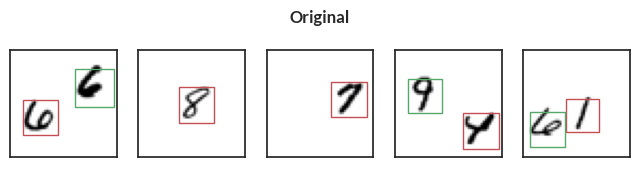

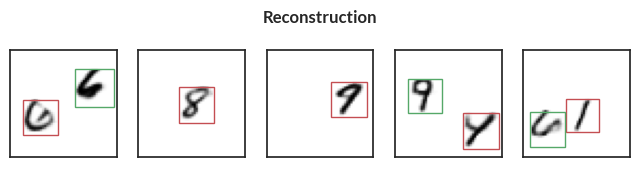

Epoch=200, total_epoch_step_time=350.08, loss=639.92
accuracy=0.9830000400543213, counts=[[19944     4     0     0]
 [    3 19844   172     1]
 [    4   827 19192     9]]


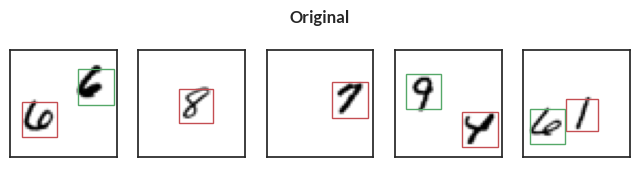

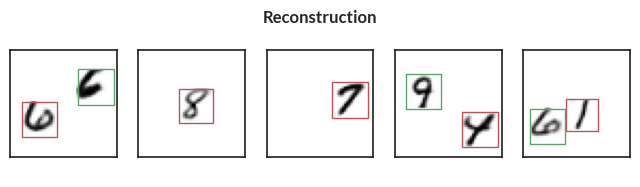

In [17]:
key, sub_key = jax.random.split(key)
losses, accuracy, wall_clock_times, params = train(
    sub_key, learning_rate=1.0e-3, n=1, batch_size=64, num_epochs=200
)

In [18]:
import pandas as pd

arr = np.array([losses, accuracy, wall_clock_times])
df = pd.DataFrame(arr.T, columns=["ELBO Loss", "Accuracy", "Epoch wall clock times"])
df.to_csv("./training_runs/grasp_air_mvd_epochs_201_mccoy_prior.csv", index=False)

Epoch=0, total_epoch_step_time=3.49, loss=463.90
accuracy=0.7926333546638489, counts=[[16591  3252   104     1]
 [  415 17532  2008    65]
 [   98  5366 13435  1133]]


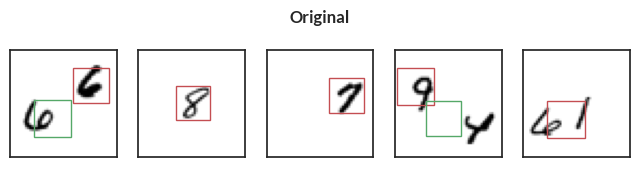

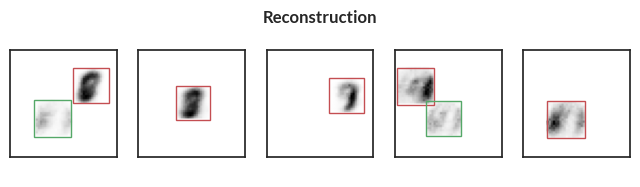

Epoch=1, total_epoch_step_time=7.12, loss=578.97
accuracy=0.9363333582878113, counts=[[19233   712     3     0]
 [   56 18593  1368     3]
 [    9  1528 18354   141]]


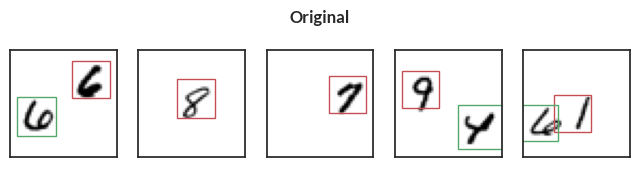

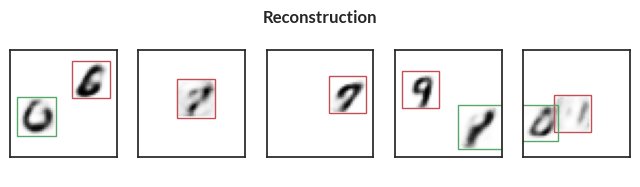

Epoch=2, total_epoch_step_time=10.62, loss=605.61
accuracy=0.9612166881561279, counts=[[19642   306     0     0]
 [   32 19576   412     0]
 [    5  1532 18455    40]]


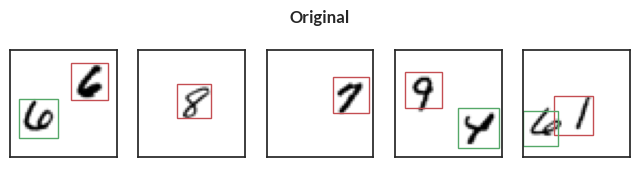

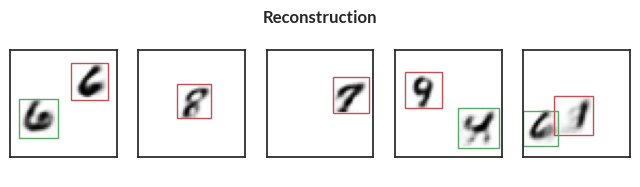

Epoch=3, total_epoch_step_time=14.28, loss=616.35
accuracy=0.9660000205039978, counts=[[19763   184     1     0]
 [   19 19761   240     0]
 [    3  1571 18436    22]]


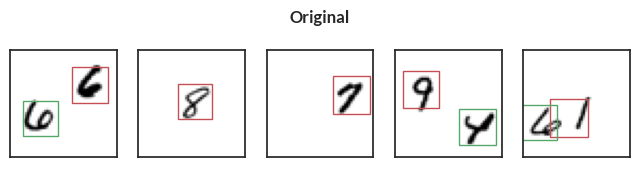

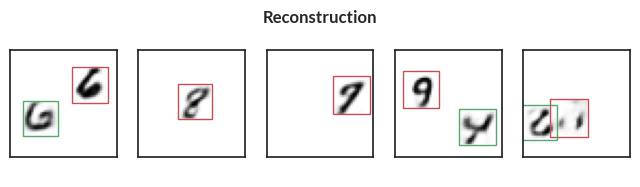

Epoch=4, total_epoch_step_time=17.83, loss=622.42
accuracy=0.972266674041748, counts=[[19792   155     1     0]
 [   15 19784   221     0]
 [    4  1244 18760    24]]


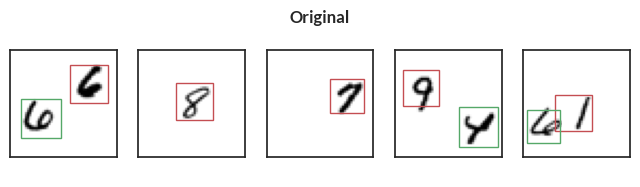

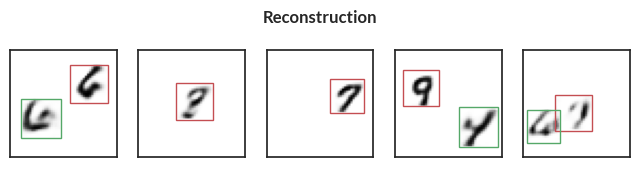

Epoch=5, total_epoch_step_time=21.32, loss=625.90
accuracy=0.9751333594322205, counts=[[19835   113     0     0]
 [   10 19774   236     0]
 [    0  1121 18899    12]]


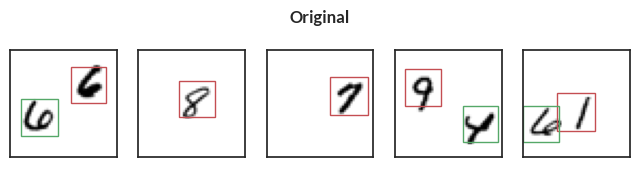

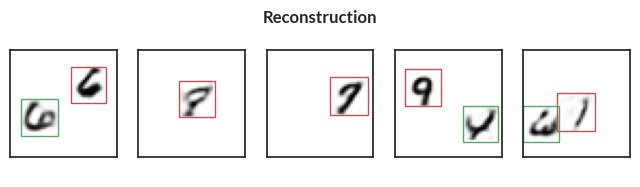

Epoch=6, total_epoch_step_time=24.79, loss=628.32
accuracy=0.9786500334739685, counts=[[19851    97     0     0]
 [    5 19774   240     1]
 [    2   926 19094    10]]


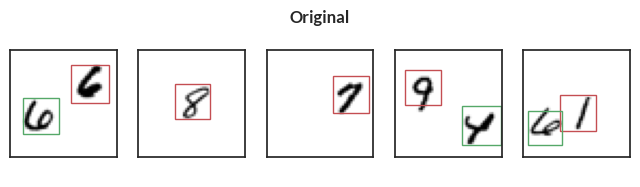

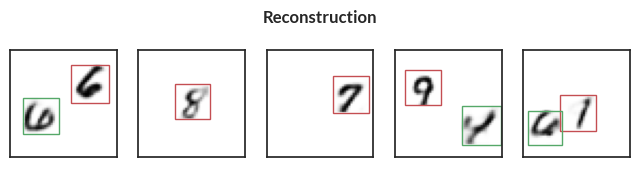

Epoch=7, total_epoch_step_time=28.38, loss=629.80
accuracy=0.9773833155632019, counts=[[19877    71     0     0]
 [    7 19888   125     0]
 [    2  1145 18878     7]]


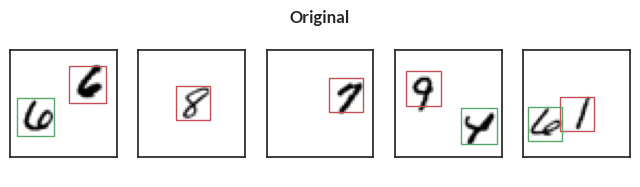

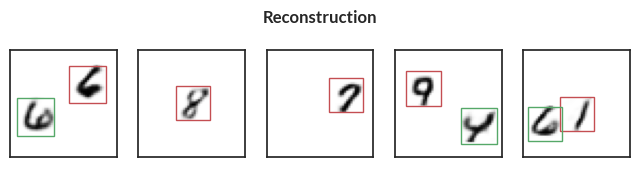

Epoch=8, total_epoch_step_time=31.96, loss=630.93
accuracy=0.9776833653450012, counts=[[19902    46     0     0]
 [    5 19889   126     0]
 [    2  1151 18870     9]]


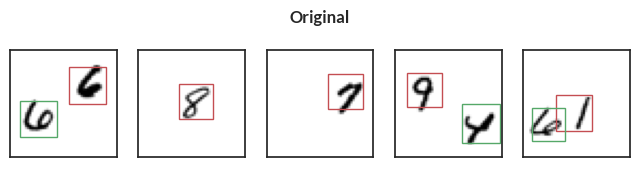

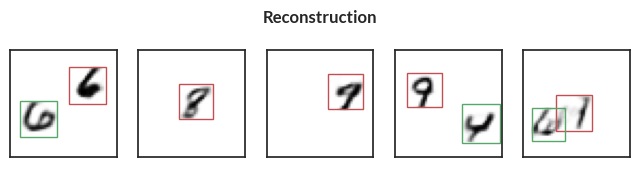

Epoch=9, total_epoch_step_time=35.42, loss=632.13
accuracy=0.9769499897956848, counts=[[19905    43     0     0]
 [    5 19917    98     0]
 [    4  1228 18795     5]]


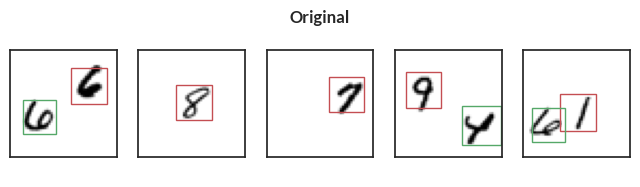

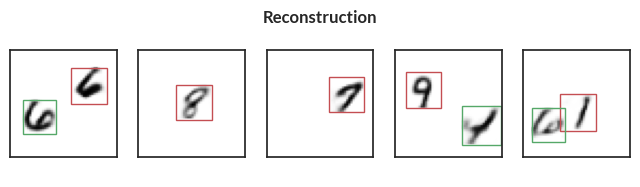

Epoch=10, total_epoch_step_time=38.85, loss=632.94
accuracy=0.9744499921798706, counts=[[19909    39     0     0]
 [    2 19940    78     0]
 [    0  1411 18618     3]]


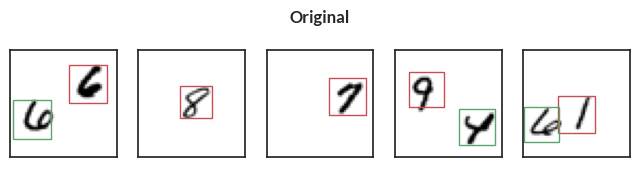

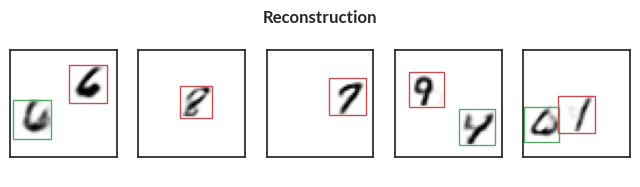

Epoch=11, total_epoch_step_time=42.56, loss=633.44
accuracy=0.980733335018158, counts=[[19914    34     0     0]
 [    1 19875   144     0]
 [    2   969 19055     6]]


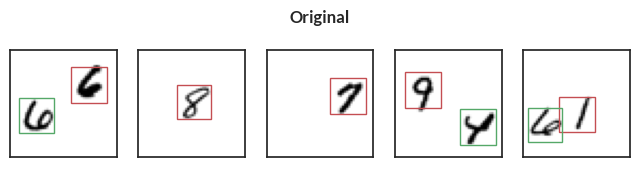

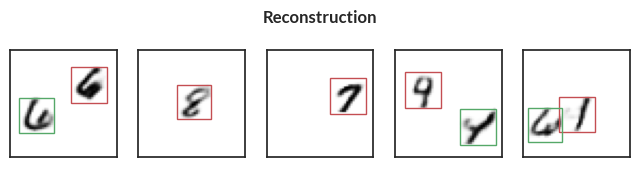

Epoch=12, total_epoch_step_time=46.48, loss=634.06
accuracy=0.9774333238601685, counts=[[19918    30     0     0]
 [    3 19948    69     0]
 [    2  1246 18780     4]]


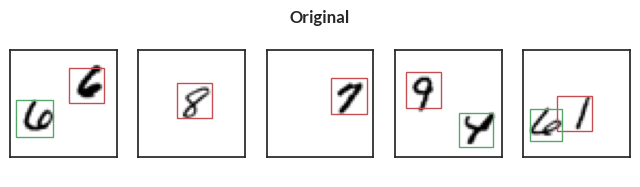

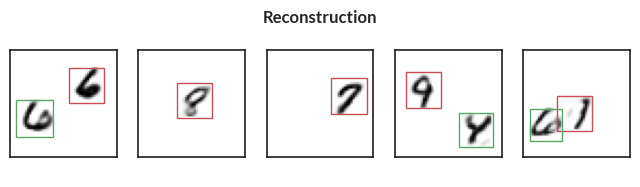

Epoch=13, total_epoch_step_time=50.05, loss=634.38
accuracy=0.9803667068481445, counts=[[19925    23     0     0]
 [    3 19908   109     0]
 [    2  1038 18989     3]]


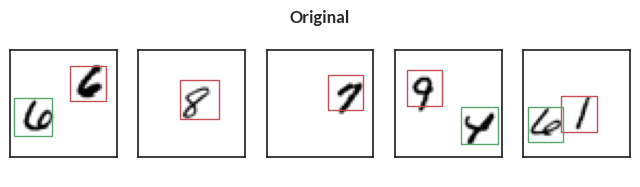

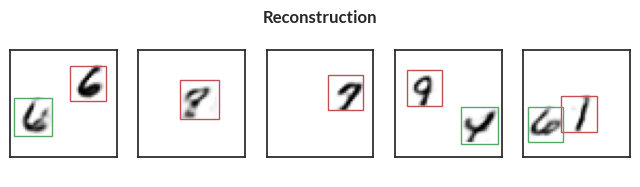

Epoch=14, total_epoch_step_time=53.56, loss=634.88
accuracy=0.9809666872024536, counts=[[19930    18     0     0]
 [    0 19929    91     0]
 [    1  1029 18999     3]]


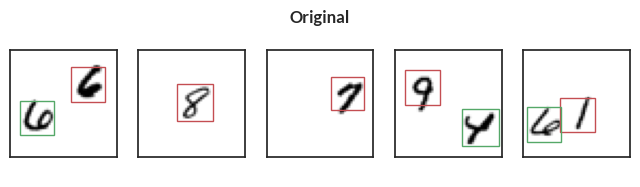

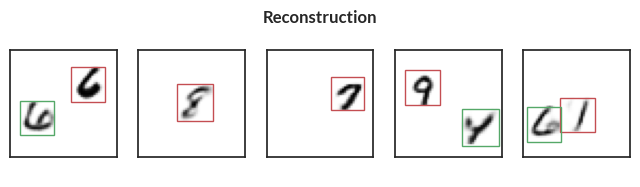

Epoch=15, total_epoch_step_time=56.97, loss=635.45
accuracy=0.9817166924476624, counts=[[19940     8     0     0]
 [    3 19927    90     0]
 [    2   992 19036     2]]


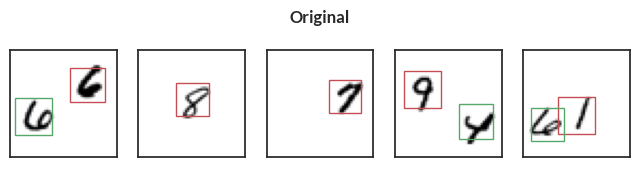

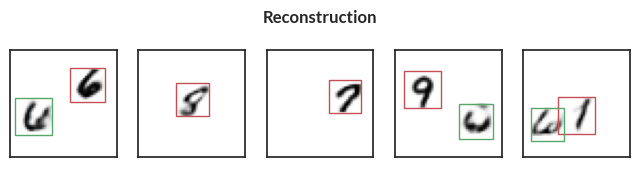

Epoch=16, total_epoch_step_time=60.64, loss=635.67
accuracy=0.9818500280380249, counts=[[19934    14     0     0]
 [    2 19906   112     0]
 [    3   954 19071     4]]


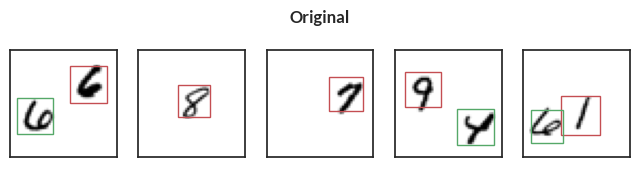

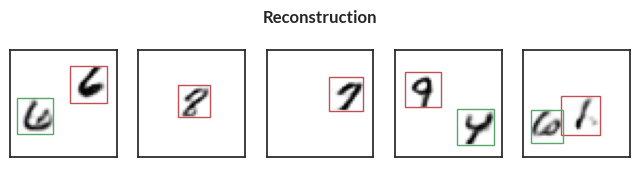

Epoch=17, total_epoch_step_time=64.26, loss=636.25
accuracy=0.9815666675567627, counts=[[19937    11     0     0]
 [    3 19926    91     0]
 [    1   999 19031     1]]


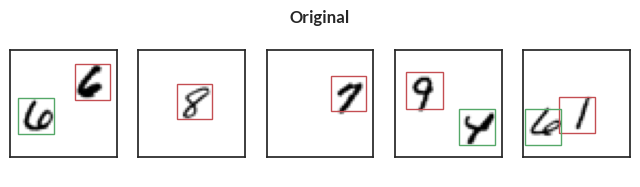

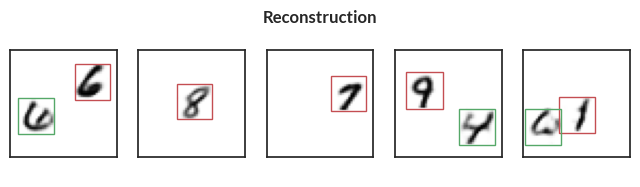

Epoch=18, total_epoch_step_time=67.79, loss=636.61
accuracy=0.9822333455085754, counts=[[19939     9     0     0]
 [    1 19905   114     0]
 [    1   935 19090     6]]


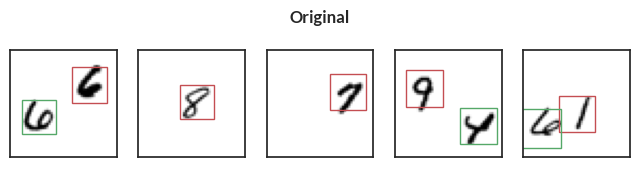

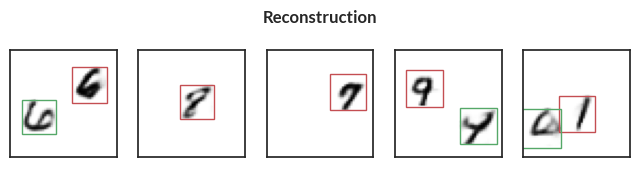

Epoch=19, total_epoch_step_time=71.26, loss=636.85
accuracy=0.9823166728019714, counts=[[19938    10     0     0]
 [    3 19900   117     0]
 [    2   926 19101     3]]


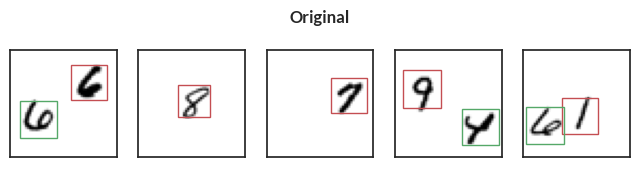

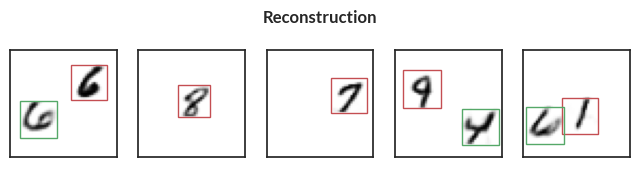

Epoch=20, total_epoch_step_time=74.79, loss=637.02
accuracy=0.9813833236694336, counts=[[19943     5     0     0]
 [    3 19927    90     0]
 [    3  1014 19013     2]]


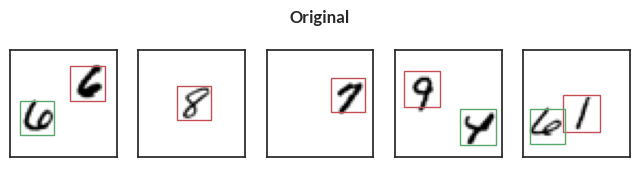

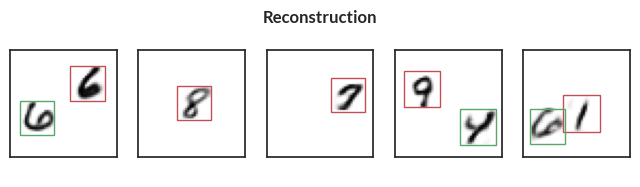

Epoch=21, total_epoch_step_time=78.16, loss=637.15
accuracy=0.9811000227928162, counts=[[19943     5     0     0]
 [    4 19937    79     0]
 [    3  1040 18986     3]]


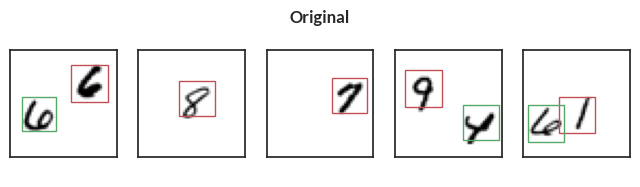

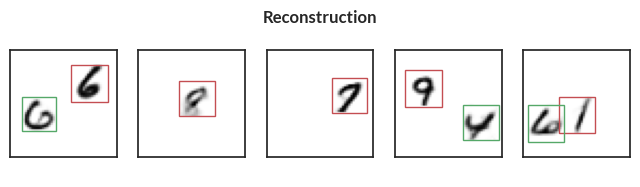

Epoch=22, total_epoch_step_time=81.54, loss=637.58
accuracy=0.982200026512146, counts=[[19941     7     0     0]
 [    2 19924    94     0]
 [    4   955 19067     6]]


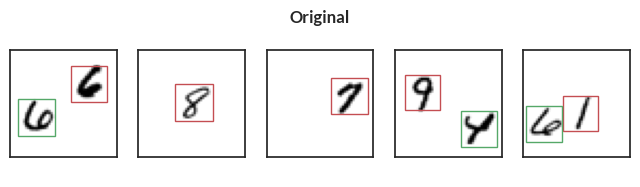

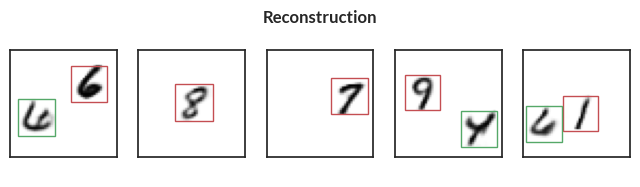

Epoch=23, total_epoch_step_time=84.94, loss=637.77
accuracy=0.9826666712760925, counts=[[19940     8     0     0]
 [    2 19922    96     0]
 [    1   931 19098     2]]


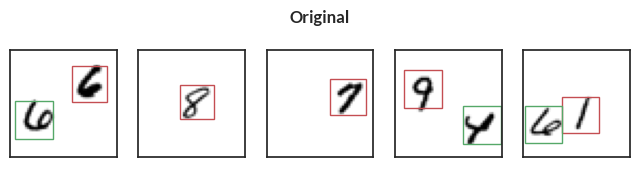

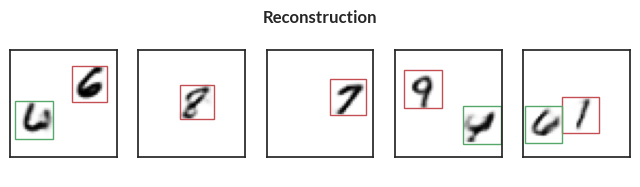

Epoch=24, total_epoch_step_time=88.49, loss=637.92
accuracy=0.9830166697502136, counts=[[19939     9     0     0]
 [    2 19932    86     0]
 [    1   918 19110     3]]


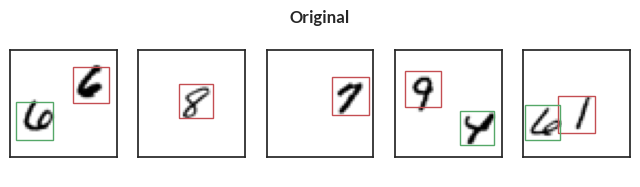

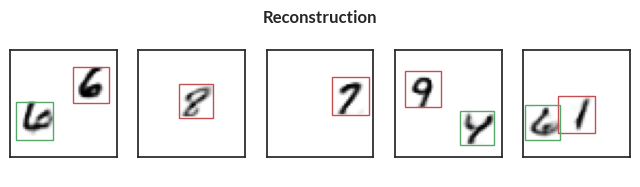

Epoch=25, total_epoch_step_time=92.04, loss=638.34
accuracy=0.982366681098938, counts=[[19941     7     0     0]
 [    5 19925    90     0]
 [    2   952 19076     2]]


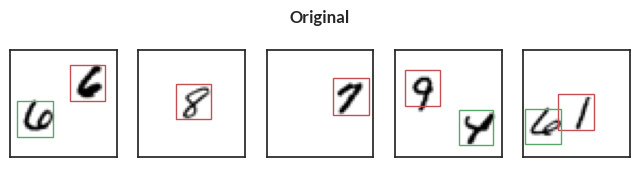

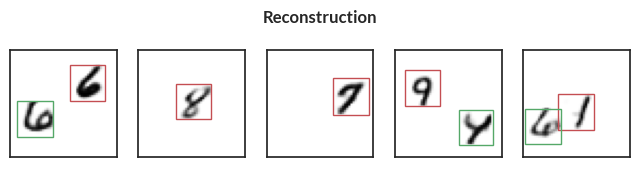

Epoch=26, total_epoch_step_time=95.61, loss=638.29
accuracy=0.9827499985694885, counts=[[19941     7     0     0]
 [    2 19919    99     0]
 [    0   923 19105     4]]


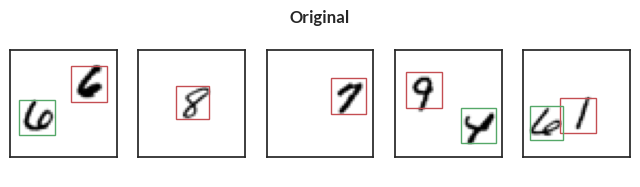

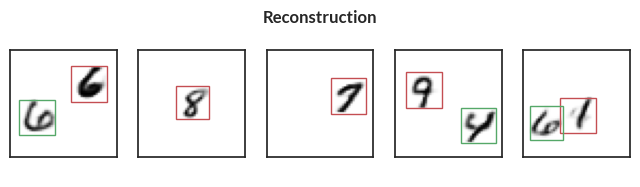

Epoch=27, total_epoch_step_time=99.50, loss=638.52
accuracy=0.9828333258628845, counts=[[19939     9     0     0]
 [    1 19927    92     0]
 [    1   922 19104     5]]


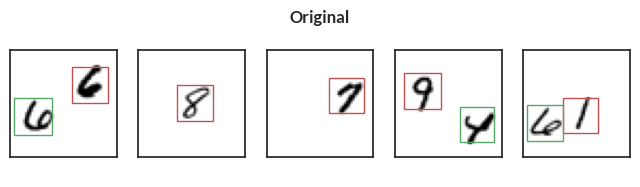

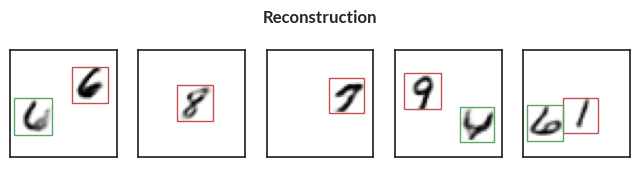

Epoch=28, total_epoch_step_time=103.52, loss=638.52
accuracy=0.9820666909217834, counts=[[19946     2     0     0]
 [    3 19928    89     0]
 [    0   980 19050     2]]


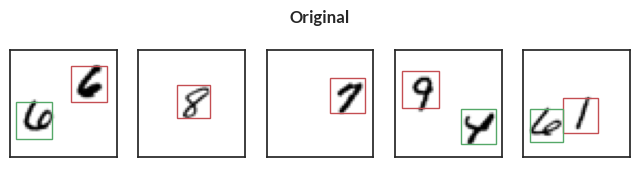

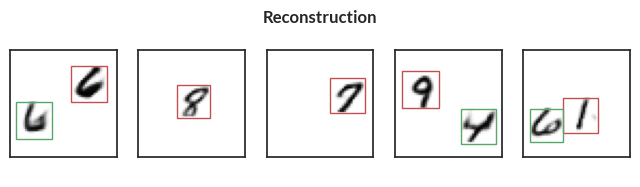

Epoch=29, total_epoch_step_time=107.16, loss=638.78
accuracy=0.9807500243186951, counts=[[19946     2     0     0]
 [    3 19945    72     0]
 [    1  1076 18954     1]]


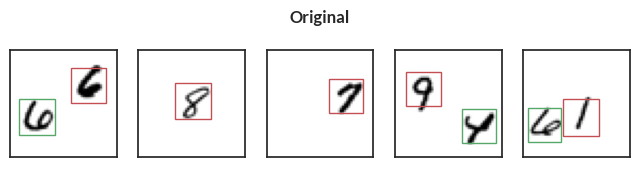

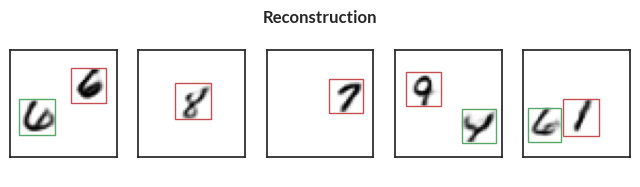

Epoch=30, total_epoch_step_time=110.68, loss=639.12
accuracy=0.9820666909217834, counts=[[19940     8     0     0]
 [    1 19937    82     0]
 [    1   983 19047     1]]


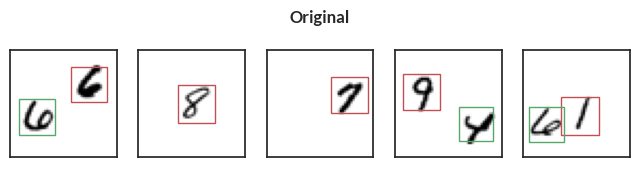

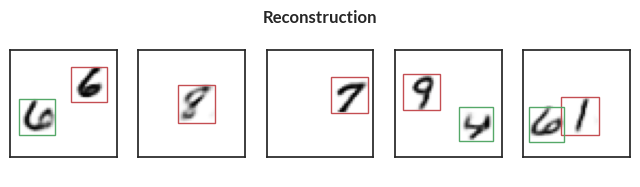

Epoch=31, total_epoch_step_time=114.03, loss=639.17
accuracy=0.9825500249862671, counts=[[19940     8     0     0]
 [    0 19937    83     0]
 [    4   951 19076     1]]


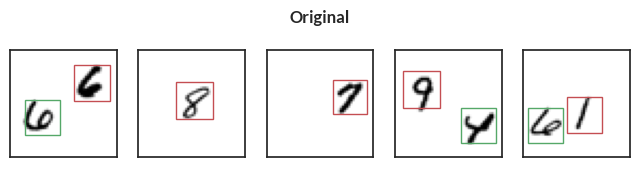

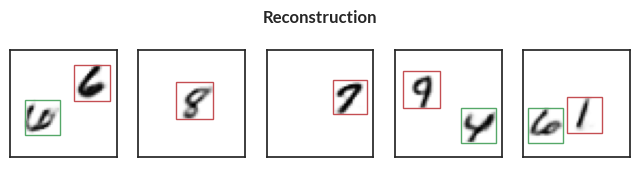

Epoch=32, total_epoch_step_time=117.46, loss=639.28
accuracy=0.9829833507537842, counts=[[19944     4     0     0]
 [    0 19940    80     0]
 [    1   932 19095     4]]


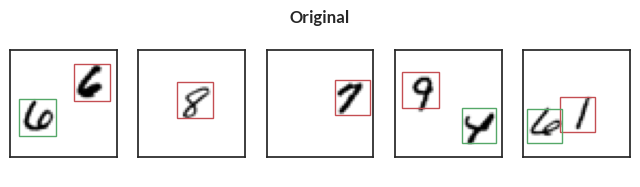

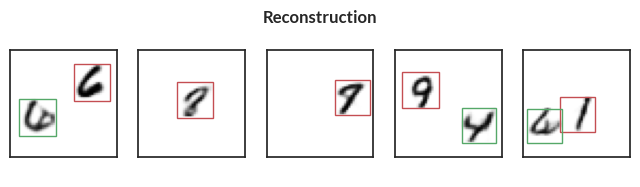

Epoch=33, total_epoch_step_time=120.97, loss=639.47
accuracy=0.9822166562080383, counts=[[19943     5     0     0]
 [    5 19933    82     0]
 [    1   970 19057     4]]


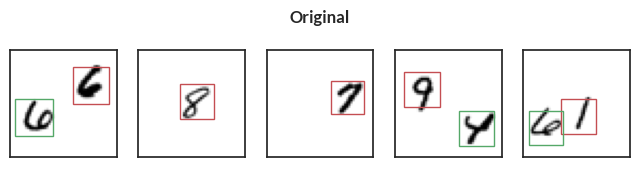

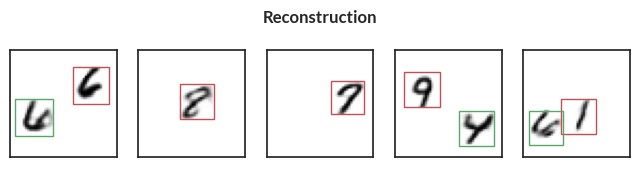

Epoch=34, total_epoch_step_time=124.31, loss=639.51
accuracy=0.9830999970436096, counts=[[19944     4     0     0]
 [    2 19927    91     0]
 [    2   914 19115     1]]


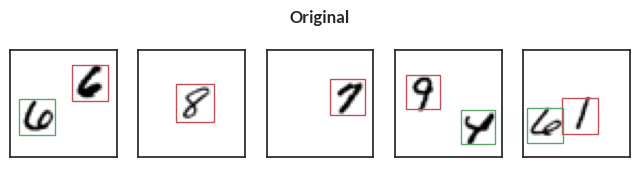

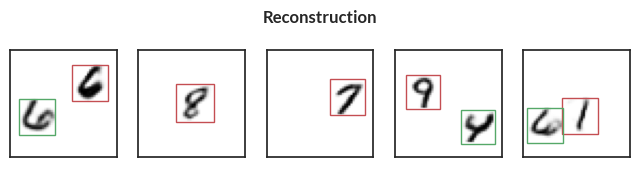

Epoch=35, total_epoch_step_time=127.81, loss=639.49
accuracy=0.9829500317573547, counts=[[19939     9     0     0]
 [    2 19930    88     0]
 [    3   916 19108     5]]


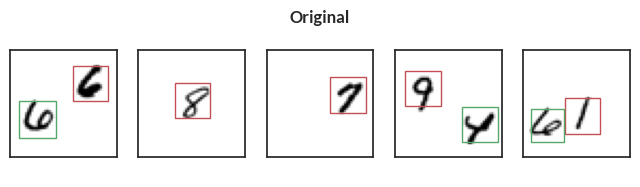

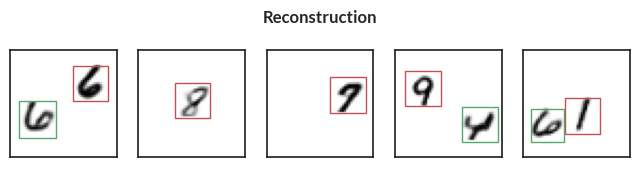

Epoch=36, total_epoch_step_time=131.20, loss=639.78
accuracy=0.9830000400543213, counts=[[19946     2     0     0]
 [    4 19937    79     0]
 [    1   933 19097     1]]


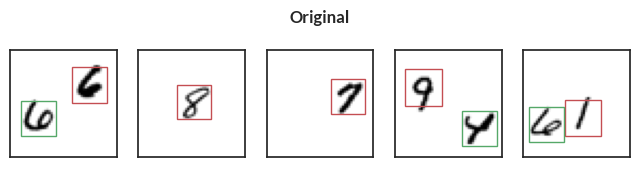

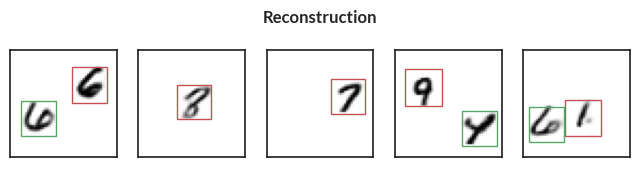

Epoch=37, total_epoch_step_time=134.66, loss=639.97
accuracy=0.982450008392334, counts=[[19943     5     0     0]
 [    1 19948    71     0]
 [    3   970 19056     3]]


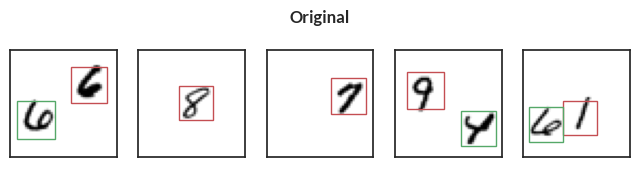

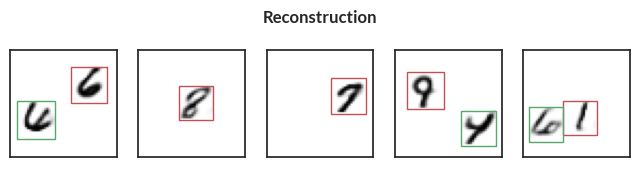

Epoch=38, total_epoch_step_time=138.26, loss=639.84
accuracy=0.9828500151634216, counts=[[19941     7     0     0]
 [    3 19932    85     0]
 [    2   928 19098     4]]


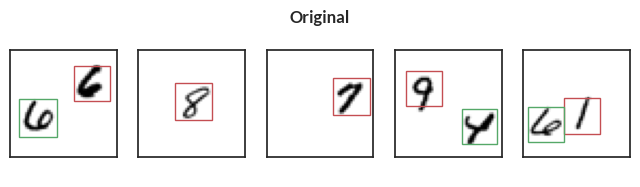

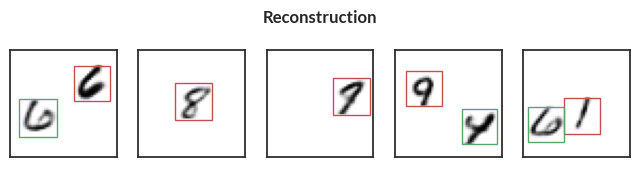

Epoch=39, total_epoch_step_time=141.78, loss=640.12
accuracy=0.9831666946411133, counts=[[19946     2     0     0]
 [    4 19928    88     0]
 [    2   911 19116     3]]


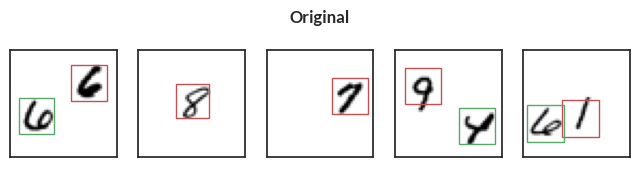

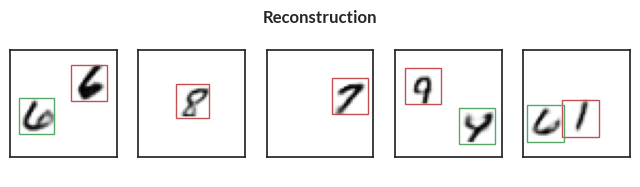

Epoch=40, total_epoch_step_time=145.28, loss=640.27
accuracy=0.9828166961669922, counts=[[19945     3     0     0]
 [    2 19932    86     0]
 [    2   936 19092     2]]


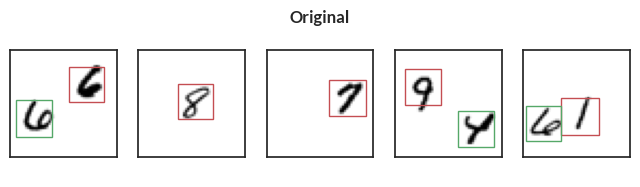

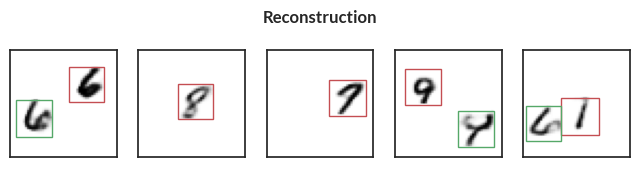

Epoch=41, total_epoch_step_time=148.90, loss=640.30
accuracy=0.9828000068664551, counts=[[19942     6     0     0]
 [    0 19940    80     0]
 [    1   942 19086     3]]


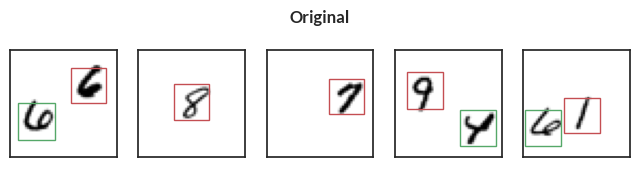

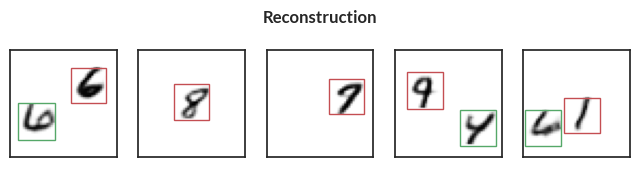

Epoch=42, total_epoch_step_time=152.36, loss=640.41
accuracy=0.9823833703994751, counts=[[19943     5     0     0]
 [    1 19929    90     0]
 [    1   959 19071     1]]


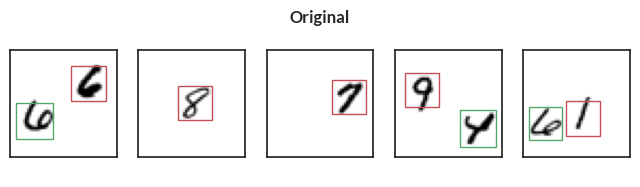

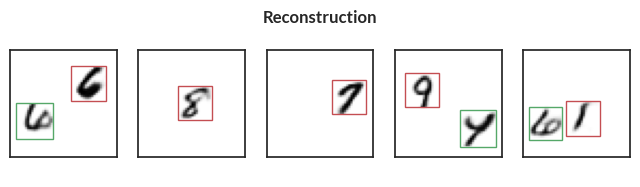

Epoch=43, total_epoch_step_time=155.84, loss=640.57
accuracy=0.9830333590507507, counts=[[19943     5     0     0]
 [    2 19938    80     0]
 [    1   928 19101     2]]


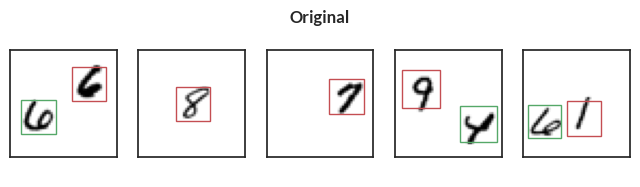

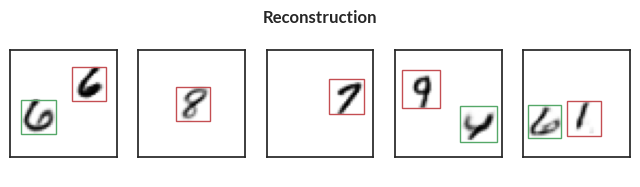

Epoch=44, total_epoch_step_time=159.16, loss=640.62
accuracy=0.9832000136375427, counts=[[19944     4     0     0]
 [    0 19945    75     0]
 [    2   926 19103     1]]


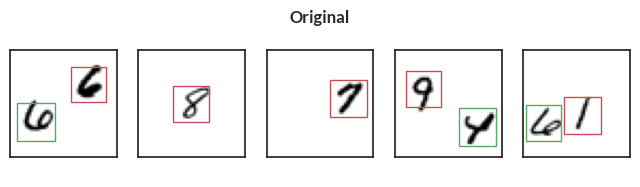

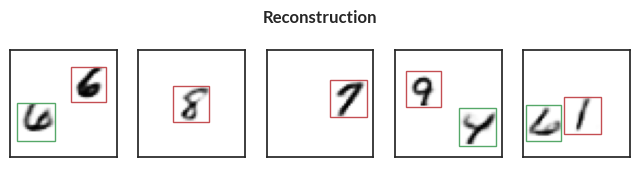

Epoch=45, total_epoch_step_time=162.49, loss=640.59
accuracy=0.9822999835014343, counts=[[19940     8     0     0]
 [    0 19944    76     0]
 [    5   971 19054     2]]


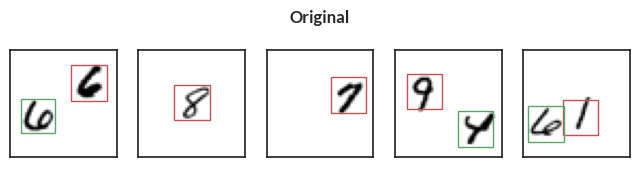

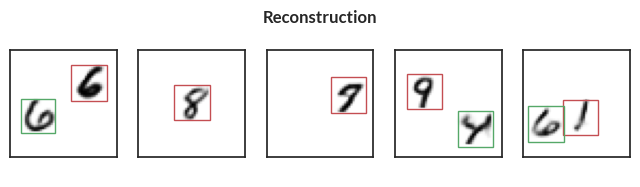

Epoch=46, total_epoch_step_time=165.94, loss=640.89
accuracy=0.9833333492279053, counts=[[19942     6     0     0]
 [    3 19935    82     0]
 [    1   906 19123     2]]


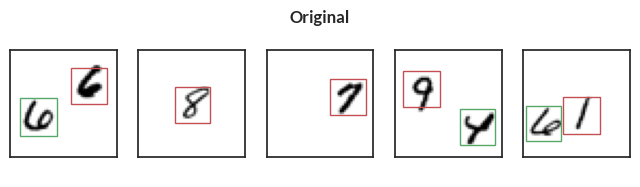

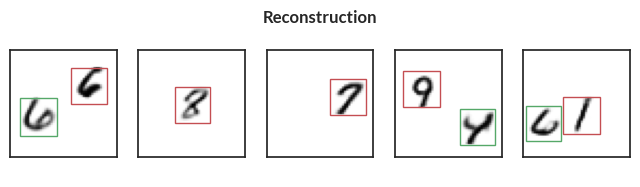

Epoch=47, total_epoch_step_time=169.36, loss=640.94
accuracy=0.982699990272522, counts=[[19941     7     0     0]
 [    1 19939    80     0]
 [    3   944 19082     3]]


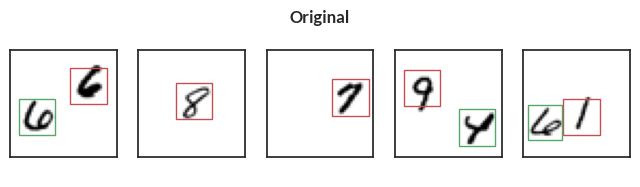

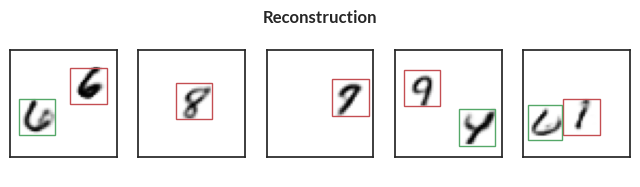

Epoch=48, total_epoch_step_time=172.91, loss=641.06
accuracy=0.9830499887466431, counts=[[19943     5     0     0]
 [    4 19932    84     0]
 [    1   920 19108     3]]


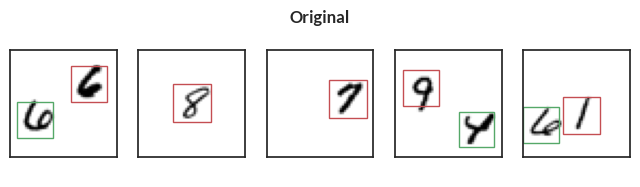

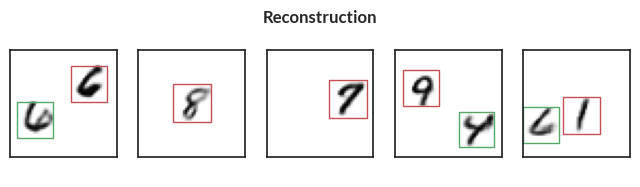

Epoch=49, total_epoch_step_time=176.41, loss=641.00
accuracy=0.9831666946411133, counts=[[19946     2     0     0]
 [    4 19932    84     0]
 [    2   916 19112     2]]


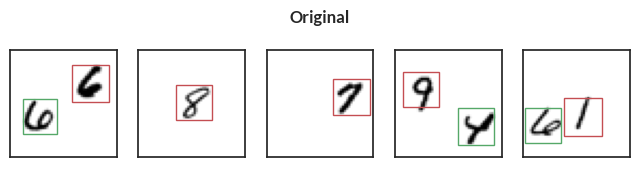

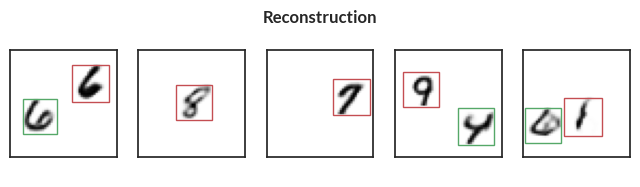

Epoch=50, total_epoch_step_time=179.90, loss=641.33
accuracy=0.9830333590507507, counts=[[19940     8     0     0]
 [    2 19937    81     0]
 [    0   925 19105     2]]


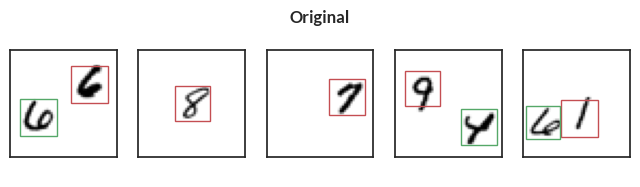

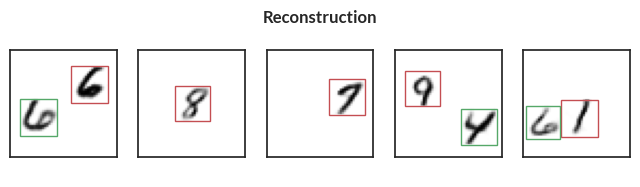

Epoch=51, total_epoch_step_time=183.32, loss=641.23
accuracy=0.9832500219345093, counts=[[19945     3     0     0]
 [    1 19945    74     0]
 [    4   917 19105     6]]


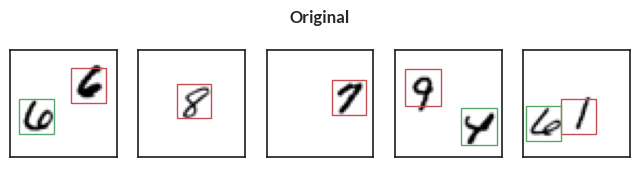

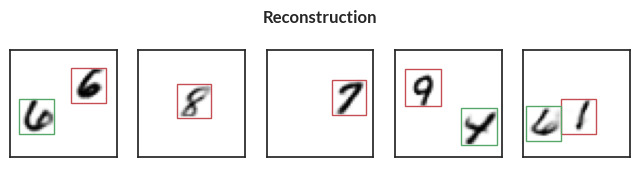

Epoch=52, total_epoch_step_time=187.00, loss=641.18
accuracy=0.9825666546821594, counts=[[19937    11     0     0]
 [    1 19940    79     0]
 [    1   951 19077     3]]


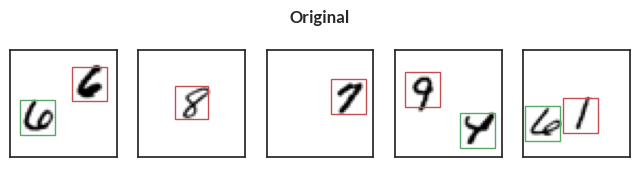

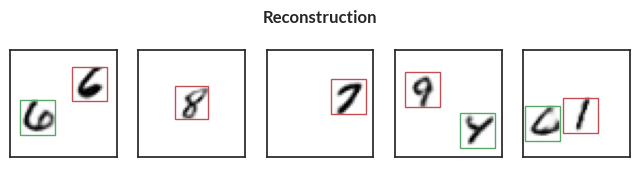

Epoch=53, total_epoch_step_time=190.44, loss=641.35
accuracy=0.9829333424568176, counts=[[19946     2     0     0]
 [    4 19938    78     0]
 [    2   935 19092     3]]


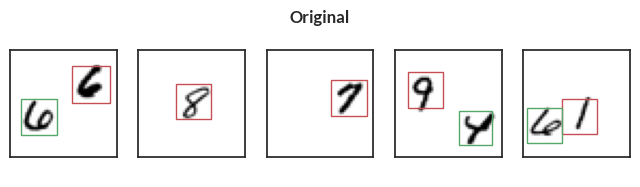

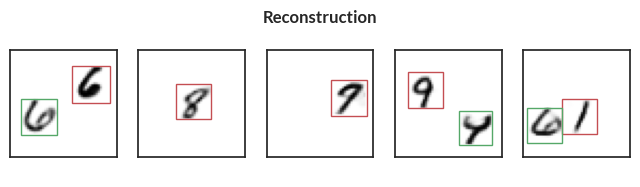

Epoch=54, total_epoch_step_time=193.89, loss=641.43
accuracy=0.9829000234603882, counts=[[19944     4     0     0]
 [    2 19941    77     0]
 [    2   938 19089     3]]


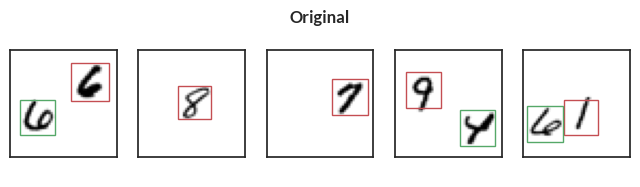

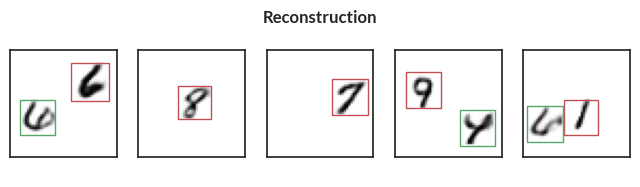

Epoch=55, total_epoch_step_time=197.35, loss=641.41
accuracy=0.9825500249862671, counts=[[19938    10     0     0]
 [    2 19940    78     0]
 [    1   950 19075     6]]


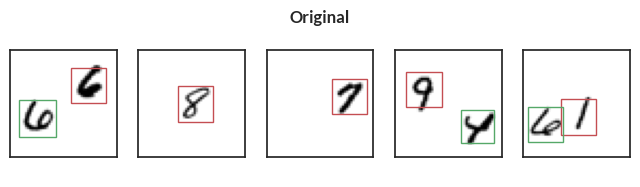

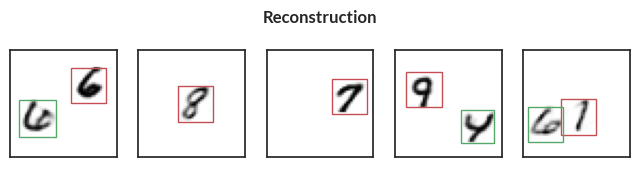

Epoch=56, total_epoch_step_time=200.97, loss=641.66
accuracy=0.9830333590507507, counts=[[19945     3     0     0]
 [    5 19935    80     0]
 [    3   925 19102     2]]


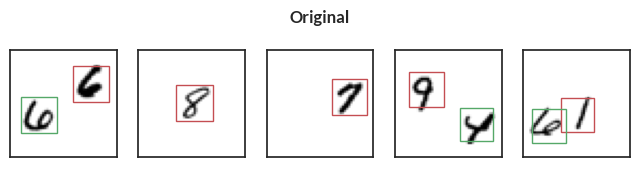

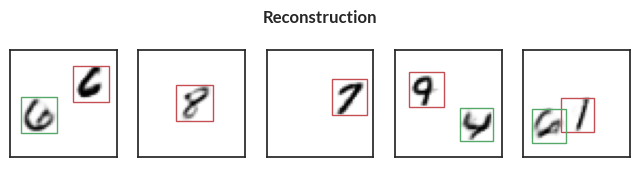

Epoch=57, total_epoch_step_time=204.50, loss=641.69
accuracy=0.9832500219345093, counts=[[19942     6     0     0]
 [    3 19938    79     0]
 [    1   912 19115     4]]


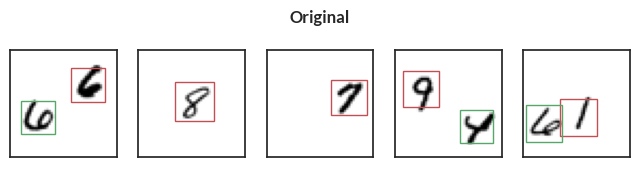

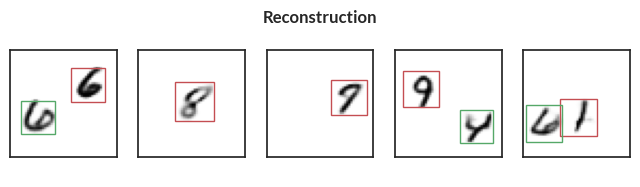

Epoch=58, total_epoch_step_time=208.01, loss=641.74
accuracy=0.9830333590507507, counts=[[19936    12     0     0]
 [    1 19942    77     0]
 [    0   927 19104     1]]


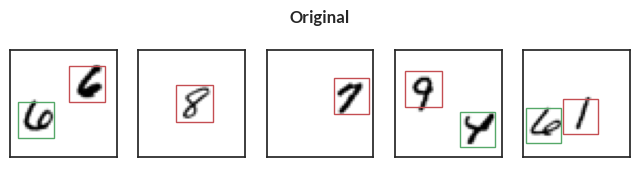

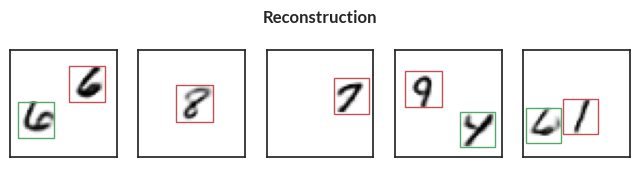

Epoch=59, total_epoch_step_time=211.51, loss=641.77
accuracy=0.9829666614532471, counts=[[19945     3     0     0]
 [    2 19941    77     0]
 [    1   937 19092     2]]


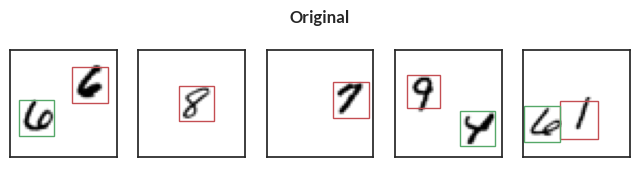

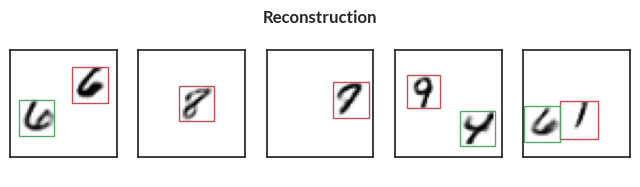

Epoch=60, total_epoch_step_time=214.97, loss=641.87
accuracy=0.9833833575248718, counts=[[19944     4     0     0]
 [    1 19941    78     0]
 [    5   905 19118     4]]


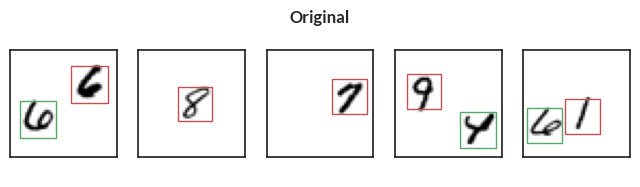

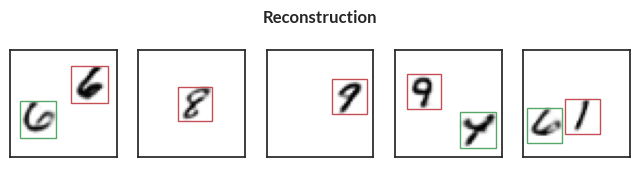

Epoch=61, total_epoch_step_time=218.44, loss=641.93
accuracy=0.9833666682243347, counts=[[19942     6     0     0]
 [    0 19945    75     0]
 [    2   912 19115     3]]


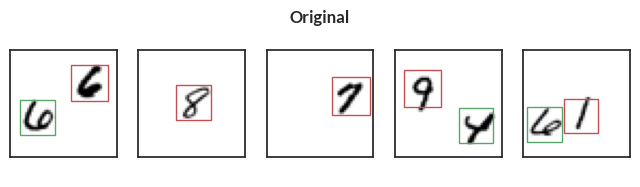

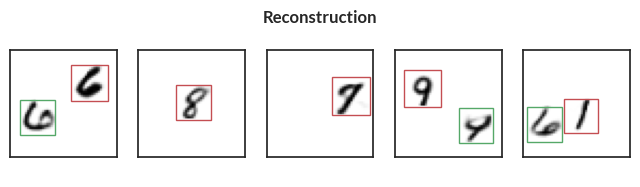

Epoch=62, total_epoch_step_time=222.00, loss=642.02
accuracy=0.9829833507537842, counts=[[19945     3     0     0]
 [    5 19939    76     0]
 [    3   931 19095     3]]


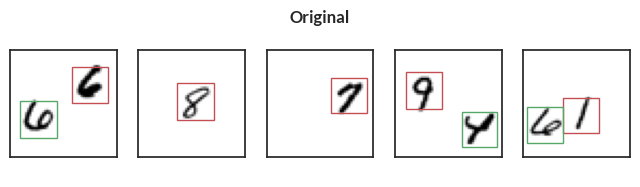

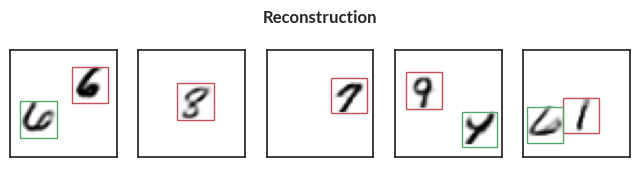

Epoch=63, total_epoch_step_time=225.35, loss=642.03
accuracy=0.9832333326339722, counts=[[19946     2     0     0]
 [    1 19943    76     0]
 [    5   920 19105     2]]


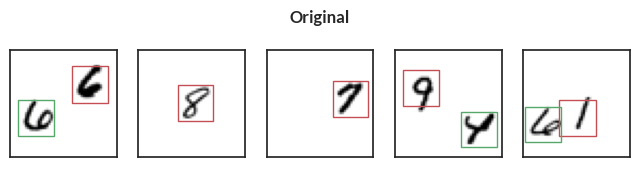

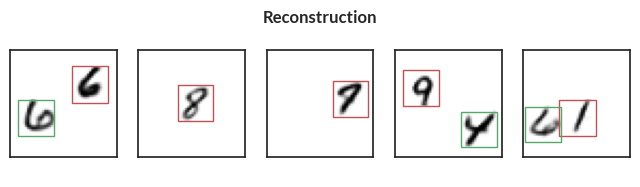

Epoch=64, total_epoch_step_time=228.68, loss=642.05
accuracy=0.9833333492279053, counts=[[19946     2     0     0]
 [    2 19946    72     0]
 [    2   918 19108     4]]


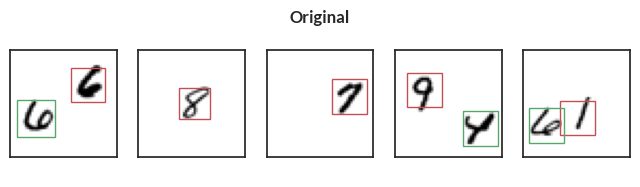

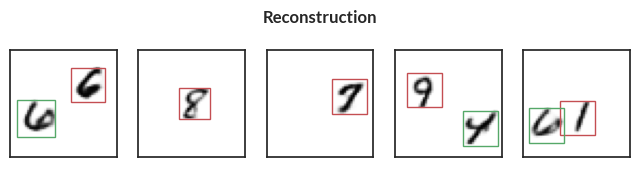

Epoch=65, total_epoch_step_time=232.02, loss=642.17
accuracy=0.9826666712760925, counts=[[19943     5     0     0]
 [    2 19947    71     0]
 [    1   959 19070     2]]


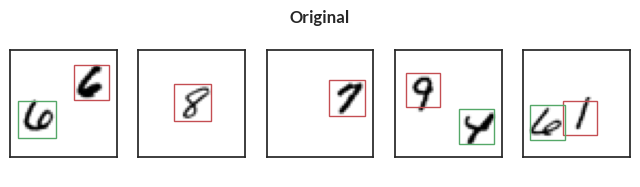

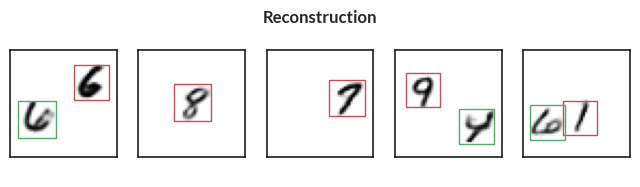

Epoch=66, total_epoch_step_time=235.68, loss=642.21
accuracy=0.9829166531562805, counts=[[19938    10     0     0]
 [    4 19946    70     0]
 [    1   939 19091     1]]


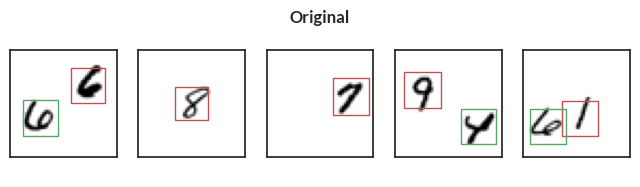

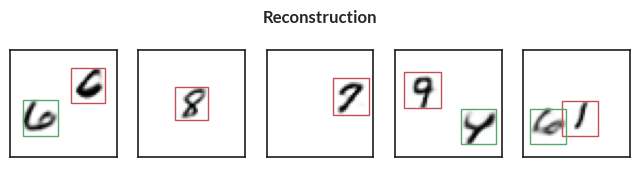

Epoch=67, total_epoch_step_time=239.10, loss=642.33
accuracy=0.9829833507537842, counts=[[19945     3     0     0]
 [    0 19950    70     0]
 [    3   941 19084     4]]


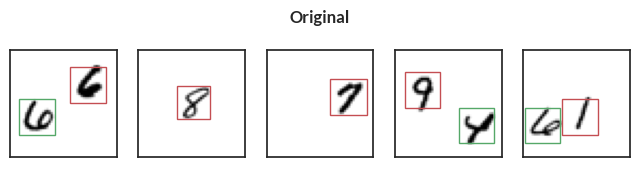

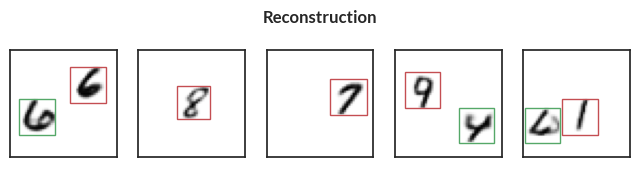

Epoch=68, total_epoch_step_time=242.50, loss=642.24
accuracy=0.9832833409309387, counts=[[19941     7     0     0]
 [    3 19941    76     0]
 [    2   912 19115     3]]


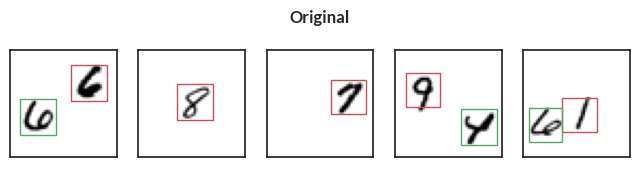

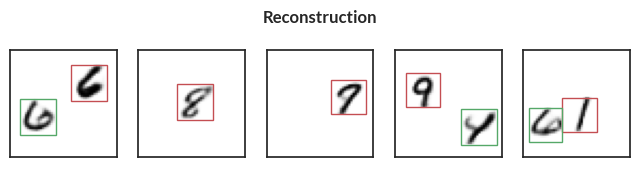

Epoch=69, total_epoch_step_time=246.10, loss=642.35
accuracy=0.9829000234603882, counts=[[19942     6     0     0]
 [    0 19949    71     0]
 [    2   943 19083     4]]


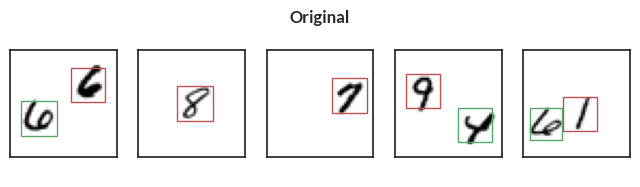

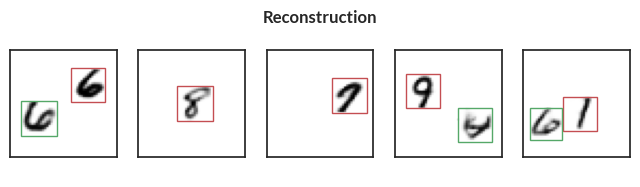

Epoch=70, total_epoch_step_time=249.52, loss=642.46
accuracy=0.9833333492279053, counts=[[19941     7     0     0]
 [    2 19942    76     0]
 [    1   909 19117     5]]


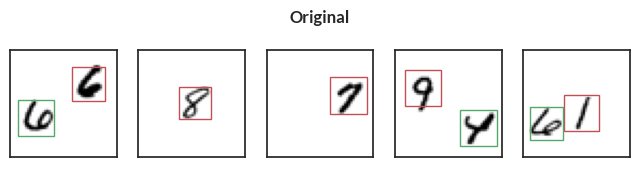

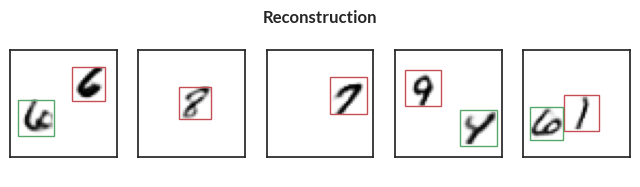

Epoch=71, total_epoch_step_time=252.84, loss=642.53
accuracy=0.9831666946411133, counts=[[19937    11     0     0]
 [    4 19947    69     0]
 [    1   921 19106     4]]


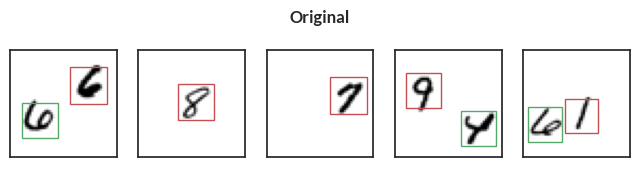

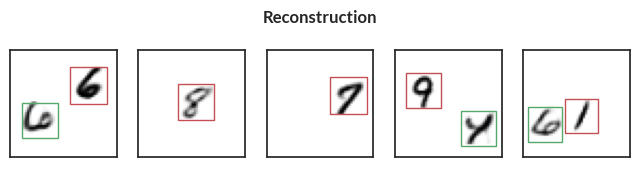

Epoch=72, total_epoch_step_time=256.27, loss=642.62
accuracy=0.9830999970436096, counts=[[19941     7     0     0]
 [    4 19943    73     0]
 [    4   924 19102     2]]


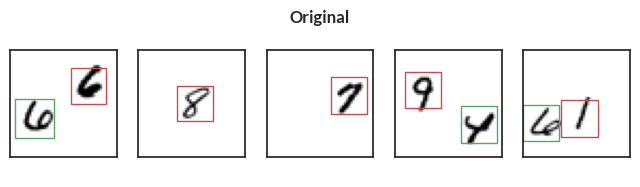

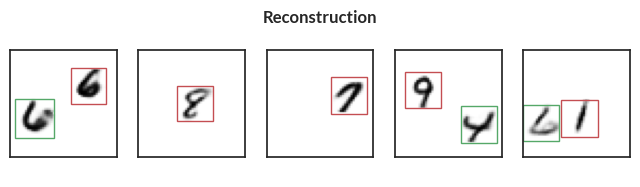

Epoch=73, total_epoch_step_time=259.72, loss=642.63
accuracy=0.9834333658218384, counts=[[19943     5     0     0]
 [    2 19946    72     0]
 [    1   913 19117     1]]


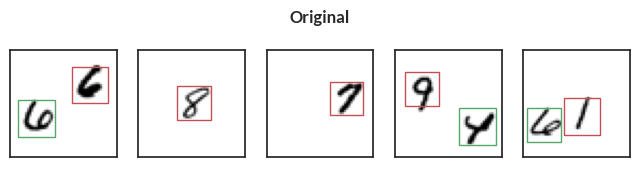

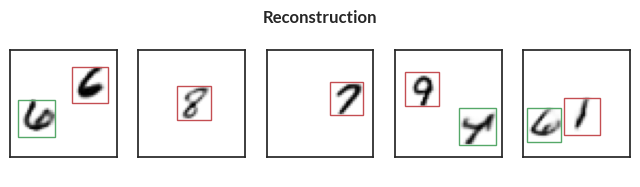

Epoch=74, total_epoch_step_time=263.27, loss=642.69
accuracy=0.9833000302314758, counts=[[19940     8     0     0]
 [    2 19947    71     0]
 [    0   919 19111     2]]


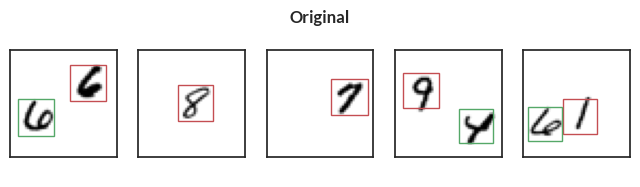

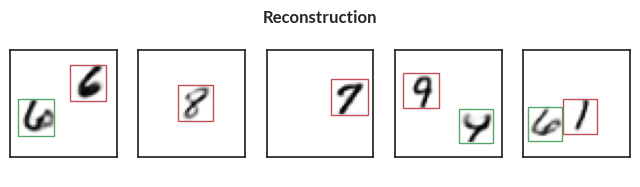

Epoch=75, total_epoch_step_time=266.76, loss=642.72
accuracy=0.9834166765213013, counts=[[19938    10     0     0]
 [    1 19948    71     0]
 [    3   908 19119     2]]


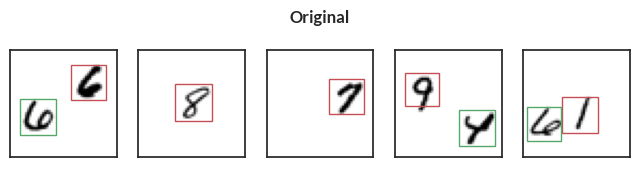

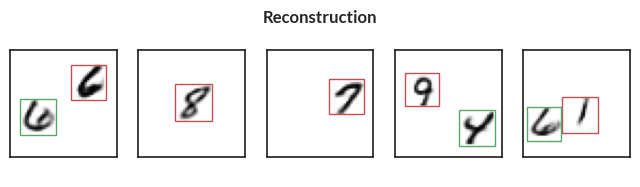

Epoch=76, total_epoch_step_time=270.17, loss=642.83
accuracy=0.9834833145141602, counts=[[19936    12     0     0]
 [    2 19944    74     0]
 [    1   900 19129     2]]


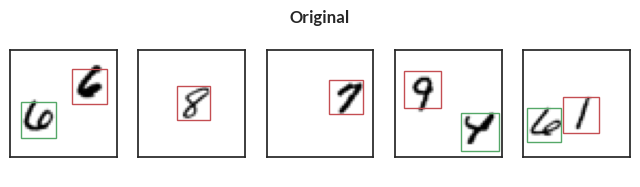

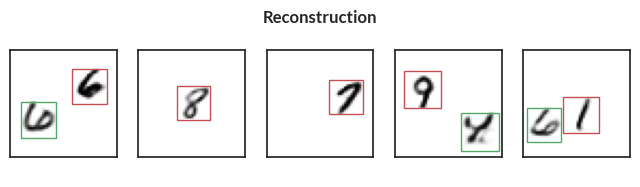

Epoch=77, total_epoch_step_time=273.54, loss=642.75
accuracy=0.9833000302314758, counts=[[19942     6     0     0]
 [    2 19949    69     0]
 [    3   921 19107     1]]


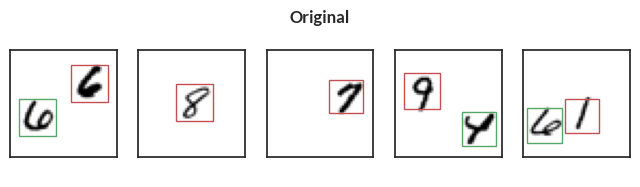

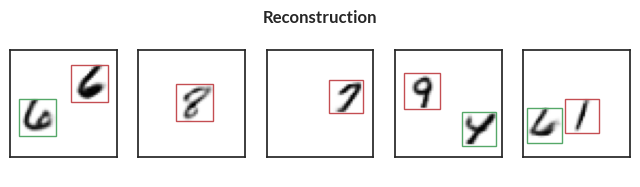

Epoch=78, total_epoch_step_time=276.87, loss=642.88
accuracy=0.9835500121116638, counts=[[19939     9     0     0]
 [    4 19948    68     0]
 [    3   901 19126     2]]


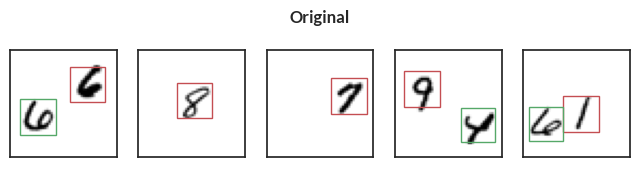

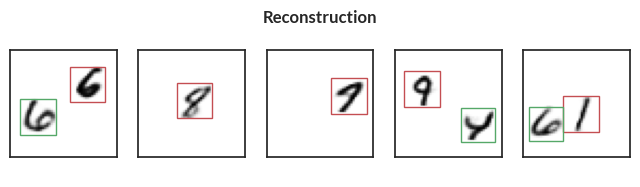

Epoch=79, total_epoch_step_time=280.32, loss=642.86
accuracy=0.9833999872207642, counts=[[19941     7     0     0]
 [    4 19943    73     0]
 [    3   908 19120     1]]


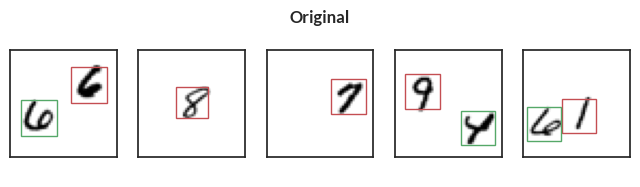

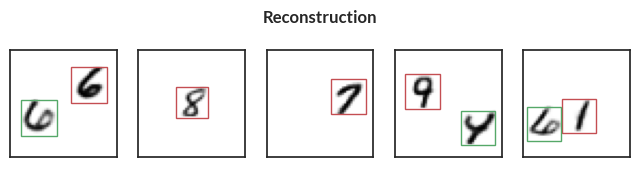

Epoch=80, total_epoch_step_time=284.02, loss=642.91
accuracy=0.9834666848182678, counts=[[19944     4     0     0]
 [    0 19947    73     0]
 [    3   911 19117     1]]


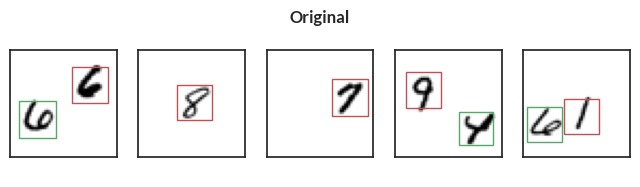

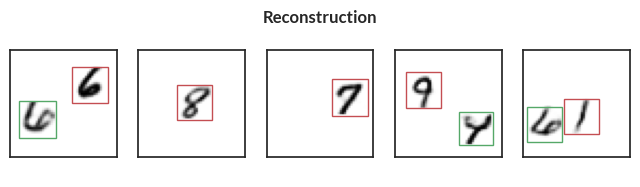

Epoch=81, total_epoch_step_time=287.56, loss=642.99
accuracy=0.9833999872207642, counts=[[19943     5     0     0]
 [    5 19943    72     0]
 [    0   910 19118     4]]


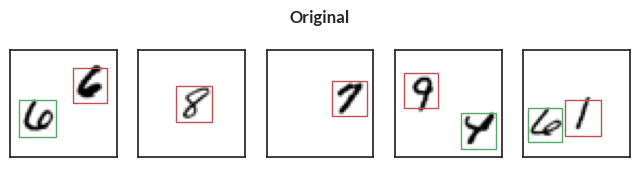

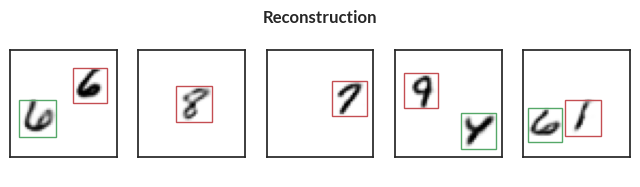

Epoch=82, total_epoch_step_time=291.02, loss=643.10
accuracy=0.9833833575248718, counts=[[19938    10     0     0]
 [    2 19943    75     0]
 [    4   903 19122     3]]


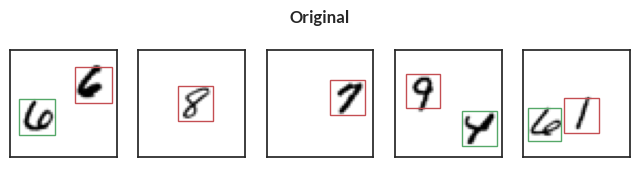

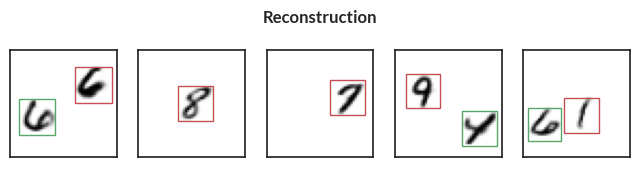

Epoch=83, total_epoch_step_time=294.45, loss=643.05
accuracy=0.9833666682243347, counts=[[19943     5     0     0]
 [    1 19949    70     0]
 [    3   917 19110     2]]


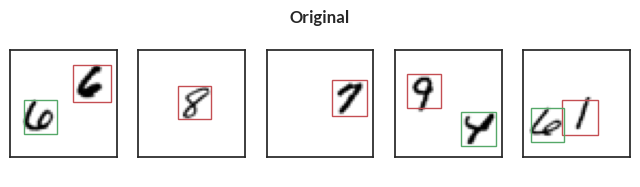

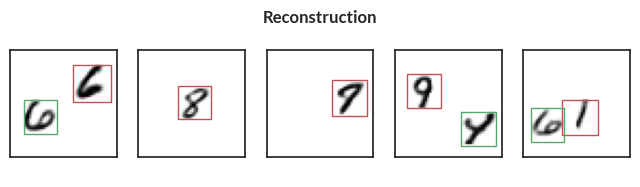

Epoch=84, total_epoch_step_time=297.90, loss=643.08
accuracy=0.9831166863441467, counts=[[19939     9     0     0]
 [    2 19948    70     0]
 [    2   929 19100     1]]


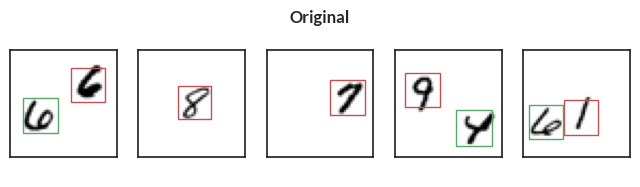

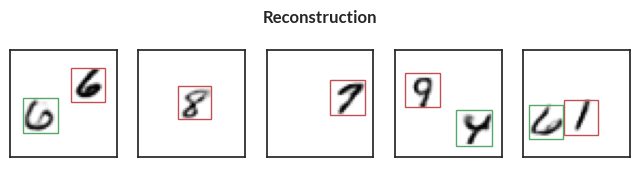

Epoch=85, total_epoch_step_time=301.34, loss=643.20
accuracy=0.9833166599273682, counts=[[19946     2     0     0]
 [    1 19946    73     0]
 [    1   923 19107     1]]


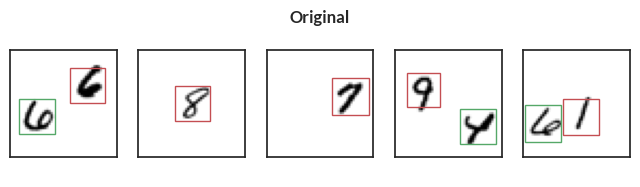

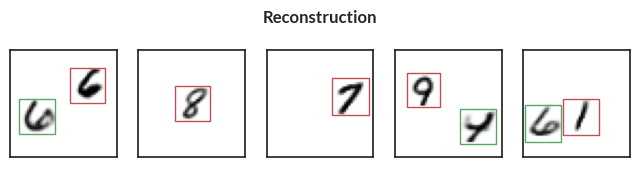

Epoch=86, total_epoch_step_time=304.81, loss=643.21
accuracy=0.9831500053405762, counts=[[19943     5     0     0]
 [    3 19946    71     0]
 [    2   924 19100     6]]


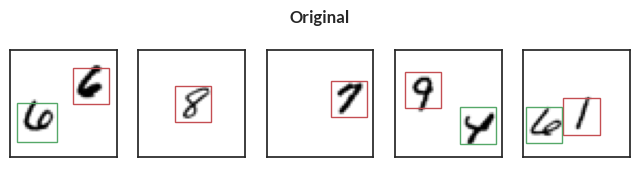

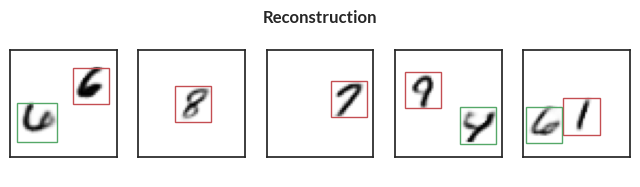

Epoch=87, total_epoch_step_time=308.21, loss=643.20
accuracy=0.9831666946411133, counts=[[19938    10     0     0]
 [    1 19946    73     0]
 [    4   920 19106     2]]


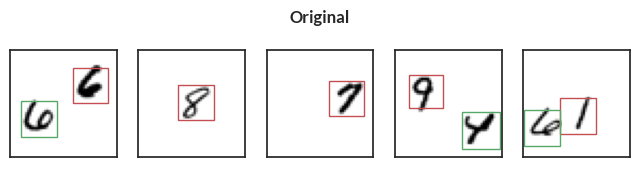

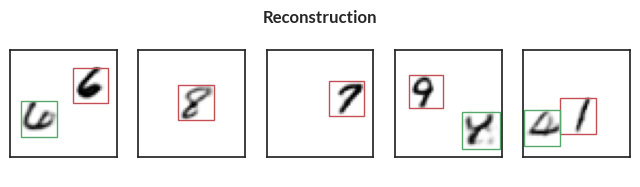

Epoch=88, total_epoch_step_time=311.65, loss=643.32
accuracy=0.9834333658218384, counts=[[19942     6     0     0]
 [    1 19946    73     0]
 [    5   907 19118     2]]


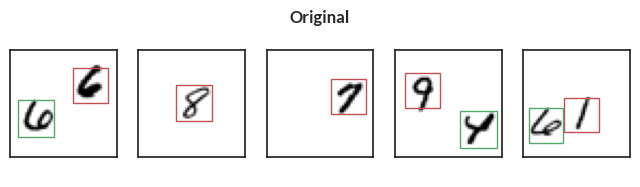

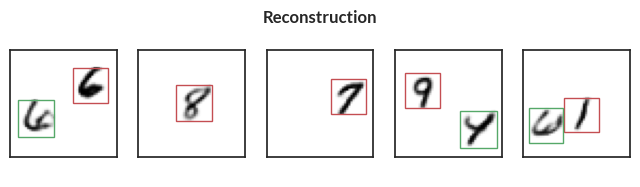

Epoch=89, total_epoch_step_time=315.09, loss=643.28
accuracy=0.9832500219345093, counts=[[19940     8     0     0]
 [    0 19946    74     0]
 [    1   921 19109     1]]


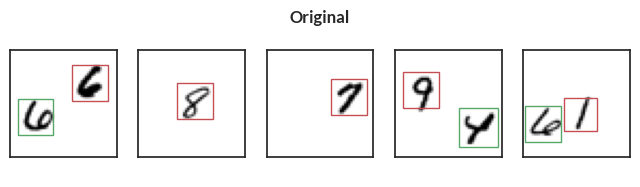

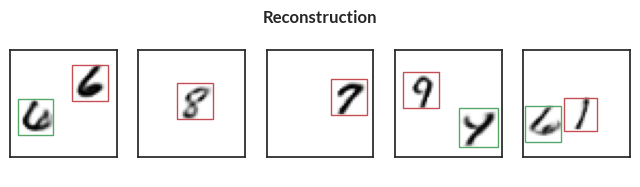

Epoch=90, total_epoch_step_time=318.47, loss=643.31
accuracy=0.9833000302314758, counts=[[19942     6     0     0]
 [    3 19944    73     0]
 [    1   917 19112     2]]


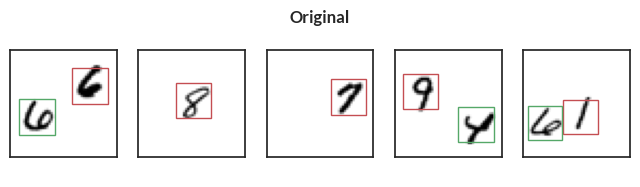

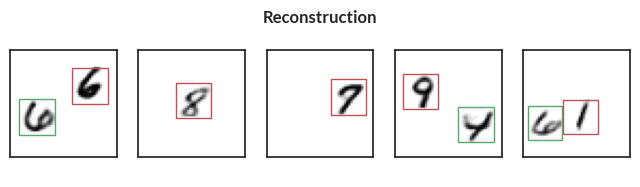

Epoch=91, total_epoch_step_time=321.79, loss=643.41
accuracy=0.9828000068664551, counts=[[19943     5     0     0]
 [    0 19952    68     0]
 [    2   950 19073     7]]


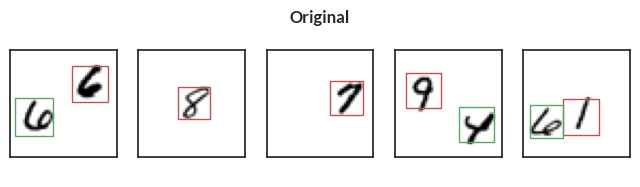

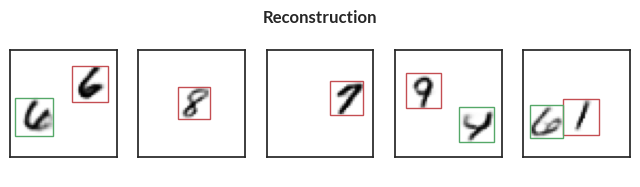

Epoch=92, total_epoch_step_time=325.11, loss=643.43
accuracy=0.9833500385284424, counts=[[19944     4     0     0]
 [    1 19949    70     0]
 [    1   920 19108     3]]


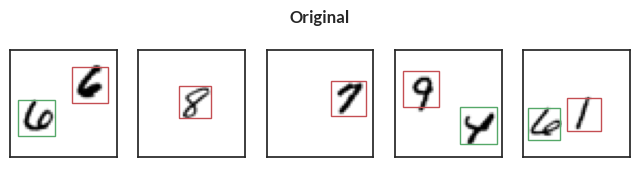

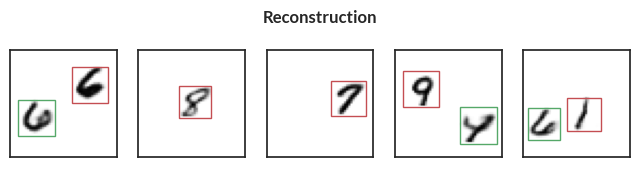

Epoch=93, total_epoch_step_time=328.43, loss=643.46
accuracy=0.9834666848182678, counts=[[19942     6     0     0]
 [    4 19950    66     0]
 [    2   913 19116     1]]


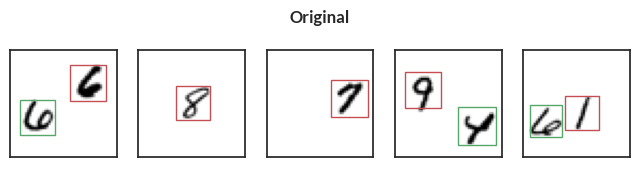

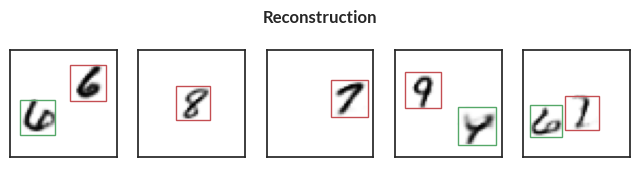

Epoch=94, total_epoch_step_time=331.75, loss=643.50
accuracy=0.9836166501045227, counts=[[19939     9     0     0]
 [    1 19942    77     0]
 [    1   894 19136     1]]


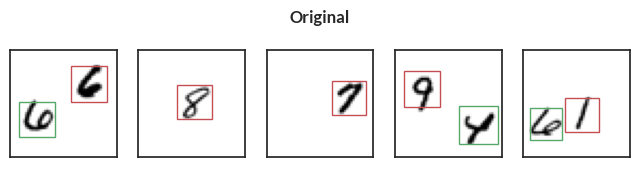

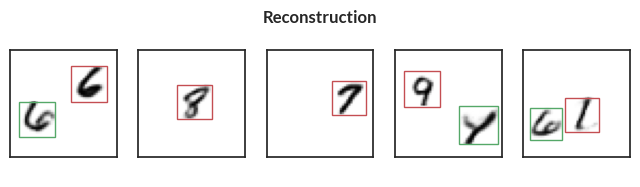

Epoch=95, total_epoch_step_time=335.26, loss=643.60
accuracy=0.9836500287055969, counts=[[19944     4     0     0]
 [    1 19946    73     0]
 [    0   900 19129     3]]


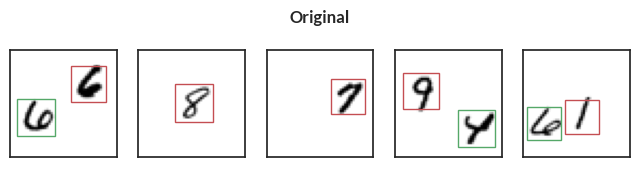

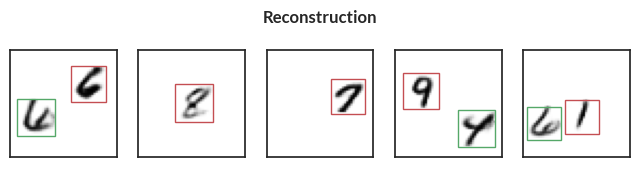

Epoch=96, total_epoch_step_time=338.81, loss=643.62
accuracy=0.9835166931152344, counts=[[19943     5     0     0]
 [    6 19951    63     0]
 [    2   909 19117     4]]


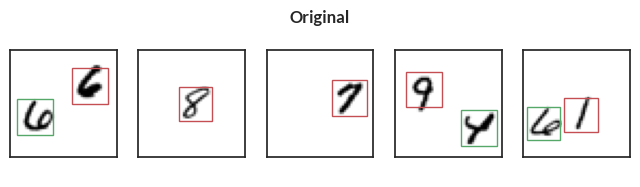

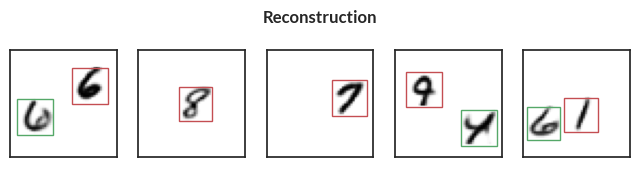

Epoch=97, total_epoch_step_time=342.35, loss=643.49
accuracy=0.9833833575248718, counts=[[19942     6     0     0]
 [    0 19948    72     0]
 [    2   912 19113     5]]


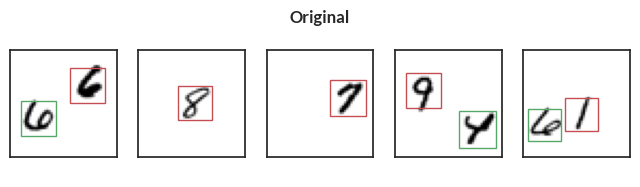

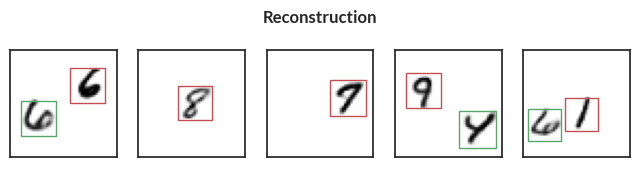

Epoch=98, total_epoch_step_time=345.72, loss=643.70
accuracy=0.9836000204086304, counts=[[19944     4     0     0]
 [    3 19948    69     0]
 [    1   904 19124     3]]


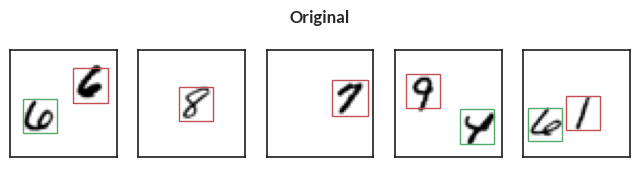

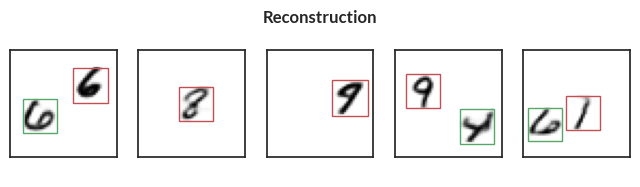

Epoch=99, total_epoch_step_time=349.54, loss=643.80
accuracy=0.9834499955177307, counts=[[19944     4     0     0]
 [    1 19955    64     0]
 [    1   921 19108     2]]


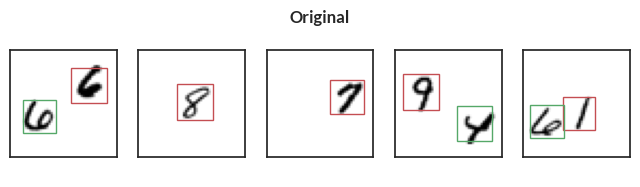

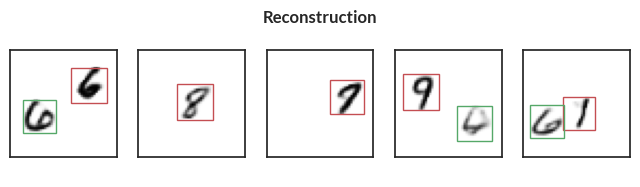

Epoch=100, total_epoch_step_time=353.33, loss=643.79
accuracy=0.9835166931152344, counts=[[19945     3     0     0]
 [    2 19949    69     0]
 [    1   911 19117     3]]


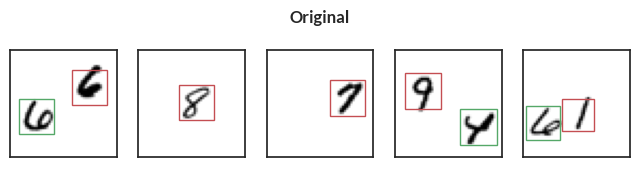

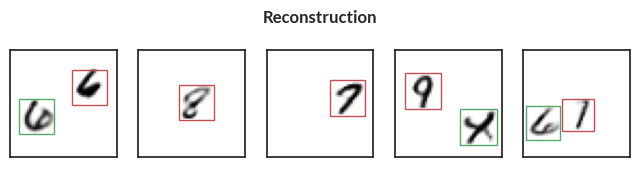

Epoch=101, total_epoch_step_time=357.08, loss=643.76
accuracy=0.9833833575248718, counts=[[19942     6     0     0]
 [    2 19936    82     0]
 [    3   901 19125     3]]


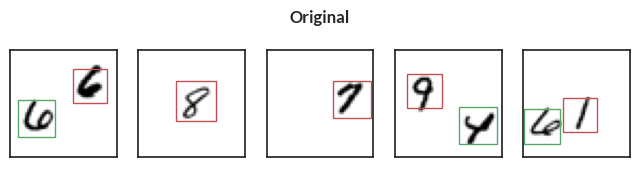

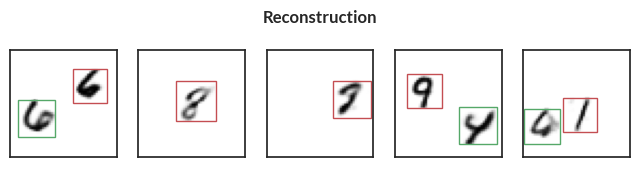

Epoch=102, total_epoch_step_time=360.53, loss=643.83
accuracy=0.9835667014122009, counts=[[19942     6     0     0]
 [    1 19953    66     0]
 [    3   907 19119     3]]


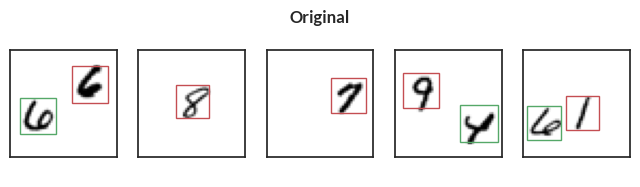

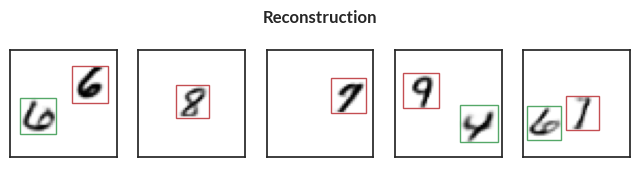

Epoch=103, total_epoch_step_time=364.03, loss=643.80
accuracy=0.9834833145141602, counts=[[19944     4     0     0]
 [    2 19950    68     0]
 [    4   911 19115     2]]


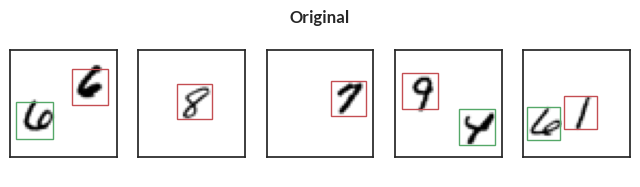

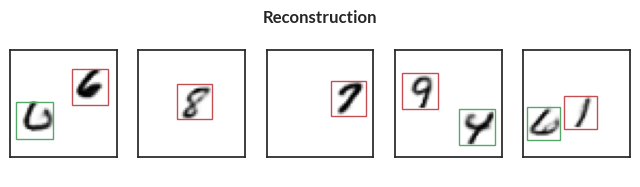

Epoch=104, total_epoch_step_time=367.47, loss=643.86
accuracy=0.9833666682243347, counts=[[19941     7     0     0]
 [    3 19949    68     0]
 [    1   915 19112     4]]


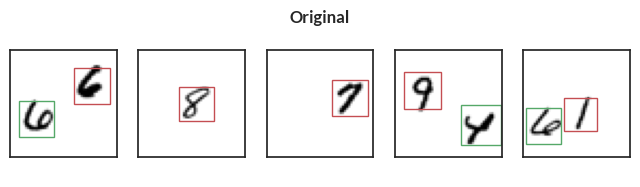

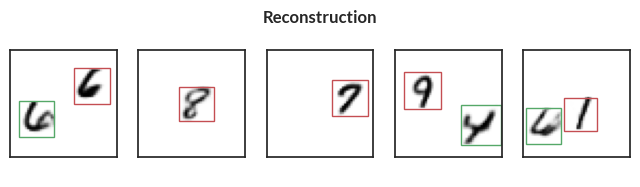

Epoch=105, total_epoch_step_time=370.89, loss=643.86
accuracy=0.9836500287055969, counts=[[19945     3     0     0]
 [    2 19951    67     0]
 [    0   907 19123     2]]


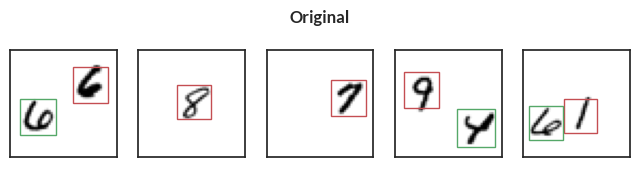

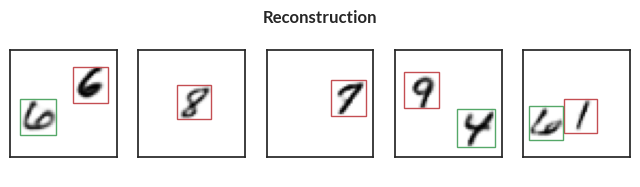

Epoch=106, total_epoch_step_time=374.30, loss=643.99
accuracy=0.9836333394050598, counts=[[19945     3     0     0]
 [    3 19951    66     0]
 [    3   905 19122     2]]


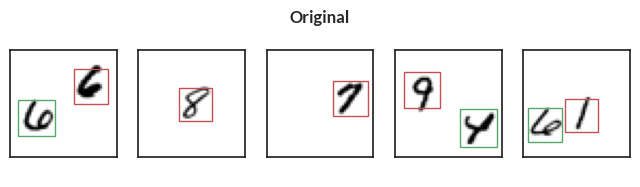

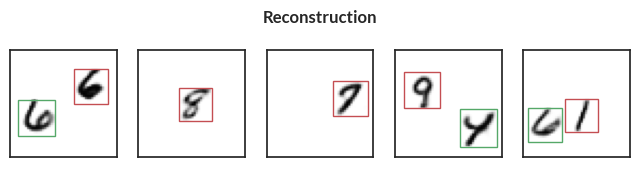

Epoch=107, total_epoch_step_time=377.79, loss=644.01
accuracy=0.9835667014122009, counts=[[19944     4     0     0]
 [    0 19953    67     0]
 [    1   910 19117     4]]


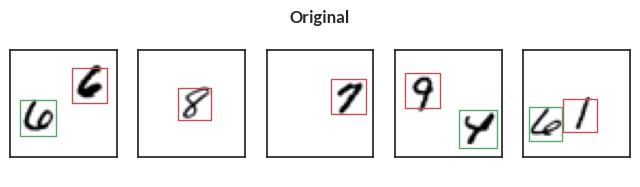

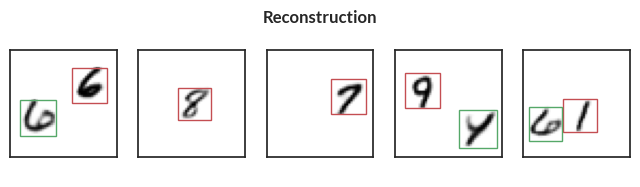

Epoch=108, total_epoch_step_time=381.34, loss=643.89
accuracy=0.9835000038146973, counts=[[19944     4     0     0]
 [    1 19956    63     0]
 [    1   919 19110     2]]


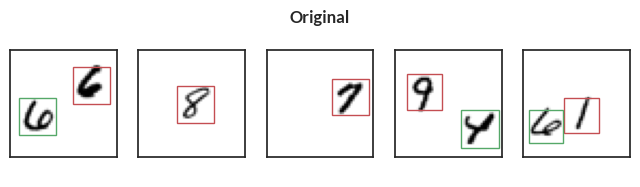

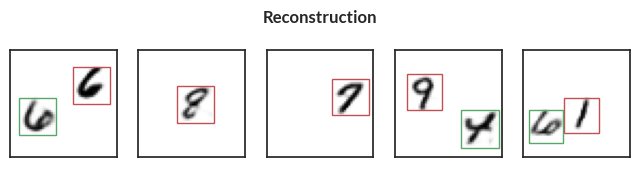

Epoch=109, total_epoch_step_time=384.83, loss=644.11
accuracy=0.9835667014122009, counts=[[19944     4     0     0]
 [    1 19951    68     0]
 [    0   911 19119     2]]


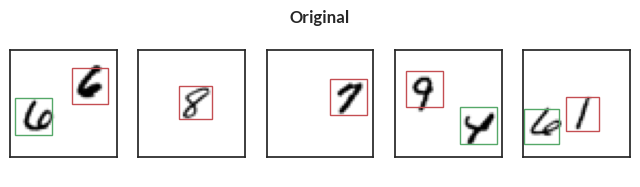

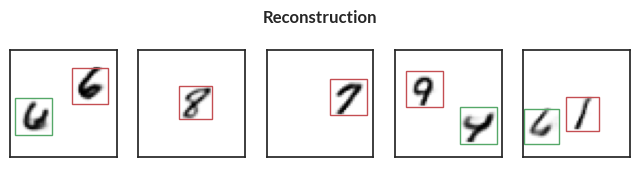

Epoch=110, total_epoch_step_time=388.59, loss=644.08
accuracy=0.9835166931152344, counts=[[19944     4     0     0]
 [    2 19950    68     0]
 [    3   910 19117     2]]


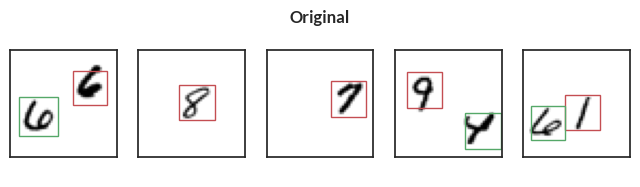

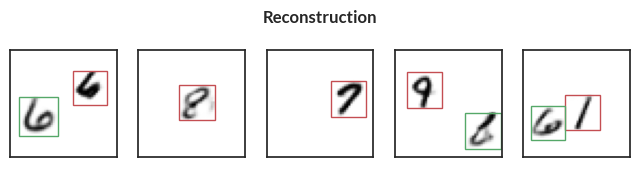

Epoch=111, total_epoch_step_time=392.29, loss=644.15
accuracy=0.9836000204086304, counts=[[19946     2     0     0]
 [    0 19949    71     0]
 [    1   907 19121     3]]


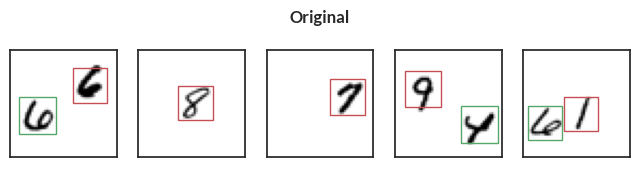

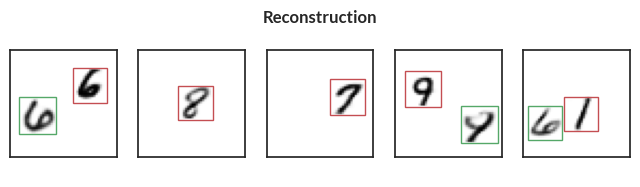

Epoch=112, total_epoch_step_time=396.04, loss=644.12
accuracy=0.9836500287055969, counts=[[19945     3     0     0]
 [    4 19949    67     0]
 [    2   903 19125     2]]


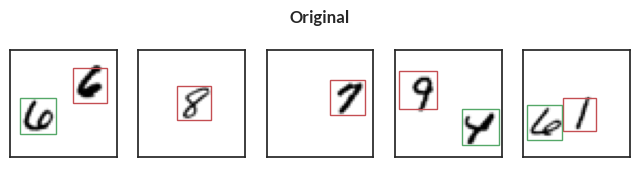

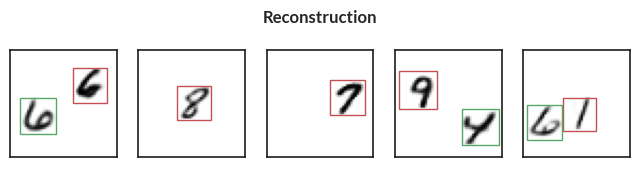

Epoch=113, total_epoch_step_time=399.64, loss=644.25
accuracy=0.9836666584014893, counts=[[19942     6     0     0]
 [    2 19950    68     0]
 [    1   900 19128     3]]


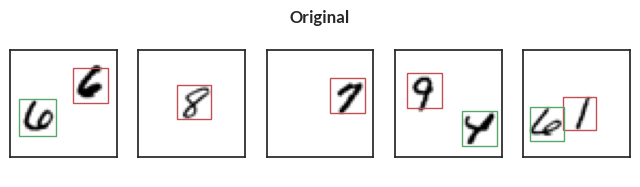

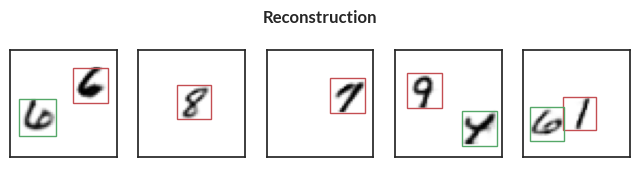

Epoch=114, total_epoch_step_time=403.11, loss=644.18
accuracy=0.9837000370025635, counts=[[19943     5     0     0]
 [    1 19952    67     0]
 [    0   903 19127     2]]


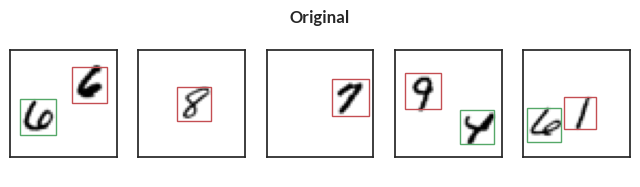

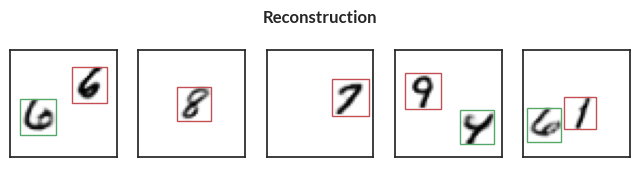

Epoch=115, total_epoch_step_time=406.63, loss=644.31
accuracy=0.9834833145141602, counts=[[19945     3     0     0]
 [    2 19955    63     0]
 [    1   920 19109     2]]


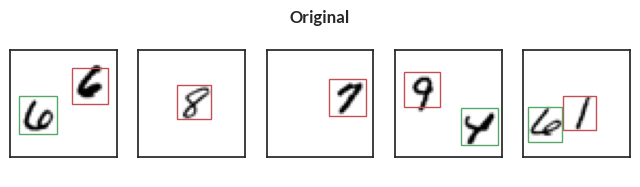

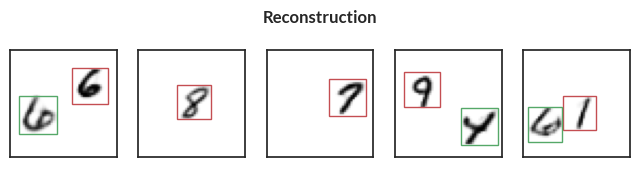

Epoch=116, total_epoch_step_time=410.33, loss=644.28
accuracy=0.9836666584014893, counts=[[19945     3     0     0]
 [    1 19950    69     0]
 [    2   902 19125     3]]


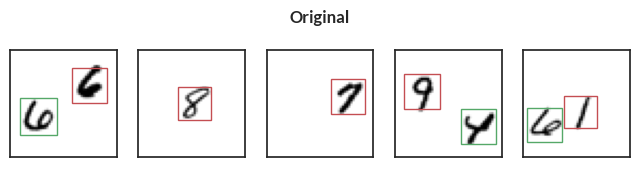

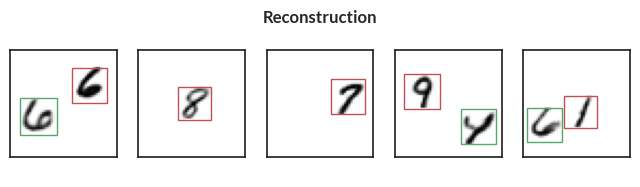

Epoch=117, total_epoch_step_time=413.91, loss=644.29
accuracy=0.9832500219345093, counts=[[19938    10     0     0]
 [    0 19953    67     0]
 [    1   921 19104     6]]


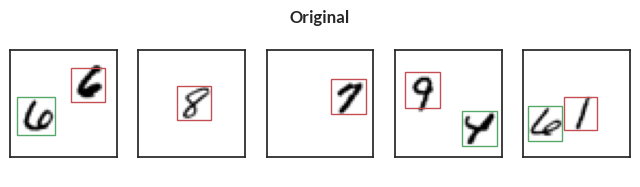

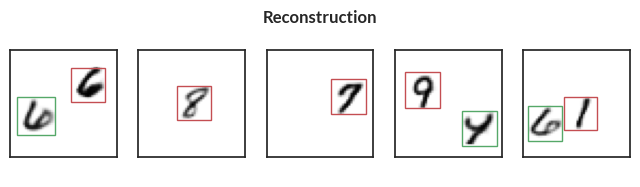

Epoch=118, total_epoch_step_time=417.53, loss=644.33
accuracy=0.9835500121116638, counts=[[19942     6     0     0]
 [    1 19950    69     0]
 [    3   906 19121     2]]


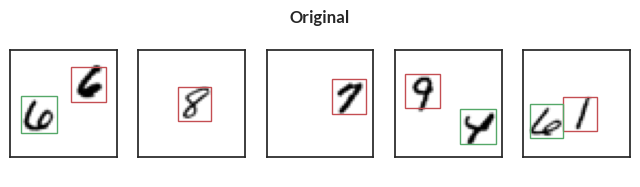

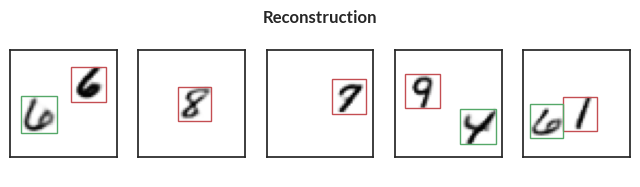

Epoch=119, total_epoch_step_time=421.08, loss=644.27
accuracy=0.9834666848182678, counts=[[19938    10     0     0]
 [    1 19945    74     0]
 [    1   904 19125     2]]


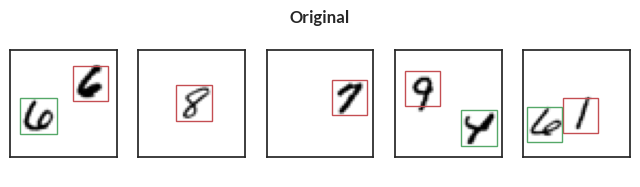

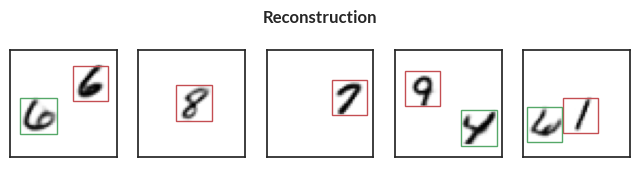

Epoch=120, total_epoch_step_time=424.63, loss=644.32
accuracy=0.9834833145141602, counts=[[19944     4     0     0]
 [    2 19949    69     0]
 [    2   911 19116     3]]


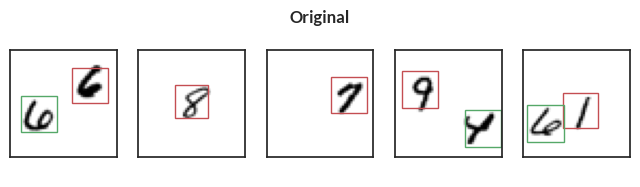

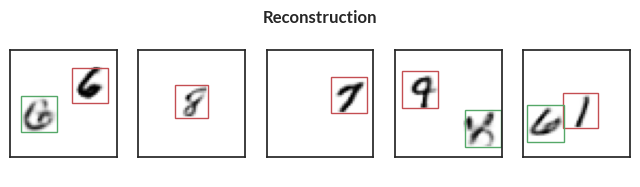

Epoch=121, total_epoch_step_time=428.16, loss=644.39
accuracy=0.9834166765213013, counts=[[19942     6     0     0]
 [    2 19950    68     0]
 [    1   917 19113     1]]


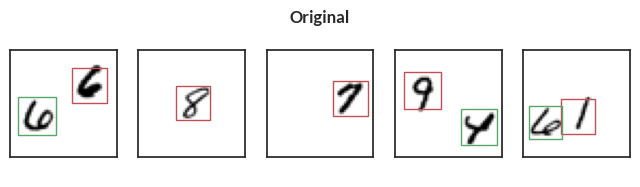

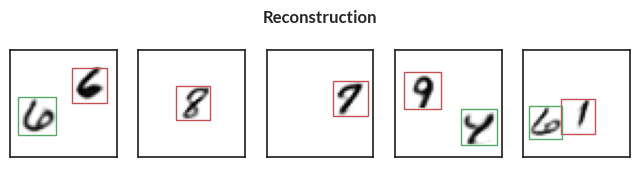

Epoch=122, total_epoch_step_time=431.69, loss=644.31
accuracy=0.9833833575248718, counts=[[19940     8     0     0]
 [    2 19950    68     0]
 [    1   915 19113     3]]


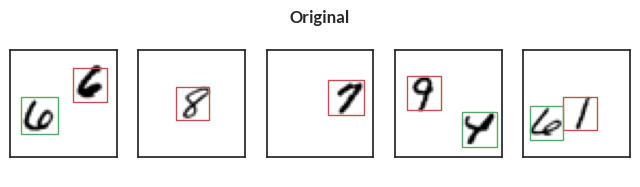

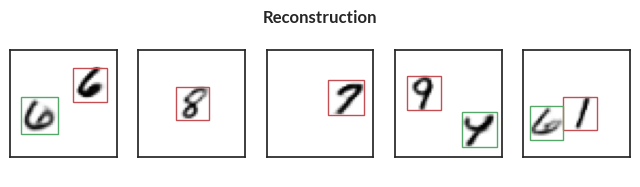

Epoch=123, total_epoch_step_time=435.32, loss=644.42
accuracy=0.9835667014122009, counts=[[19938    10     0     0]
 [    2 19953    65     0]
 [    6   902 19123     1]]


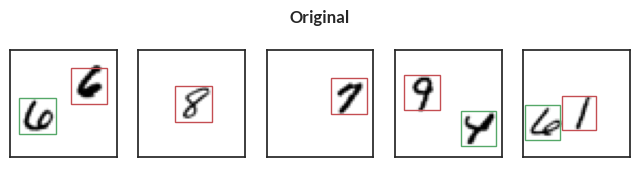

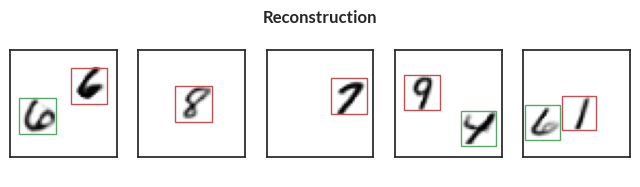

Epoch=124, total_epoch_step_time=438.73, loss=644.43
accuracy=0.9836666584014893, counts=[[19944     4     0     0]
 [    0 19953    67     0]
 [    2   905 19123     2]]


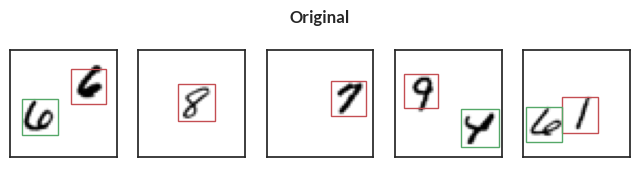

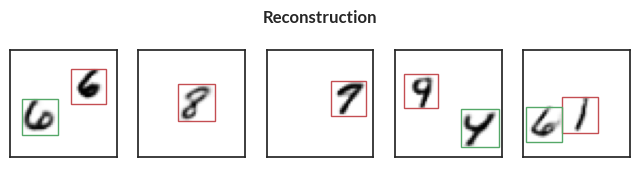

Epoch=125, total_epoch_step_time=442.07, loss=644.49
accuracy=0.9837166666984558, counts=[[19942     6     0     0]
 [    1 19948    71     0]
 [    4   890 19133     5]]


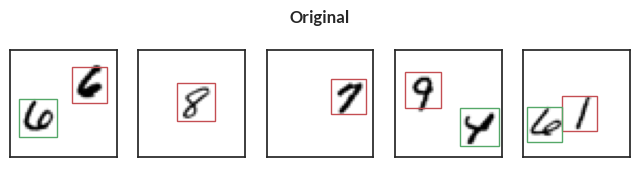

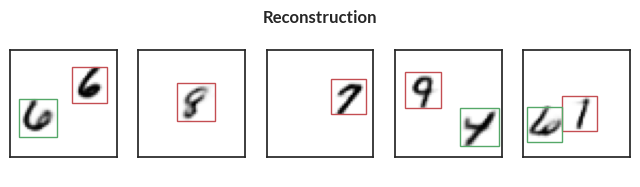

Epoch=126, total_epoch_step_time=445.41, loss=644.45
accuracy=0.9833333492279053, counts=[[19942     6     0     0]
 [    3 19951    66     0]
 [    3   919 19107     3]]


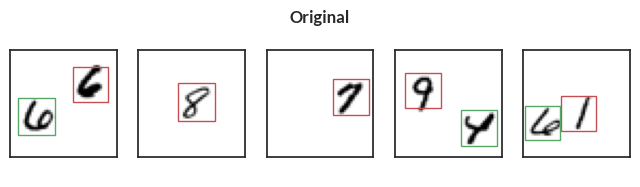

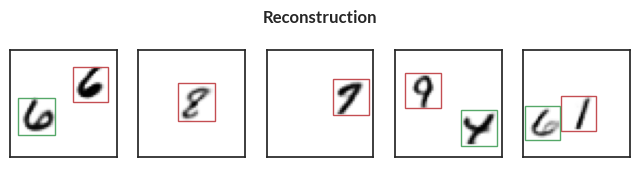

Epoch=127, total_epoch_step_time=448.75, loss=644.60
accuracy=0.9833999872207642, counts=[[19945     3     0     0]
 [    1 19952    67     0]
 [    5   916 19107     4]]


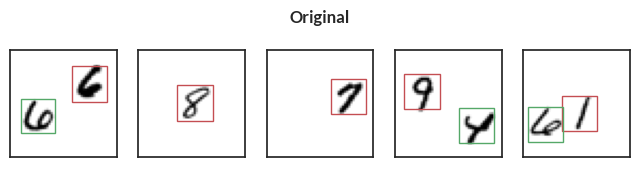

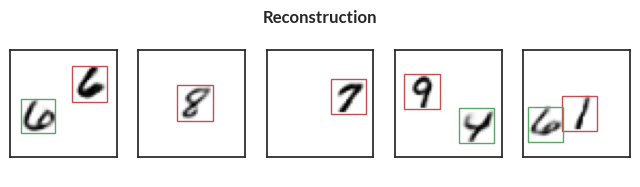

Epoch=128, total_epoch_step_time=452.10, loss=644.66
accuracy=0.9834666848182678, counts=[[19942     6     0     0]
 [    0 19949    71     0]
 [    0   913 19117     2]]


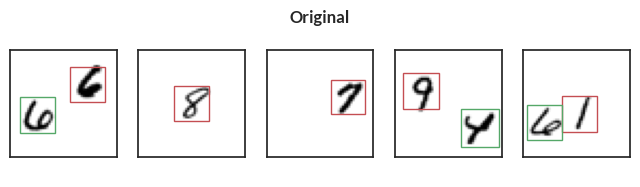

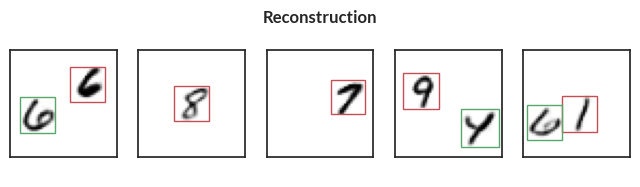

Epoch=129, total_epoch_step_time=455.44, loss=644.57
accuracy=0.9834333658218384, counts=[[19939     9     0     0]
 [    6 19946    68     0]
 [    1   907 19121     3]]


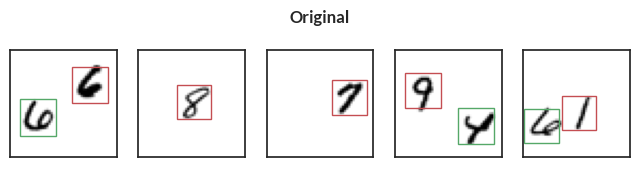

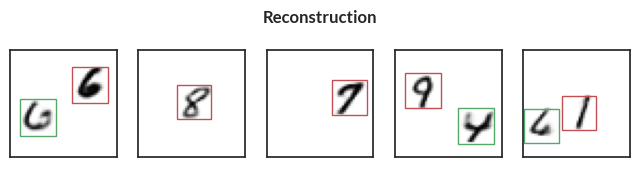

Epoch=130, total_epoch_step_time=458.78, loss=644.63
accuracy=0.9834333658218384, counts=[[19941     7     0     0]
 [    4 19948    68     0]
 [    1   911 19117     3]]


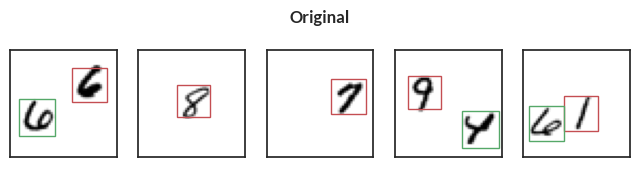

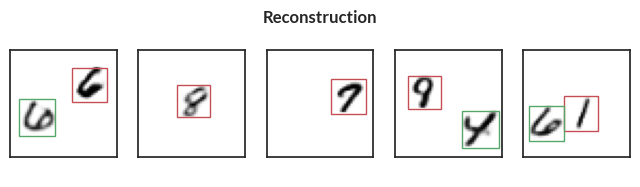

Epoch=131, total_epoch_step_time=462.13, loss=644.65
accuracy=0.9833999872207642, counts=[[19941     7     0     0]
 [    3 19948    69     0]
 [    1   912 19115     4]]


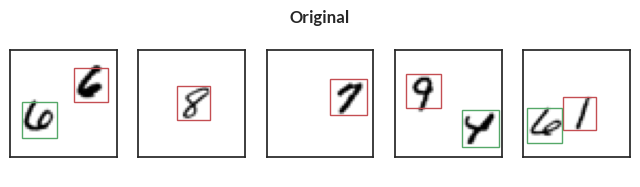

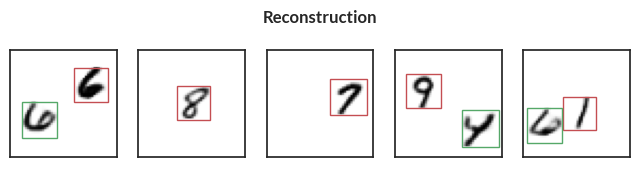

Epoch=132, total_epoch_step_time=465.47, loss=644.69
accuracy=0.9835166931152344, counts=[[19942     6     0     0]
 [    2 19949    69     0]
 [    2   906 19120     4]]


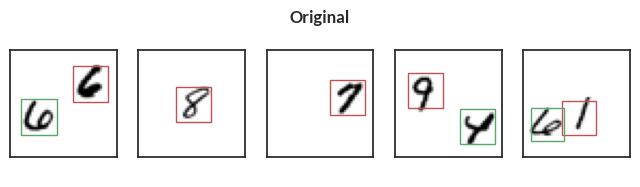

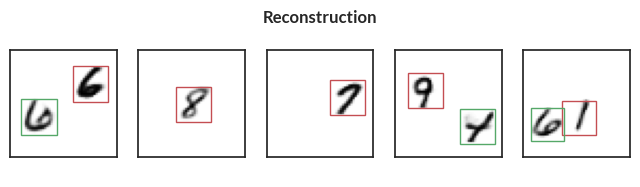

Epoch=133, total_epoch_step_time=468.82, loss=644.77
accuracy=0.9832833409309387, counts=[[19940     8     0     0]
 [    3 19948    69     0]
 [    2   918 19109     3]]


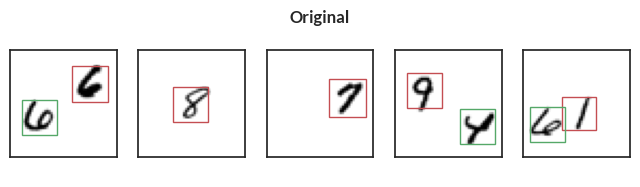

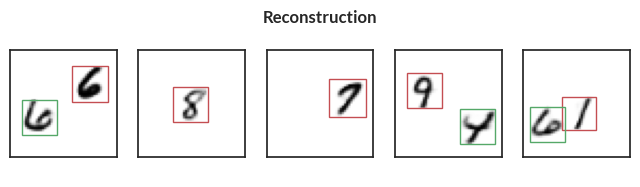

Epoch=134, total_epoch_step_time=472.16, loss=644.73
accuracy=0.9836166501045227, counts=[[19946     2     0     0]
 [    4 19949    67     0]
 [    2   904 19122     4]]


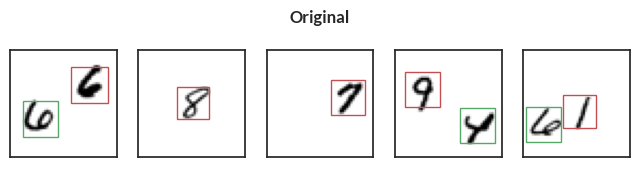

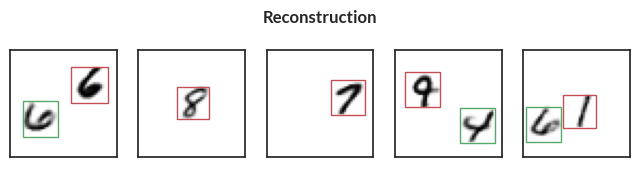

Epoch=135, total_epoch_step_time=475.50, loss=644.63
accuracy=0.9831833243370056, counts=[[19941     7     0     0]
 [    2 19949    69     0]
 [    2   926 19101     3]]


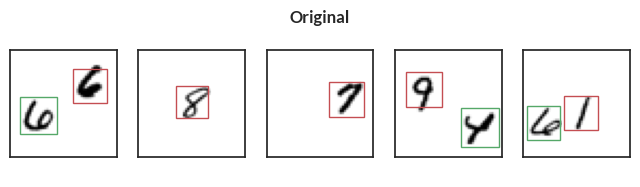

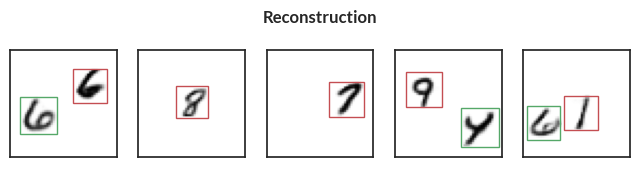

Epoch=136, total_epoch_step_time=478.88, loss=644.74
accuracy=0.9835333228111267, counts=[[19941     7     0     0]
 [    2 19949    69     0]
 [    0   907 19122     3]]


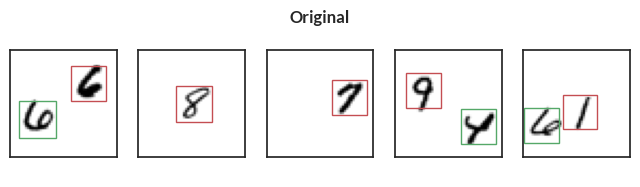

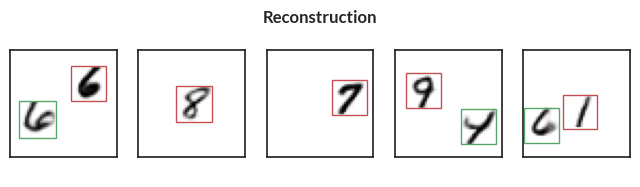

Epoch=137, total_epoch_step_time=482.42, loss=644.76
accuracy=0.9835333228111267, counts=[[19943     5     0     0]
 [    4 19943    73     0]
 [    1   904 19126     1]]


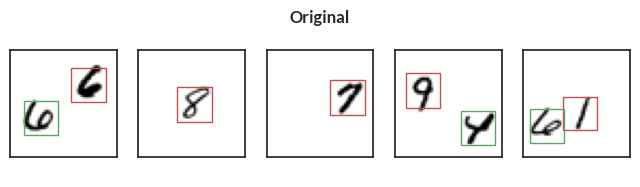

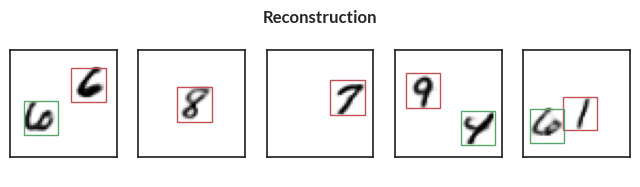

Epoch=138, total_epoch_step_time=485.84, loss=644.85
accuracy=0.9835500121116638, counts=[[19943     5     0     0]
 [    4 19950    66     0]
 [    2   908 19120     2]]


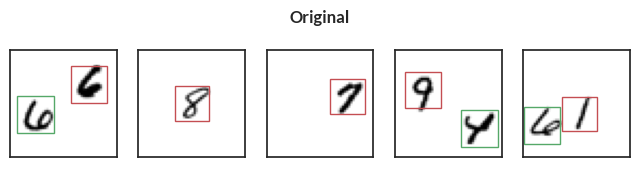

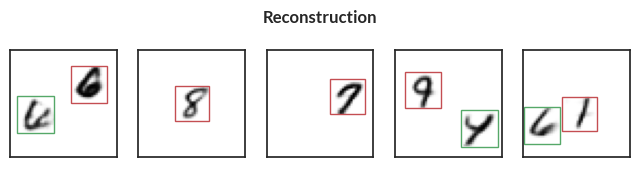

Epoch=139, total_epoch_step_time=489.49, loss=644.86
accuracy=0.9837000370025635, counts=[[19945     3     0     0]
 [    1 19948    71     0]
 [    3   898 19129     2]]


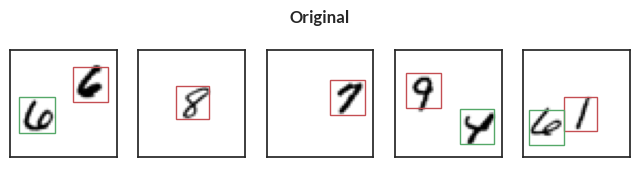

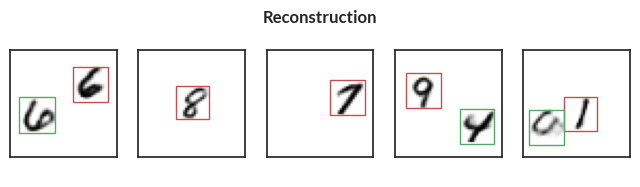

Epoch=140, total_epoch_step_time=493.24, loss=644.86
accuracy=0.9834833145141602, counts=[[19944     4     0     0]
 [    0 19949    71     0]
 [    4   910 19116     2]]


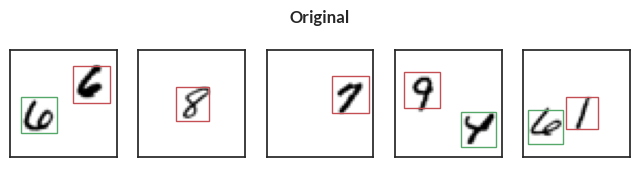

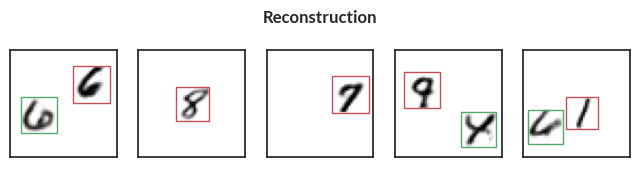

Epoch=141, total_epoch_step_time=496.89, loss=644.82
accuracy=0.9835500121116638, counts=[[19940     8     0     0]
 [    2 19949    69     0]
 [    3   901 19124     4]]


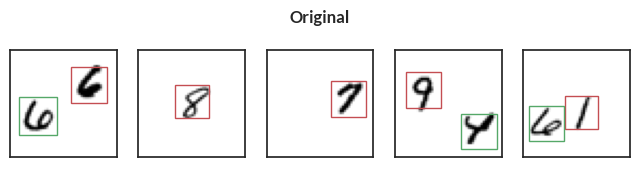

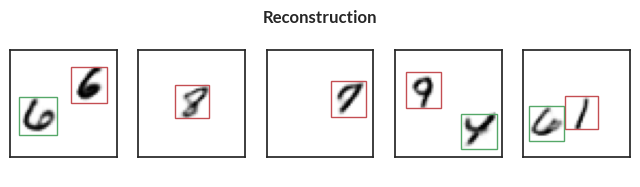

Epoch=142, total_epoch_step_time=500.65, loss=644.86
accuracy=0.9834666848182678, counts=[[19940     8     0     0]
 [    1 19950    69     0]
 [    3   909 19118     2]]


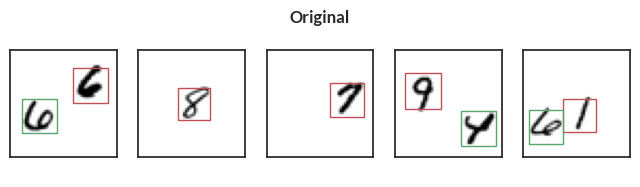

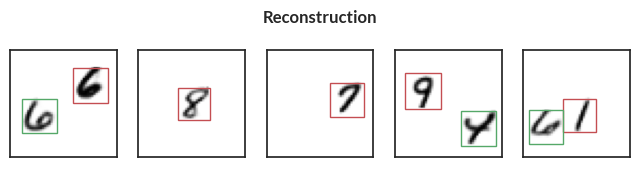

Epoch=143, total_epoch_step_time=504.33, loss=644.95
accuracy=0.9834499955177307, counts=[[19938    10     0     0]
 [    1 19956    63     0]
 [    3   914 19113     2]]


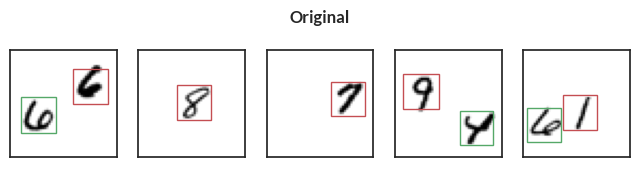

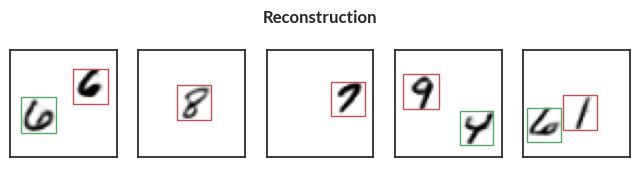

Epoch=144, total_epoch_step_time=508.05, loss=644.97
accuracy=0.9836166501045227, counts=[[19943     5     0     0]
 [    1 19953    66     0]
 [    3   906 19121     2]]


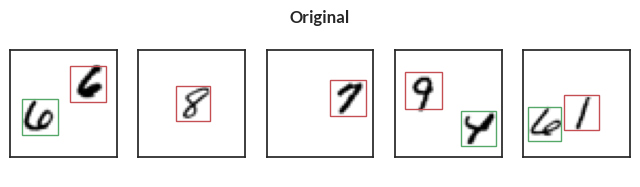

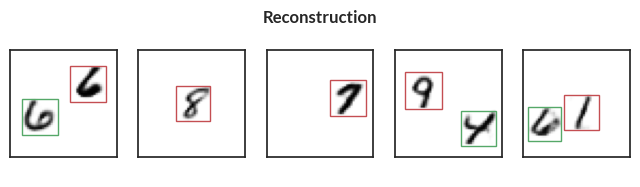

Epoch=145, total_epoch_step_time=511.72, loss=644.89
accuracy=0.9835500121116638, counts=[[19942     6     0     0]
 [    2 19952    66     0]
 [    3   906 19119     4]]


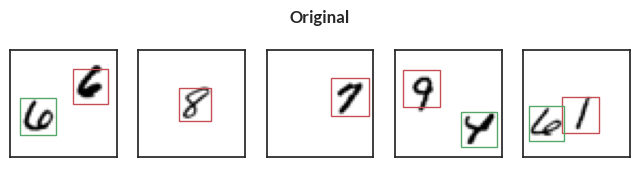

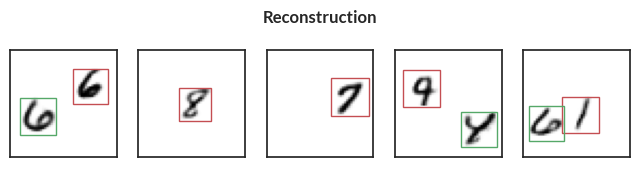

Epoch=146, total_epoch_step_time=515.28, loss=644.99
accuracy=0.9834333658218384, counts=[[19945     3     0     0]
 [    0 19949    71     0]
 [    3   914 19112     3]]


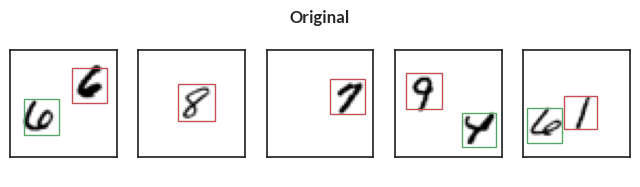

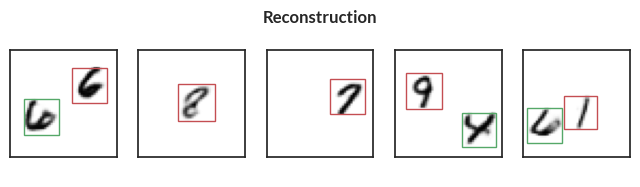

Epoch=147, total_epoch_step_time=518.83, loss=645.03
accuracy=0.9835500121116638, counts=[[19944     4     0     0]
 [    5 19945    70     0]
 [    1   906 19124     1]]


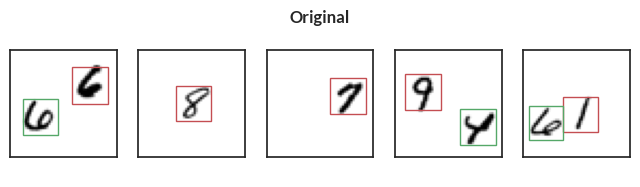

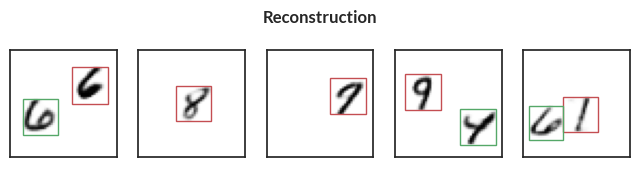

Epoch=148, total_epoch_step_time=522.34, loss=644.98
accuracy=0.9836000204086304, counts=[[19945     3     0     0]
 [    1 19955    64     0]
 [    3   910 19116     3]]


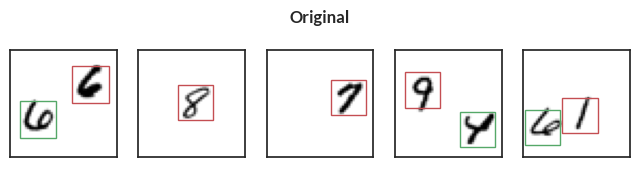

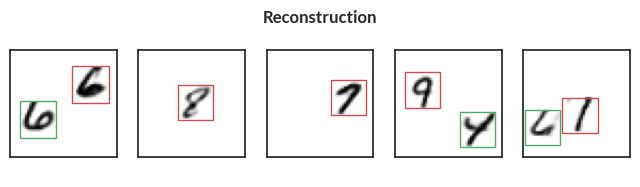

Epoch=149, total_epoch_step_time=525.85, loss=644.95
accuracy=0.9835000038146973, counts=[[19944     4     0     0]
 [    1 19949    70     0]
 [    3   907 19117     5]]


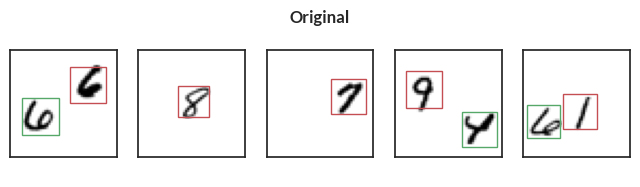

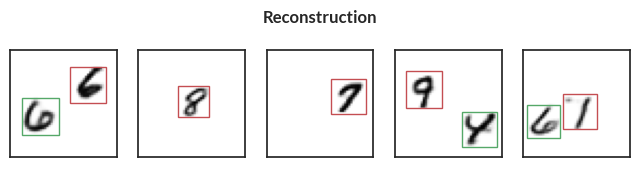

Epoch=150, total_epoch_step_time=529.39, loss=645.03
accuracy=0.9835333228111267, counts=[[19940     8     0     0]
 [    1 19952    67     0]
 [    1   909 19120     2]]


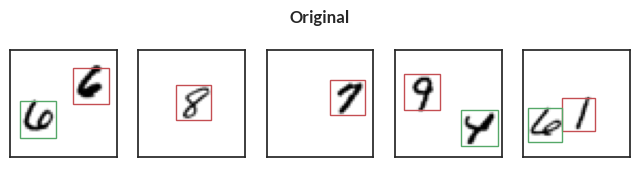

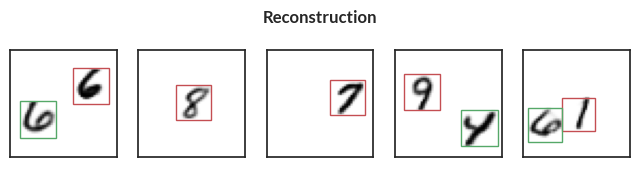

Epoch=151, total_epoch_step_time=532.89, loss=645.08
accuracy=0.9833500385284424, counts=[[19937    11     0     0]
 [    1 19953    66     0]
 [    3   914 19111     4]]


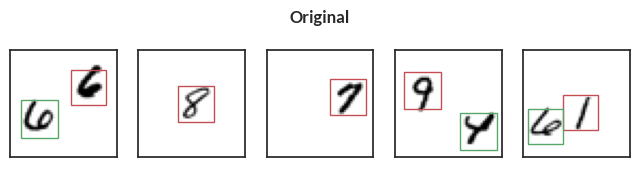

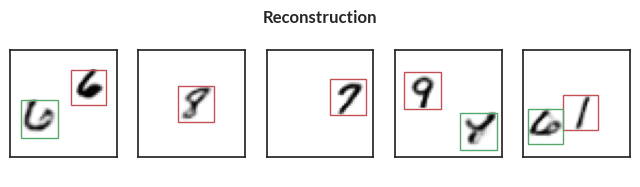

Epoch=152, total_epoch_step_time=536.40, loss=645.03
accuracy=0.9834499955177307, counts=[[19945     3     0     0]
 [    2 19947    71     0]
 [    2   910 19115     5]]


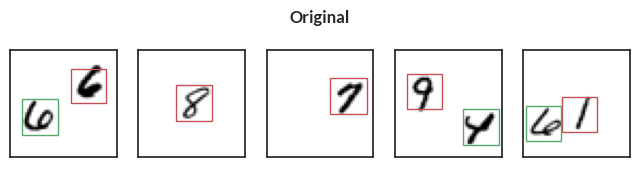

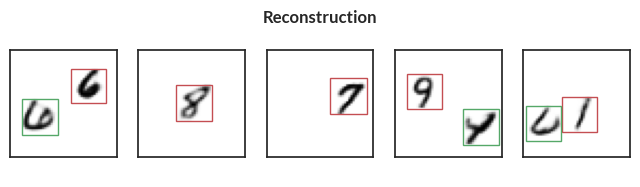

Epoch=153, total_epoch_step_time=539.91, loss=645.11
accuracy=0.9835833311080933, counts=[[19943     5     0     0]
 [    1 19953    66     0]
 [    2   907 19119     4]]


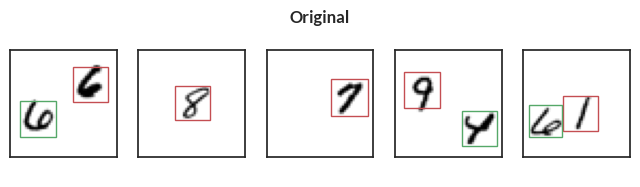

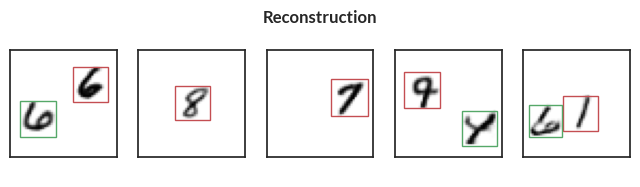

Epoch=154, total_epoch_step_time=543.47, loss=645.12
accuracy=0.9836000204086304, counts=[[19944     4     0     0]
 [    1 19952    67     0]
 [    0   909 19120     3]]


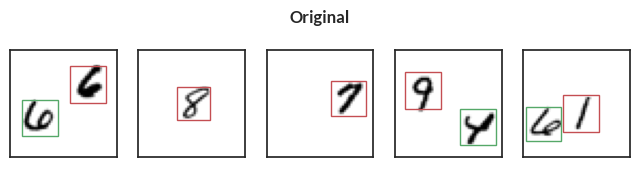

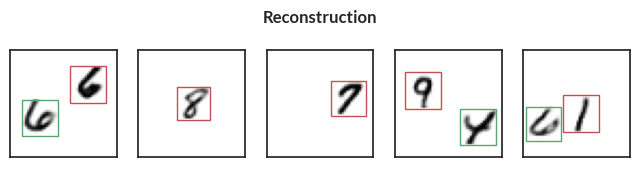

Epoch=155, total_epoch_step_time=546.85, loss=645.15
accuracy=0.9835500121116638, counts=[[19945     3     0     0]
 [    3 19947    70     0]
 [    3   904 19121     4]]


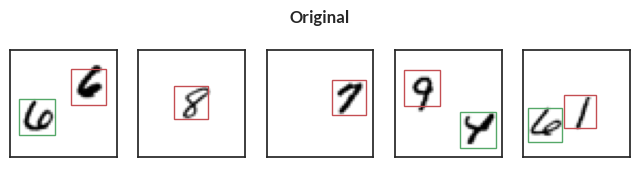

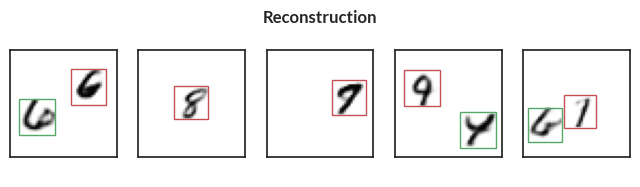

Epoch=156, total_epoch_step_time=550.24, loss=645.15
accuracy=0.9834666848182678, counts=[[19945     3     0     0]
 [    5 19950    65     0]
 [    2   915 19113     2]]


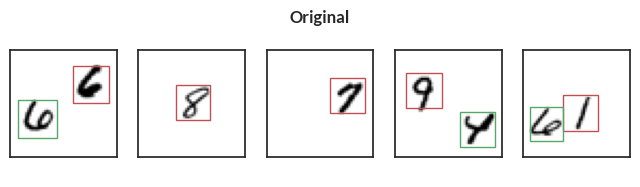

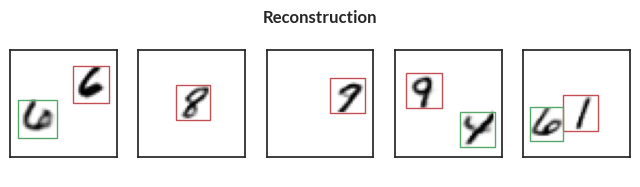

Epoch=157, total_epoch_step_time=553.62, loss=645.17
accuracy=0.9834833145141602, counts=[[19941     7     0     0]
 [    1 19953    66     0]
 [    2   910 19115     5]]


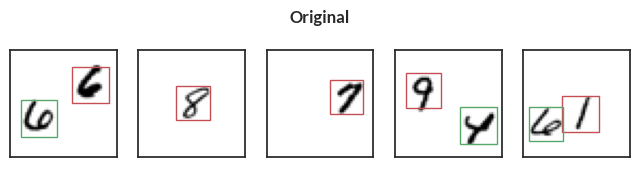

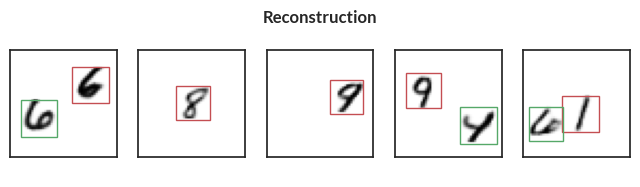

Epoch=158, total_epoch_step_time=557.01, loss=645.19
accuracy=0.9833666682243347, counts=[[19940     8     0     0]
 [    1 19950    69     0]
 [    3   916 19112     1]]


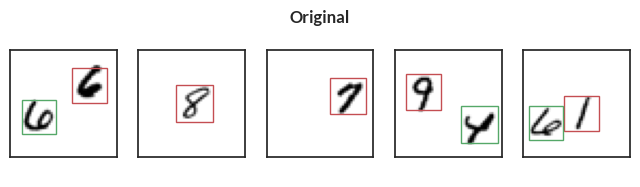

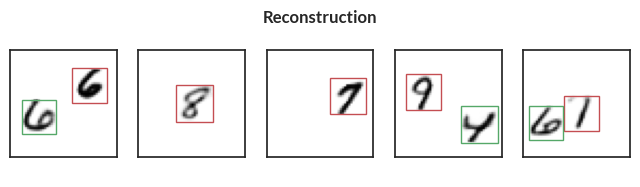

Epoch=159, total_epoch_step_time=560.39, loss=645.20
accuracy=0.9834499955177307, counts=[[19938    10     0     0]
 [    3 19947    70     0]
 [    1   907 19122     2]]


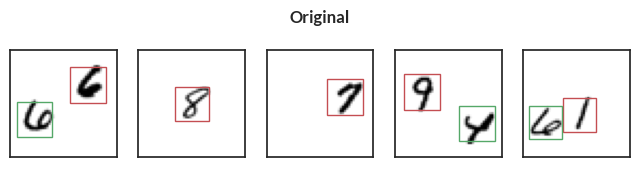

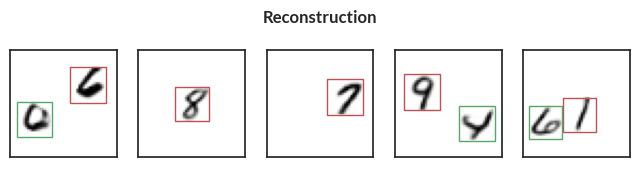

Epoch=160, total_epoch_step_time=563.78, loss=645.27
accuracy=0.9835166931152344, counts=[[19941     7     0     0]
 [    3 19951    66     0]
 [    4   907 19119     2]]


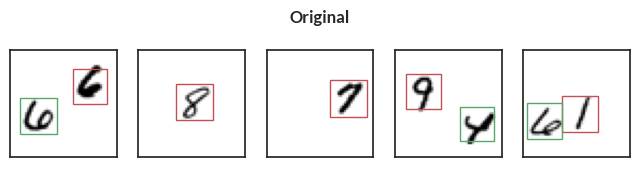

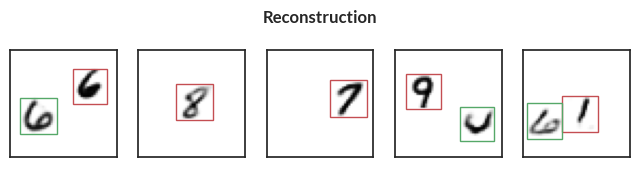

Epoch=161, total_epoch_step_time=567.16, loss=645.26
accuracy=0.9836000204086304, counts=[[19943     5     0     0]
 [    3 19955    62     0]
 [    1   910 19118     3]]


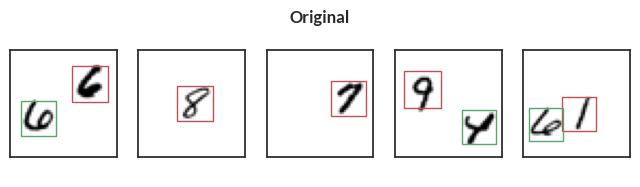

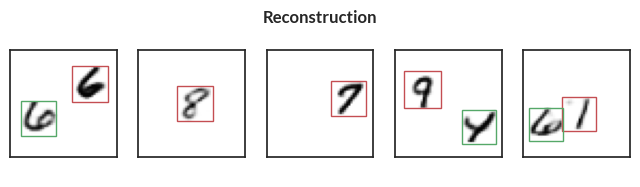

Epoch=162, total_epoch_step_time=570.55, loss=645.19
accuracy=0.9835667014122009, counts=[[19942     6     0     0]
 [    3 19951    66     0]
 [    0   904 19121     7]]


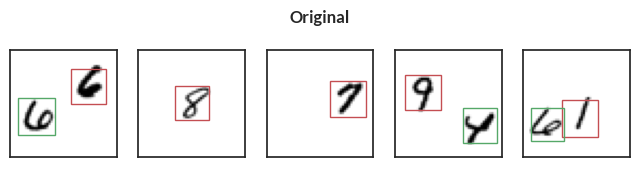

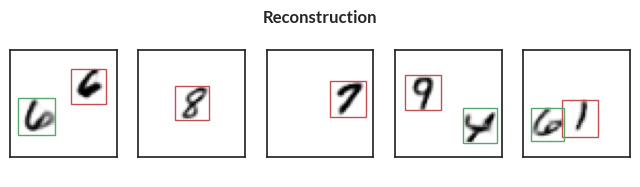

Epoch=163, total_epoch_step_time=573.93, loss=645.23
accuracy=0.9836000204086304, counts=[[19943     5     0     0]
 [    2 19952    66     0]
 [    0   904 19121     7]]


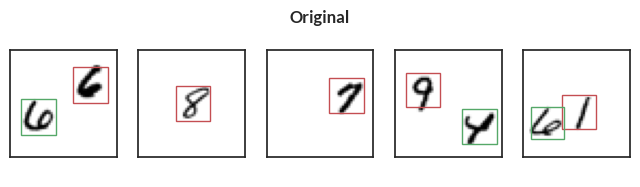

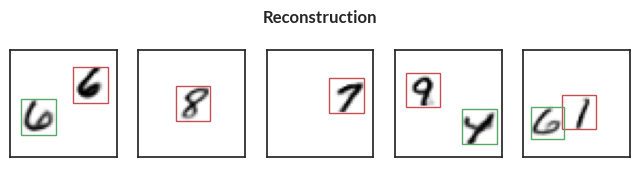

Epoch=164, total_epoch_step_time=577.31, loss=645.30
accuracy=0.9836833477020264, counts=[[19943     5     0     0]
 [    2 19946    72     0]
 [    3   893 19132     4]]


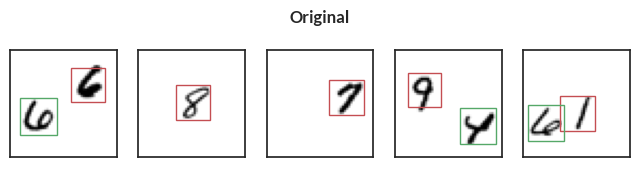

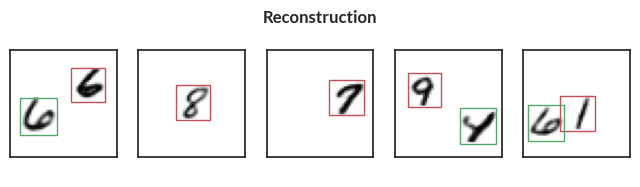

Epoch=165, total_epoch_step_time=580.69, loss=645.30
accuracy=0.9835833311080933, counts=[[19942     6     0     0]
 [    1 19951    68     0]
 [    0   908 19122     2]]


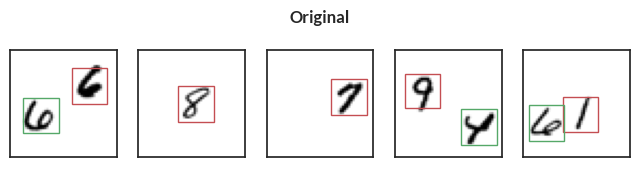

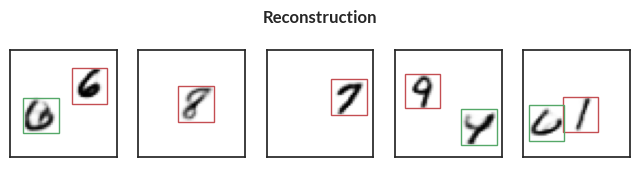

Epoch=166, total_epoch_step_time=584.08, loss=645.38
accuracy=0.9835833311080933, counts=[[19942     6     0     0]
 [    2 19952    66     0]
 [    2   906 19121     3]]


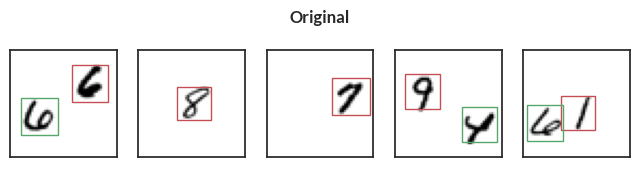

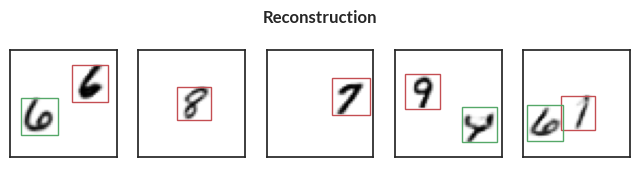

Epoch=167, total_epoch_step_time=587.46, loss=645.42
accuracy=0.9835833311080933, counts=[[19946     2     0     0]
 [    2 19953    65     0]
 [    2   912 19116     2]]


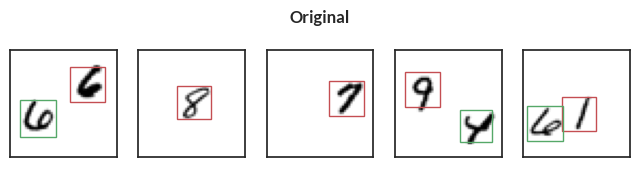

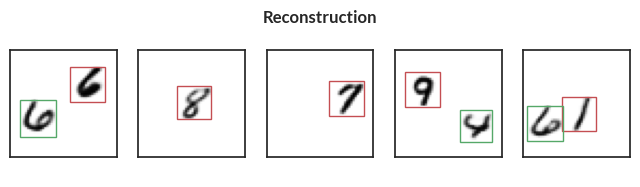

Epoch=168, total_epoch_step_time=590.84, loss=645.34
accuracy=0.9836333394050598, counts=[[19940     8     0     0]
 [    1 19954    65     0]
 [    3   904 19124     1]]


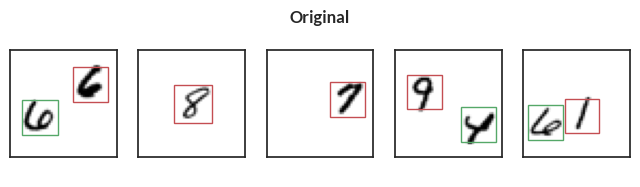

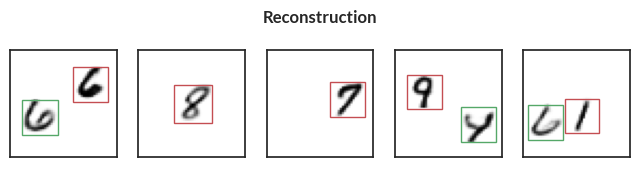

Epoch=169, total_epoch_step_time=594.23, loss=645.38
accuracy=0.9833333492279053, counts=[[19943     5     0     0]
 [    1 19951    68     0]
 [    3   920 19106     3]]


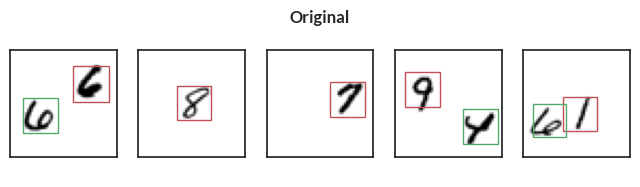

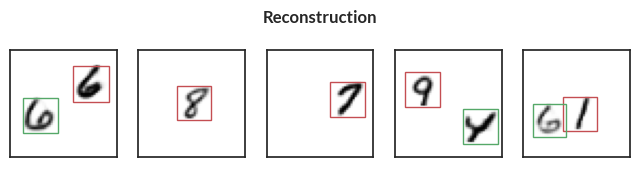

Epoch=170, total_epoch_step_time=597.62, loss=645.41
accuracy=0.9833500385284424, counts=[[19933    15     0     0]
 [    2 19951    67     0]
 [    2   908 19117     5]]


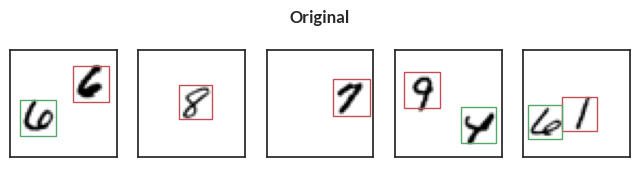

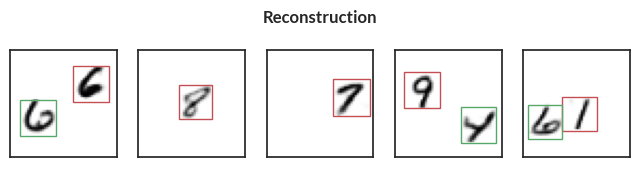

Epoch=171, total_epoch_step_time=601.01, loss=645.45
accuracy=0.9833500385284424, counts=[[19943     5     0     0]
 [    3 19948    69     0]
 [    1   917 19110     4]]


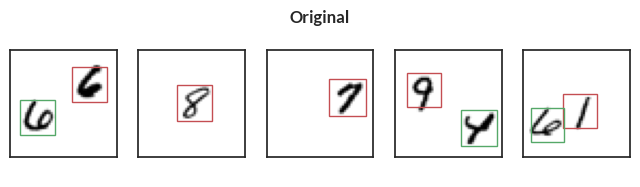

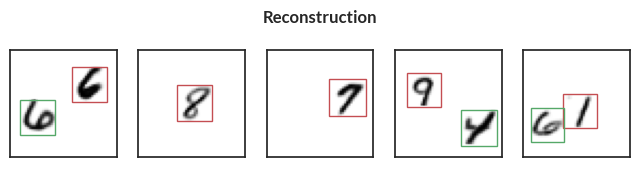

Epoch=172, total_epoch_step_time=604.40, loss=645.50
accuracy=0.9835667014122009, counts=[[19942     6     0     0]
 [    2 19951    67     0]
 [    0   909 19121     2]]


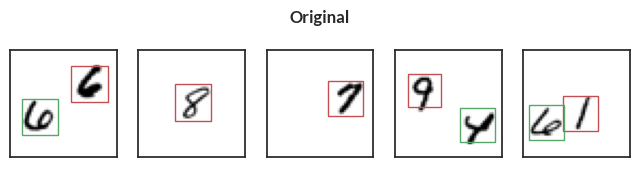

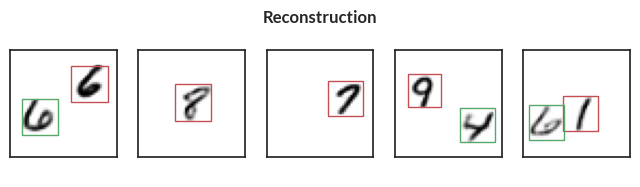

Epoch=173, total_epoch_step_time=607.79, loss=645.49
accuracy=0.9836333394050598, counts=[[19942     6     0     0]
 [    2 19952    66     0]
 [    2   903 19124     3]]


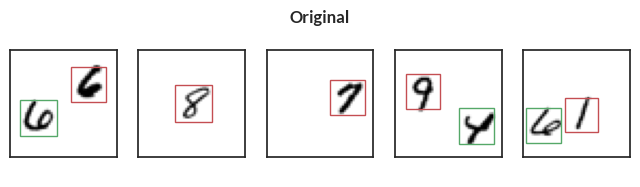

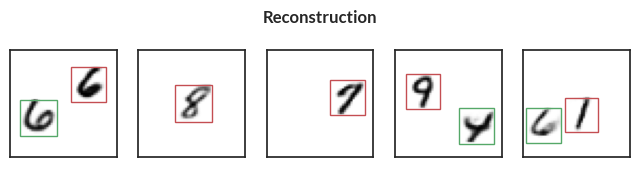

Epoch=174, total_epoch_step_time=611.18, loss=645.50
accuracy=0.9835667014122009, counts=[[19945     3     0     0]
 [    2 19954    64     0]
 [    1   913 19115     3]]


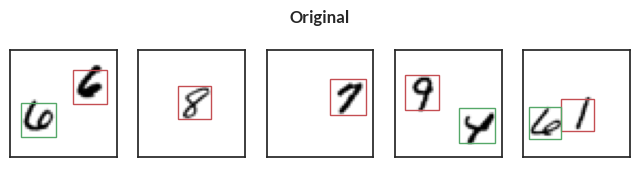

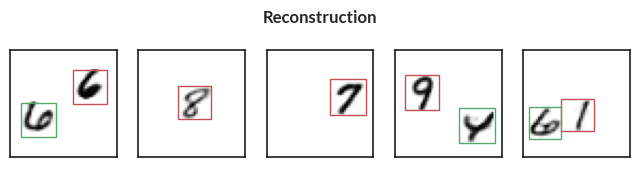

Epoch=175, total_epoch_step_time=614.56, loss=645.49
accuracy=0.9834499955177307, counts=[[19942     6     0     0]
 [    4 19947    69     0]
 [    0   911 19118     3]]


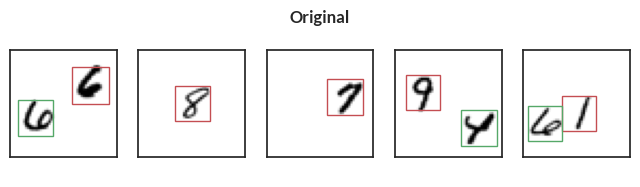

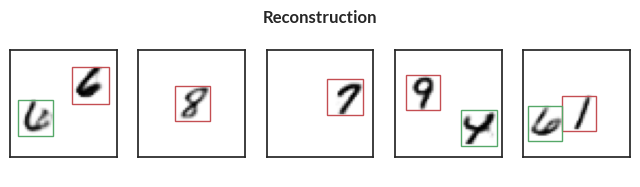

Epoch=176, total_epoch_step_time=617.95, loss=645.49
accuracy=0.9834666848182678, counts=[[19941     7     0     0]
 [    2 19952    66     0]
 [    4   908 19115     5]]


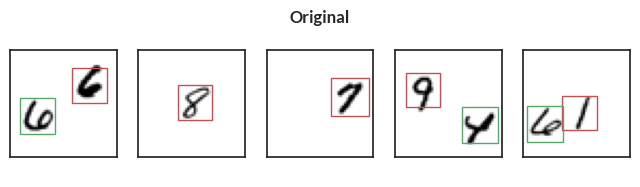

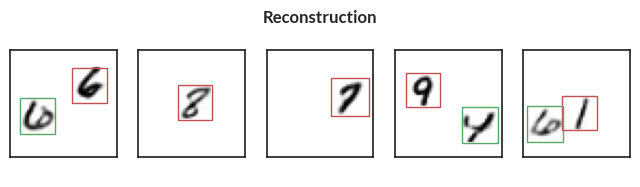

Epoch=177, total_epoch_step_time=621.34, loss=645.56
accuracy=0.9835667014122009, counts=[[19940     8     0     0]
 [    1 19957    62     0]
 [    2   910 19117     3]]


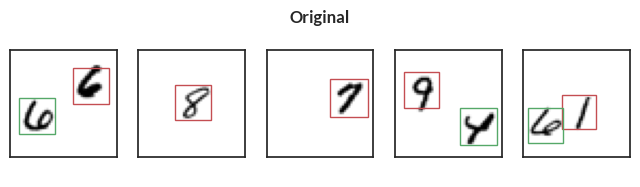

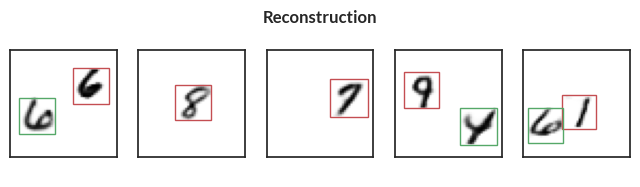

Epoch=178, total_epoch_step_time=624.72, loss=645.58
accuracy=0.9835500121116638, counts=[[19944     4     0     0]
 [    3 19954    63     0]
 [    4   911 19115     2]]


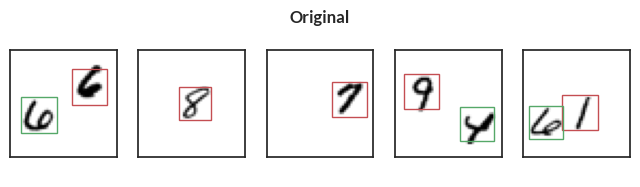

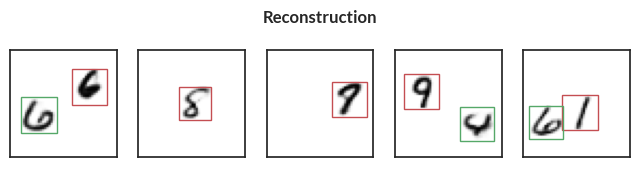

Epoch=179, total_epoch_step_time=628.10, loss=645.59
accuracy=0.9834499955177307, counts=[[19944     4     0     0]
 [    3 19948    69     0]
 [    1   913 19115     3]]


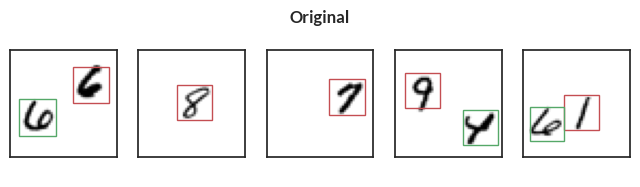

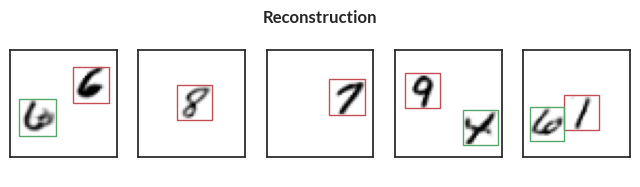

Epoch=180, total_epoch_step_time=631.49, loss=645.53
accuracy=0.9835333228111267, counts=[[19943     5     0     0]
 [    5 19947    68     0]
 [    1   906 19122     3]]


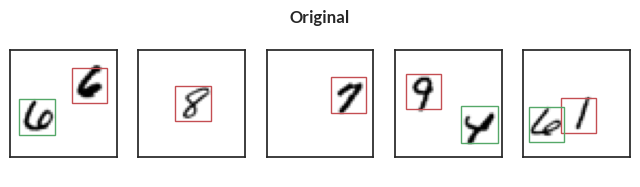

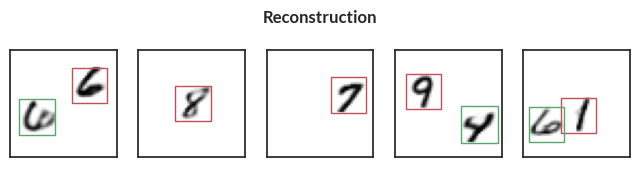

Epoch=181, total_epoch_step_time=634.88, loss=645.65
accuracy=0.9836166501045227, counts=[[19943     5     0     0]
 [    1 19953    66     0]
 [    2   905 19121     4]]


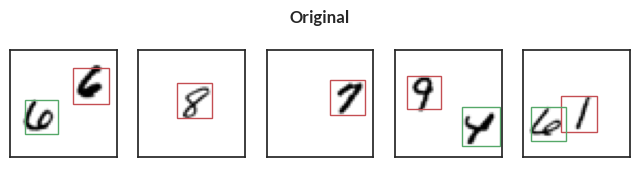

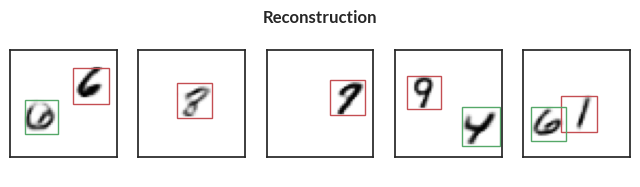

Epoch=182, total_epoch_step_time=638.27, loss=645.54
accuracy=0.9833166599273682, counts=[[19940     8     0     0]
 [    1 19952    67     0]
 [    2   918 19107     5]]


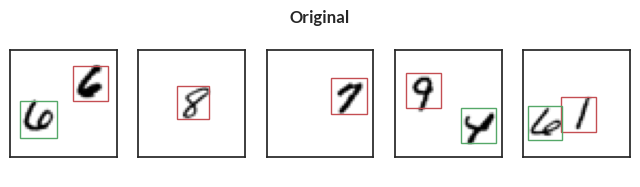

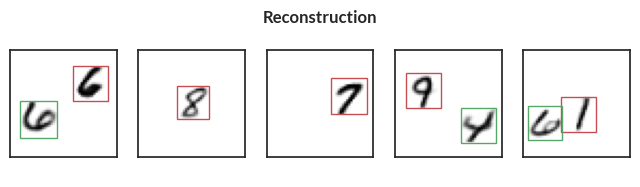

Epoch=183, total_epoch_step_time=641.65, loss=645.67
accuracy=0.9834499955177307, counts=[[19941     7     0     0]
 [    5 19950    65     0]
 [    1   911 19116     4]]


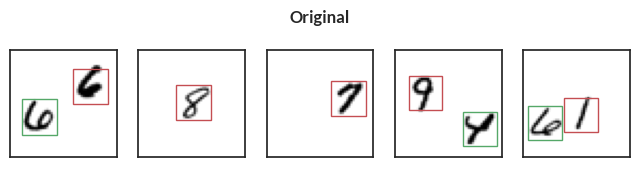

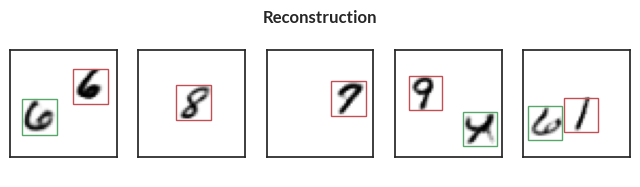

Epoch=184, total_epoch_step_time=645.04, loss=645.56
accuracy=0.9834833145141602, counts=[[19940     8     0     0]
 [    3 19952    65     0]
 [    2   908 19117     5]]


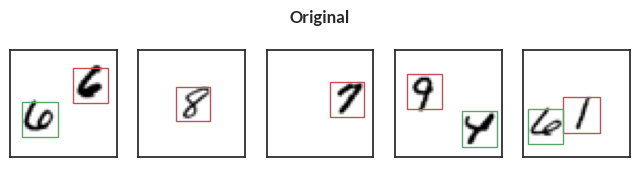

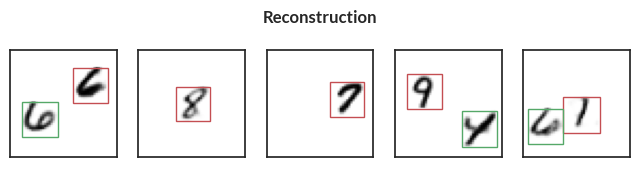

Epoch=185, total_epoch_step_time=648.43, loss=645.66
accuracy=0.9836833477020264, counts=[[19944     4     0     0]
 [    2 19953    65     0]
 [    1   904 19124     3]]


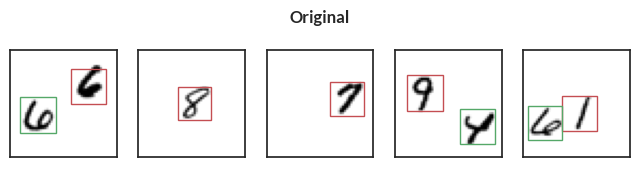

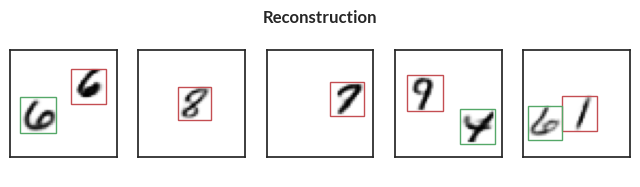

Epoch=186, total_epoch_step_time=651.81, loss=645.70
accuracy=0.9837999939918518, counts=[[19945     3     0     0]
 [    1 19954    65     0]
 [    2   898 19129     3]]


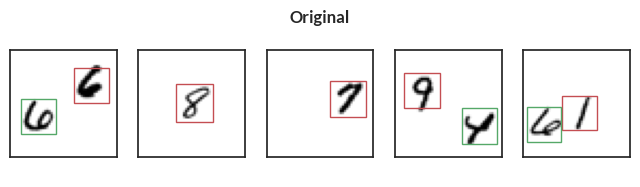

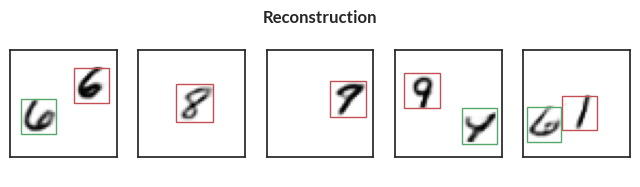

Epoch=187, total_epoch_step_time=655.20, loss=645.69
accuracy=0.9836500287055969, counts=[[19941     7     0     0]
 [    1 19951    68     0]
 [    1   900 19127     4]]


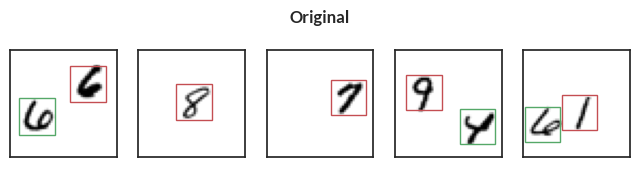

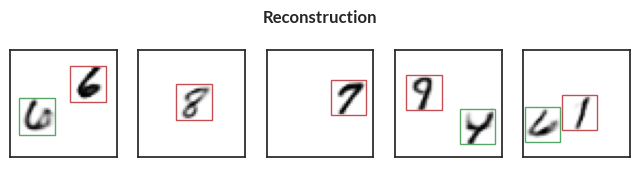

Epoch=188, total_epoch_step_time=658.60, loss=645.76
accuracy=0.9836166501045227, counts=[[19941     7     0     0]
 [    5 19949    66     0]
 [    1   902 19127     2]]


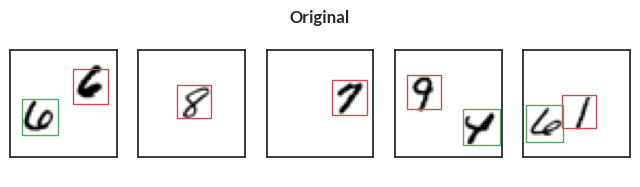

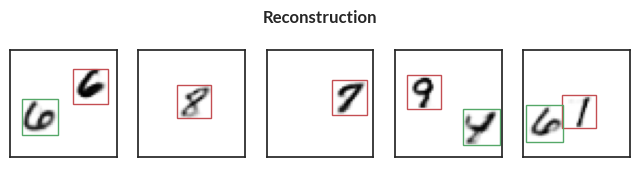

Epoch=189, total_epoch_step_time=661.98, loss=645.73
accuracy=0.9836333394050598, counts=[[19941     7     0     0]
 [    4 19950    66     0]
 [    3   901 19127     1]]


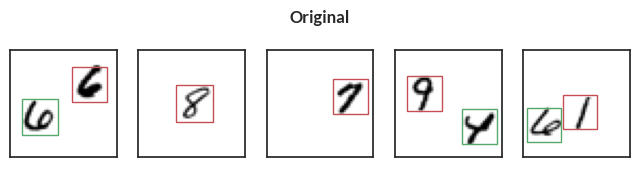

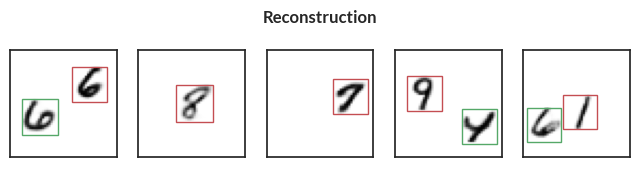

Epoch=190, total_epoch_step_time=665.36, loss=645.79
accuracy=0.9836833477020264, counts=[[19945     3     0     0]
 [    5 19949    66     0]
 [    1   900 19127     4]]


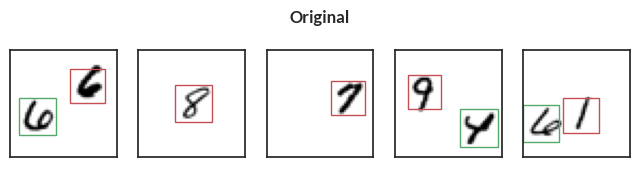

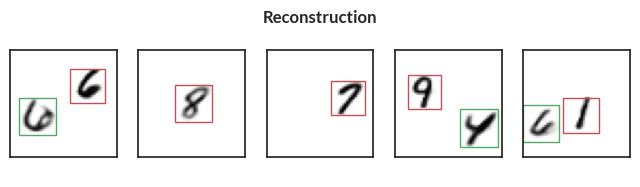

Epoch=191, total_epoch_step_time=668.75, loss=645.75
accuracy=0.9836166501045227, counts=[[19941     7     0     0]
 [    2 19953    65     0]
 [    1   906 19123     2]]


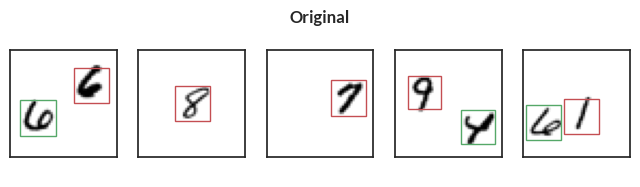

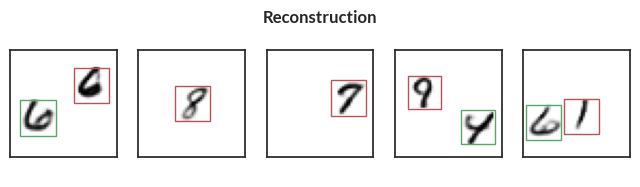

Epoch=192, total_epoch_step_time=672.14, loss=645.76
accuracy=0.9833666682243347, counts=[[19940     8     0     0]
 [    7 19943    70     0]
 [    1   907 19119     5]]


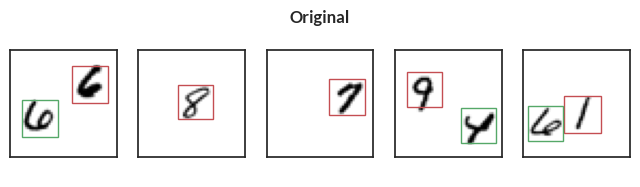

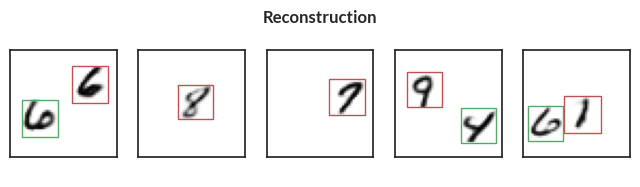

Epoch=193, total_epoch_step_time=675.53, loss=645.78
accuracy=0.9836833477020264, counts=[[19941     7     0     0]
 [    2 19951    67     0]
 [    2   899 19129     2]]


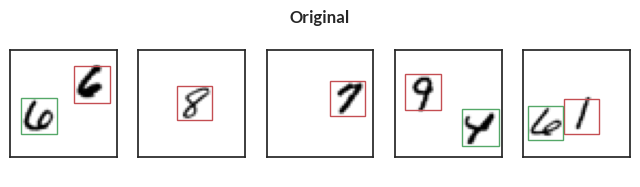

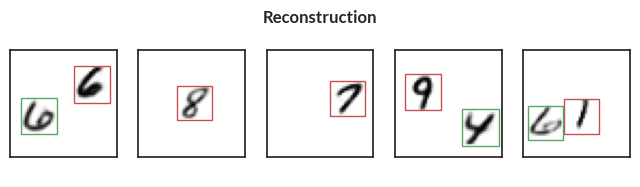

Epoch=194, total_epoch_step_time=679.03, loss=645.83
accuracy=0.9833166599273682, counts=[[19938    10     0     0]
 [    4 19947    69     0]
 [    1   914 19114     3]]


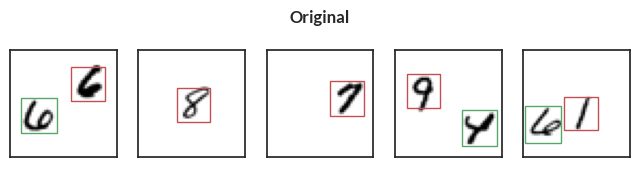

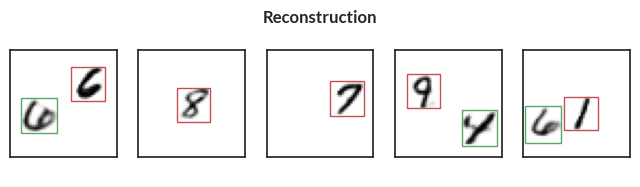

Epoch=195, total_epoch_step_time=682.42, loss=645.78
accuracy=0.9834166765213013, counts=[[19942     6     0     0]
 [    5 19943    72     0]
 [    2   906 19120     4]]


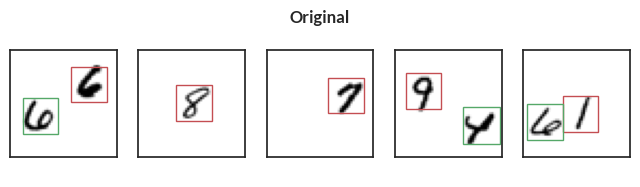

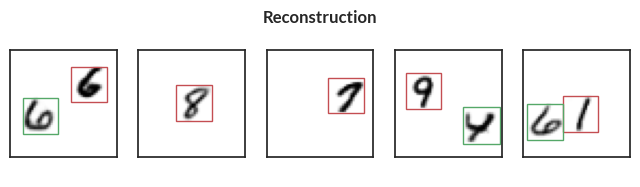

Epoch=196, total_epoch_step_time=685.80, loss=645.83
accuracy=0.9836166501045227, counts=[[19946     2     0     0]
 [    2 19954    64     0]
 [    3   908 19117     4]]


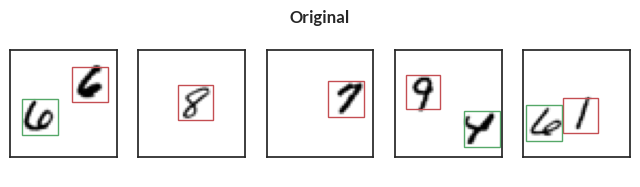

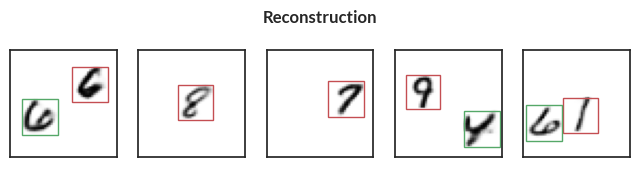

Epoch=197, total_epoch_step_time=689.19, loss=645.84
accuracy=0.9835833311080933, counts=[[19940     8     0     0]
 [    0 19955    65     0]
 [    0   907 19120     5]]


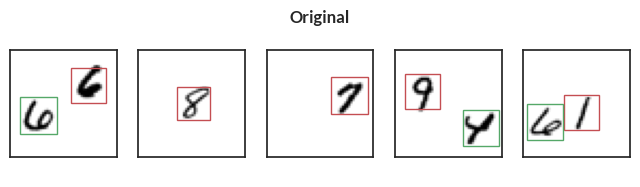

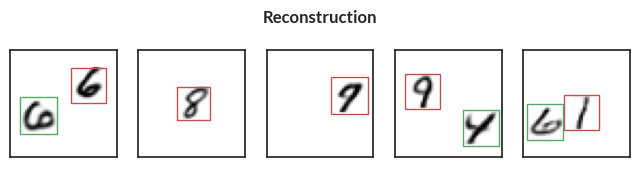

Epoch=198, total_epoch_step_time=692.58, loss=645.88
accuracy=0.9834333658218384, counts=[[19940     8     0     0]
 [    2 19952    66     0]
 [    1   914 19114     3]]


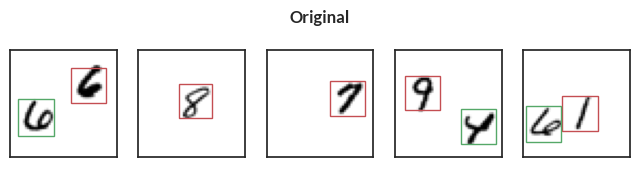

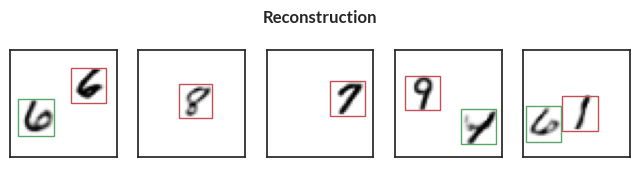

Epoch=199, total_epoch_step_time=695.96, loss=645.82
accuracy=0.9837333559989929, counts=[[19941     7     0     0]
 [    2 19951    67     0]
 [    1   898 19132     1]]


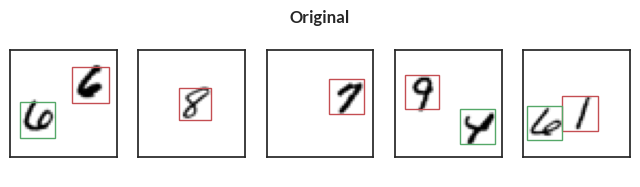

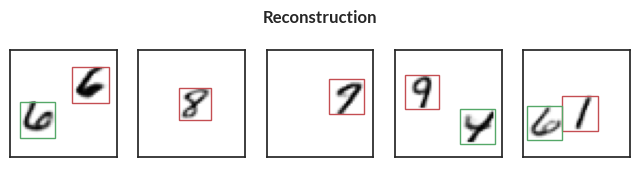

Epoch=200, total_epoch_step_time=699.36, loss=645.84
accuracy=0.9835833311080933, counts=[[19946     2     0     0]
 [    6 19948    66     0]
 [    2   905 19121     4]]


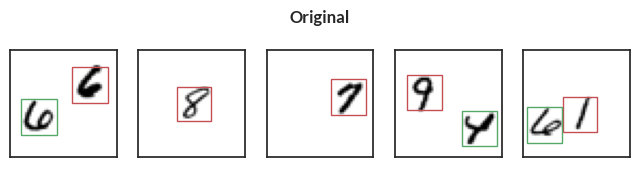

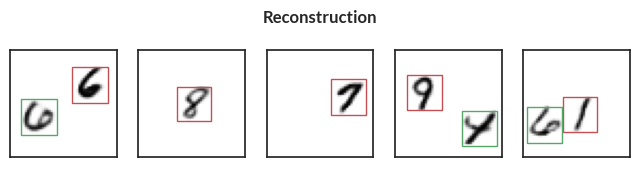

In [19]:
key, sub_key = jax.random.split(key)
losses, accuracy, wall_clock_times, params = train(
    sub_key, learning_rate=1.0e-3, n=2, batch_size=64, num_epochs=200
)

In [20]:
arr = np.array([losses, accuracy, wall_clock_times])
df = pd.DataFrame(arr.T, columns=["ELBO Loss", "Accuracy", "Epoch wall clock times"])
df.to_csv(
    "./training_runs/grasp_air_iwae_2_mvd_epochs_201_mccoy_prior.csv", index=False
)